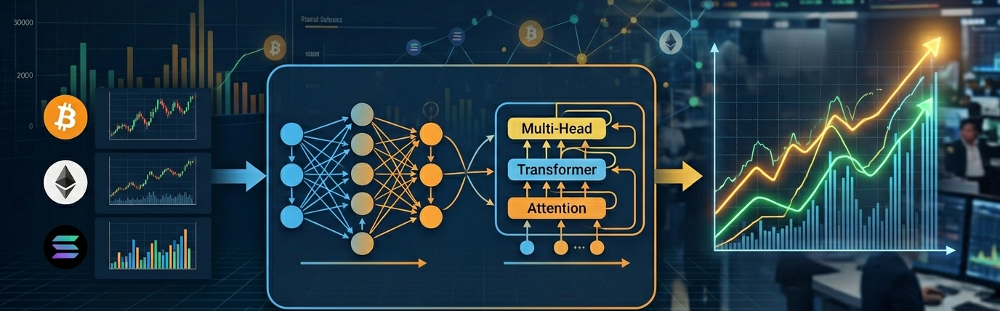

---

<font face="Times New Roman" size=11><b>A Hybrid LSTM-Transformer Approach for Cryptocurrency Price Forecasting</b></font>


<font face="Times New Roman" size=5> Nicolás Linares Rojas - 2230027 <font>


<font face="Times New Roman" size=5> Ivan Augusto Camargo - 2230033 <font>

<font face="Times New Roman" size=5> Daniel Aguilar Navas  - 2230034 <font>

---

<font face="Times New Roman" size=5>Universidad Industrial de Santander (UIS) — Inteligencia Artificial III</font>

---

# Índice

1. [🗺️ Imports](#1)

2. [🔍 Extracción y Fusión de Datos (Dataset Multiescala)](#2)

3. [⏳ Análisis Exploratorio de Datos (EDA)](#3)

4. [🧠 Preprocesamiento: Estacionariedad, Escalado y Secuencias)](#4)

5. [🌌 Positional Encoding ](#5)

6. [🤖 Arquitectura Híbrida: Parallel LSTM-Transformer](#6)

7. [📊 Selección de Variables: XGBoost + SHAP](#7)

8. [🧱 Benchmark Multimodelo: Híbrido vs Baselines](#8)

9. [📊 Visualización de Métricas Comparativas](#9)

10. [✂️ Experimentos](#10)

   * [🤖 Experimento 1: Re-introducción de la Arquitectura Híbrida GRU-Transformer](#10.1)
   * [🤖 Experimento 2: Integración de la Volatility Directional Loss](#10.2)
   * [🤖 Experimentos 3: Longitud de Secuencia](#10.3)
   * [🤖 Experimento 4: Dynamic VIX-Weighted Loss (State-of-the-art approach)](#10.4)
   * [🤖 Experimento 5: Pruebas ACF y PACF](#10.5)
   * [🤖 Experimento 6: Pruebas Finales PACF, ACF y Dynamic VIX](#10.6)
   * [🤖 Experimento 7: Elaboracion con ETH y SOL e Importación de Modulos para Predicciones a TradingView](#10.7)
   * [🤖 Experimento 8: Dinámicas de Aprendizaje y Tolerancia al Sobreajuste (Epoch Analysis)](#10.8)
   * [🤖 Experimento 9: Estudio de Ablación sobre Representación Espacial y Optimización](#10.9)
   * [🤖 Experimento 10: Benchmark Final con Configuraciones Óptimas](#10.10)


---

---

## 1. Imports

In [ ]:
#@title 1. Imports and setup
!pip install yfinance pandas scikit-learn torch seaborn pandas_ta
import pandas_ta as ta

import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler,RobustScaler # <-- Añadido StandardScaler
import torch
import torch.nn as nn
import math
import warnings
warnings.filterwarnings('ignore')

# Configurar el dispositivo (GPU si está disponible)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.3/240.3 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 96.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 63.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 MB 11.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.43.0
    Uninstalling llvmlite-0.43.0:
      Successfully uninstalled llvmlite-0.43.0
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninsta

ImportError: cannot import name '_center' from 'numpy._core.umath' (/usr/local/lib/python3.12/dist-packages/numpy/_core/umath.py)

In [ ]:
#@title 1b. Imports (ejecutar DESPUÉS del reinicio)

import pandas_ta as ta
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import warnings
import xgboost as xgb

from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

warnings.filterwarnings('ignore')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


---
## 2. Extracción y Fusión de Datos (Dataset Multiescala)

Descargamos datos en tres temporalidades: **Diario**, **Horario** y **15 minutos**.
Los activos cubren:
- **Bitcoin (BTC-USD):** OHLCV completo → base para indicadores técnicos.
- **Contexto cripto:** Ethereum (ETH).
- **Macro:** S&P 500, NASDAQ, DXY, US 10Y Yield, VIX.
- **Commodities:** Oro, Petróleo.

Los valores nulos generados por cierres de mercados tradicionales se imputan con **Forward Fill**, dado que Bitcoin opera 24/7.

In [ ]:
#@title 2. Extracción y Fusión de Datos

macro_tickers = ['ETH-USD', '^GSPC', '^IXIC', 'DX-Y.NYB', '^TNX', '^VIX', 'GC=F', 'CL=F']

def obtener_datos_completos(intervalo, periodo):
    print(f"\nDescargando intervalo: {intervalo} (Periodo: {periodo})...")

    # A. OHLCV de Bitcoin
    df_btc = yf.download('BTC-USD', period=periodo, interval=intervalo)
    if isinstance(df_btc.columns, pd.MultiIndex):
        df_btc.columns = df_btc.columns.droplevel(1)
    df_btc = df_btc[['Open', 'High', 'Low', 'Close', 'Volume']].copy()

    # B. Contexto Macro
    df_macro = yf.download(macro_tickers, period=periodo, interval=intervalo)['Close']
    df_macro = df_macro.ffill()

    # C. Fusión
    df = df_btc.join(df_macro, how='left')
    df.ffill(inplace=True)
    df.rename(columns={
        'Close': 'Target_BTC', 'Volume': 'BTC_Volume',
        'ETH-USD': 'Context_ETH', '^GSPC': 'Macro_SP500', '^IXIC': 'Macro_NASDAQ',
        'DX-Y.NYB': 'Macro_DXY', '^TNX': 'Macro_US10Y', '^VIX': 'Sentiment_VIX',
        'GC=F': 'Commodity_Gold', 'CL=F': 'Commodity_Oil'
    }, inplace=True)

    # D. Indicadores Técnicos
    df['SMA_200'] = ta.sma(df['Target_BTC'], length=200)
    df['EMA_9']   = ta.ema(df['Target_BTC'], length=9)
    df['EMA_200'] = ta.ema(df['Target_BTC'], length=200)
    df['VWAP']    = ta.vwap(high=df['High'], low=df['Low'],
                             close=df['Target_BTC'], volume=df['BTC_Volume'])
    df['RSI_14']  = ta.rsi(df['Target_BTC'], length=14)
    macd = ta.macd(df['Target_BTC'], fast=12, slow=26, signal=9)
    df['MACD_Line'] = macd['MACD_12_26_9']
    df['MACD_Hist'] = macd['MACDh_12_26_9']
    df['MFI_60']  = ta.mfi(high=df['High'], low=df['Low'],
                            close=df['Target_BTC'], volume=df['BTC_Volume'], length=60)
    hlc3 = (df['High'] + df['Low'] + df['Target_BTC']) / 3
    esa  = ta.ema(hlc3, length=9)
    d    = ta.ema(abs(hlc3 - esa), length=9)
    ci   = (hlc3 - esa) / (0.015 * d)
    df['WT1'] = ta.ema(ci, length=12)
    df['WT2'] = ta.sma(df['WT1'], length=3)

    df.drop(columns=['Open', 'High', 'Low'], inplace=True)
    df.dropna(inplace=True)
    columnas_ordenadas = ['Target_BTC'] + [c for c in df.columns if c != 'Target_BTC']
    df = df[columnas_ordenadas]

    print(f"  → Shape final: {df.shape}")
    return df

df_diario_ext  = obtener_datos_completos(intervalo="1d",  periodo="max")
df_horario_ext = obtener_datos_completos(intervalo="1h",  periodo="730d")
df_15m_ext     = obtener_datos_completos(intervalo="15m", periodo="60d")


Descargando intervalo: 1d (Periodo: max)...


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  8 of 8 completed


  → Shape final: (3118, 20)

Descargando intervalo: 1h (Periodo: 730d)...


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  8 of 8 completed


  → Shape final: (15316, 20)

Descargando intervalo: 15m (Periodo: 60d)...


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  8 of 8 completed

  → Shape final: (5413, 20)


🎨 Generando gráfico de partición de datos para la presentación...


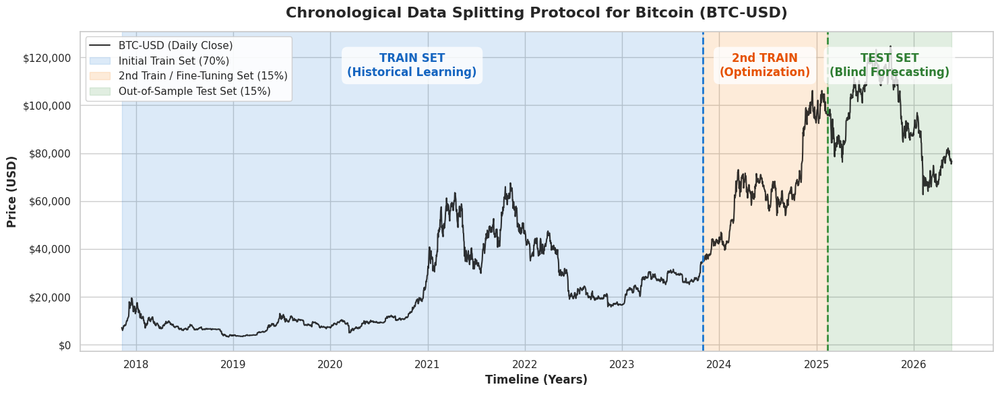

In [ ]:
#@title Visualización Gráfica de la Partición de Datos (Train / 2nd Train / Test)
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print("🎨 Generando gráfico de partición de datos para la presentación...")

# 1. Extraer los datos de precio y fechas (Temporalidad Diaria)
fechas = df_diario_ext.index
precios = df_diario_ext['Target_BTC'].values
N = len(precios)

# 2. Definir los porcentajes de la partición (Ejemplo: 70% Train, 15% 2nd Train/Val, 15% Test)
# Puedes ajustar estos porcentajes si en tu narrativa usaste otra proporción
pct_train = 0.70
pct_2nd_train = 0.15

idx_train_end = int(N * pct_train)
idx_2nd_train_end = int(N * (pct_train + pct_2nd_train))

# 3. Configuración estética del gráfico (Estilo CVPR/IEEE)
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(15, 6))

# Dibujar la línea de precio completa
ax.plot(fechas, precios, color='black', linewidth=1.5, alpha=0.8, label='BTC-USD (Daily Close)')

# 4. Colorear los fondos (Background Spans) para cada partición
# Zona 1: Train Set
ax.axvspan(fechas[0], fechas[idx_train_end],
           color='#1976D2', alpha=0.15, label='Initial Train Set (70%)')

# Zona 2: 2nd Train / Validation Set
ax.axvspan(fechas[idx_train_end], fechas[idx_2nd_train_end],
           color='#F57C00', alpha=0.15, label='2nd Train / Fine-Tuning Set (15%)')

# Zona 3: Test Set (Out-of-Sample)
ax.axvspan(fechas[idx_2nd_train_end], fechas[-1],
           color='#388E3C', alpha=0.15, label='Out-of-Sample Test Set (15%)')

# 5. Añadir líneas divisorias punteadas
ax.axvline(fechas[idx_train_end], color='#1976D2', linestyle='--', linewidth=2)
ax.axvline(fechas[idx_2nd_train_end], color='#388E3C', linestyle='--', linewidth=2)

# 6. Añadir texto centrado en cada zona para mayor claridad visual
y_text = precios.max() * 0.90 # Altura a la que aparecerá el texto

# Texto Train
ax.text(fechas[int(idx_train_end / 2)], y_text,
        'TRAIN SET\n(Historical Learning)',
        horizontalalignment='center', fontsize=12, fontweight='bold', color='#1565C0',
        bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', boxstyle='round,pad=0.5'))

# Texto 2nd Train
ax.text(fechas[idx_train_end + int((idx_2nd_train_end - idx_train_end) / 2)], y_text,
        '2nd TRAIN\n(Optimization)',
        horizontalalignment='center', fontsize=12, fontweight='bold', color='#E65100',
        bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', boxstyle='round,pad=0.5'))

# Texto Test
ax.text(fechas[idx_2nd_train_end + int((N - idx_2nd_train_end) / 2)], y_text,
        'TEST SET\n(Blind Forecasting)',
        horizontalalignment='center', fontsize=12, fontweight='bold', color='#2E7D32',
        bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', boxstyle='round,pad=0.5'))

# 7. Detalles finales
ax.set_title('Chronological Data Splitting Protocol for Bitcoin (BTC-USD)', fontsize=16, fontweight='bold', pad=15)
ax.set_ylabel('Price (USD)', fontsize=12, fontweight='bold')
ax.set_xlabel('Timeline (Years)', fontsize=12, fontweight='bold')
ax.legend(loc='upper left', fontsize=11, framealpha=0.9)

# Formatear el eje Y para que muestre el símbolo de dólar ($)
import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('${x:,.0f}')
ax.yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()

---
## 3. Análisis Exploratorio de Datos (EDA)

Visualizamos las series temporales de los activos más relevantes para entender las correlaciones
macroeconómicas con Bitcoin: renta variable global, fuerza del dólar y sentimiento de mercado.

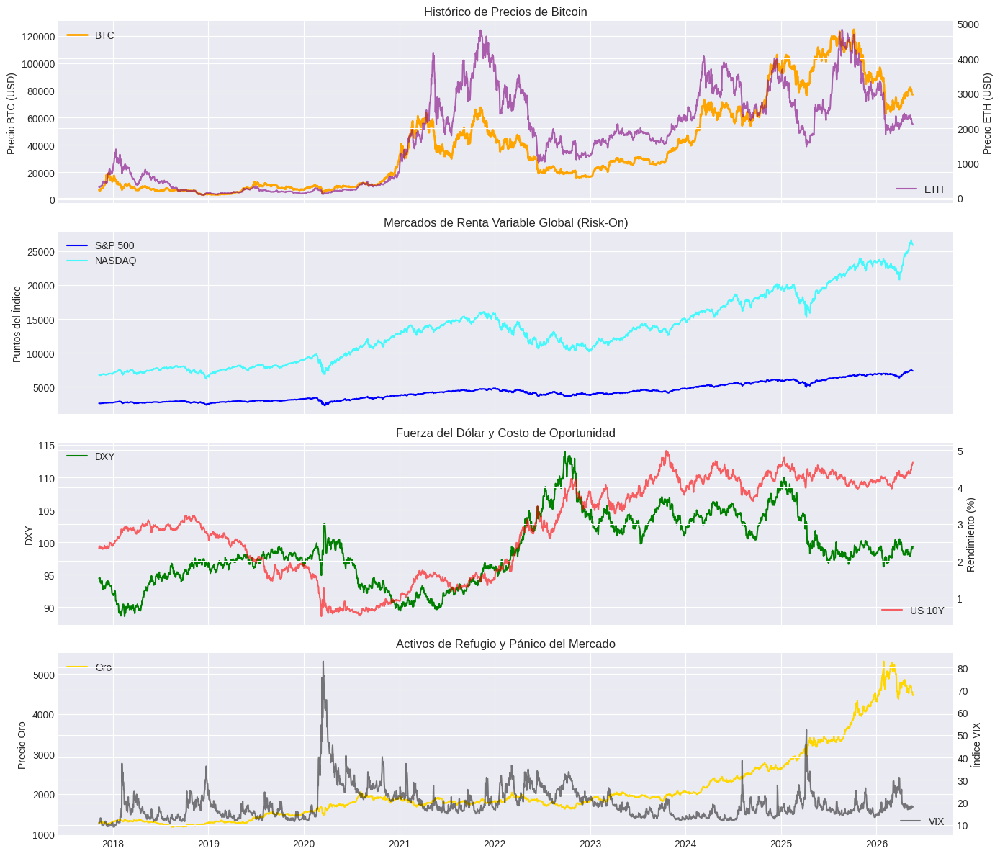

In [ ]:
#@title 3. EDA — Series Temporales Multimodales

plt.style.use('seaborn-v0_8-darkgrid')
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(14, 12), sharex=True)

ax1 = axes[0]
ax1.plot(df_diario_ext.index, df_diario_ext['Target_BTC'], color='orange', label='BTC', linewidth=2)
ax1.set_ylabel('Precio BTC (USD)')
ax1.set_title('Histórico de Precios de Bitcoin')
ax1.legend(loc='upper left')
ax1_twin = ax1.twinx()
ax1_twin.plot(df_diario_ext.index, df_diario_ext['Context_ETH'], color='purple', alpha=0.6, label='ETH')
ax1_twin.set_ylabel('Precio ETH (USD)')
ax1_twin.legend(loc='lower right')

axes[1].plot(df_diario_ext.index, df_diario_ext['Macro_SP500'],  color='blue',  label='S&P 500')
axes[1].plot(df_diario_ext.index, df_diario_ext['Macro_NASDAQ'], color='cyan', alpha=0.7, label='NASDAQ')
axes[1].set_ylabel('Puntos del Índice')
axes[1].set_title('Mercados de Renta Variable Global (Risk-On)')
axes[1].legend(loc='upper left')

axes[2].plot(df_diario_ext.index, df_diario_ext['Macro_DXY'], color='green', label='DXY')
axes[2].set_ylabel('DXY')
axes[2].set_title('Fuerza del Dólar y Costo de Oportunidad')
axes[2].legend(loc='upper left')
ax2_twin = axes[2].twinx()
ax2_twin.plot(df_diario_ext.index, df_diario_ext['Macro_US10Y'], color='red', alpha=0.6, label='US 10Y')
ax2_twin.set_ylabel('Rendimiento (%)')
ax2_twin.legend(loc='lower right')

axes[3].plot(df_diario_ext.index, df_diario_ext['Commodity_Gold'], color='gold', label='Oro')
axes[3].set_ylabel('Precio Oro')
axes[3].set_title('Activos de Refugio y Pánico del Mercado')
axes[3].legend(loc='upper left')
ax3_twin = axes[3].twinx()
ax3_twin.plot(df_diario_ext.index, df_diario_ext['Sentiment_VIX'], color='black', alpha=0.5, label='VIX')
ax3_twin.set_ylabel('Índice VIX')
ax3_twin.legend(loc='lower right')

plt.tight_layout()
plt.show()

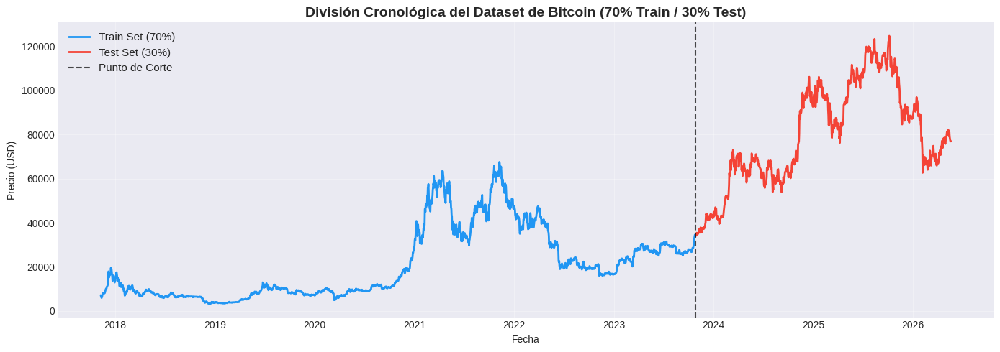

In [ ]:
#@title 3b. Visualización: División Train / Test Cronológica

plt.figure(figsize=(14, 5))
train_size_vis = int(len(df_diario_ext) * 0.7)
fechas  = df_diario_ext.index
precios = df_diario_ext['Target_BTC'].values

plt.plot(fechas[:train_size_vis], precios[:train_size_vis],
         label='Train Set (70%)', color='#2196F3', linewidth=2)
plt.plot(fechas[train_size_vis:], precios[train_size_vis:],
         label='Test Set (30%)', color='#F44336', linewidth=2)
plt.axvline(x=fechas[train_size_vis], color='black', linestyle='--',
            label='Punto de Corte', alpha=0.7)
plt.title('División Cronológica del Dataset de Bitcoin (70% Train / 30% Test)',
          fontsize=14, fontweight='bold')
plt.ylabel('Precio (USD)')
plt.xlabel('Fecha')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

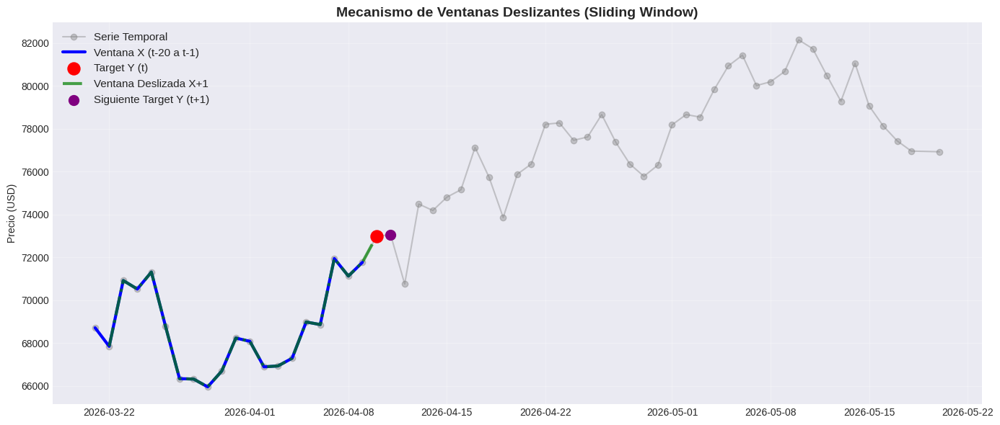

In [ ]:
#@title 3c. Visualización: Mecanismo de Sliding Window

zoom_slice   = 60
seq_len_demo = 20
fechas_demo  = df_diario_ext.index[-zoom_slice:]
precios_demo = df_diario_ext['Target_BTC'].values[-zoom_slice:]

plt.figure(figsize=(14, 6))
plt.plot(fechas_demo, precios_demo, marker='o', color='gray', alpha=0.4, label='Serie Temporal')
plt.plot(fechas_demo[:seq_len_demo], precios_demo[:seq_len_demo],
         color='blue', linewidth=3, label=f'Ventana X (t-{seq_len_demo} a t-1)')
plt.scatter(fechas_demo[seq_len_demo], precios_demo[seq_len_demo],
            color='red', s=150, zorder=5, label='Target Y (t)')
plt.plot(fechas_demo[1:seq_len_demo+1], precios_demo[1:seq_len_demo+1],
         color='green', linewidth=3, linestyle='-.', alpha=0.7, label='Ventana Deslizada X+1')
plt.scatter(fechas_demo[seq_len_demo+1], precios_demo[seq_len_demo+1],
            color='purple', s=100, zorder=5, label='Siguiente Target Y (t+1)')
plt.title('Mecanismo de Ventanas Deslizantes (Sliding Window)', fontsize=14, fontweight='bold')
plt.ylabel('Precio (USD)')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

---
## 4. Preprocesamiento: Estacionariedad, Escalado y Secuencias

Para que los modelos de deep learning aprendan patrones y no solo memoricen tendencias,
transformamos cada variable según su distribución estadística:

| Transformación | Variables | Escalador |
|---|---|---|
| Log-Return | BTC, ETH, Gold, SP500, NASDAQ, DXY, SMAs, VWAP | StandardScaler |
| Log-Return | BTC Volume | StandardScaler |
| Pct Change | Commodity Oil | RobustScaler |
| Diff | US10Y | StandardScaler |
| Diff | VIX, MACD Line, MACD Hist | RobustScaler |
| Diff | RSI, MFI, WT1, WT2 | MinMaxScaler [-1,1] |

El **target** es el log-precio de BTC en t+1, normalizado con StandardScaler independiente.
Todos los escaladores se ajustan exclusivamente sobre el **70% de entrenamiento** para evitar
data leakage.

In [ ]:
#@title 4a. Definición de Grupos de Columnas

cols_log_return = [
    'Target_BTC', 'Context_ETH', 'Commodity_Gold',
    'Macro_SP500', 'Macro_NASDAQ', 'Macro_DXY',
    'SMA_200', 'EMA_9', 'EMA_200', 'VWAP'
]
cols_volume     = ['BTC_Volume']
cols_pct_robust = ['Commodity_Oil']
cols_diff_std   = ['Macro_US10Y']
cols_diff_robust = ['Sentiment_VIX', 'MACD_Line', 'MACD_Hist']
cols_diff_minmax = ['RSI_14', 'MFI_60', 'WT1', 'WT2']

print("✅ Grupos de columnas definidos.")

✅ Grupos de columnas definidos.


In [ ]:
#@title 4b. Funciones: create_sequences y preparación para Walk-Forward

def create_sequences(features, target, seq_length=100, pred_length=7):
    """
    Crea secuencias:
    X = ventana de 'seq_length' días (ej. 100)
    y = ventana de 'pred_length' días futuros continuos (ej. 7) -> Direct Multi-step
    """
    X, y = [], []
    # Restamos seq_length y pred_length para asegurar que tengamos espacio para los 7 días futuros
    for i in range(len(features) - seq_length - pred_length + 1):
        X.append(features[i:(i + seq_length)])
        y.append(target[i + seq_length : i + seq_length + pred_length])

    return (torch.tensor(np.array(X), dtype=torch.float32),
            torch.tensor(np.array(y), dtype=torch.float32))


def preparacion_datos_base(df_fuente, nombre):
    """
    Preprocesamiento orientado a extraer features y TARGET (LOG-RETURNS diarios).
    Nota: NO ESCLAMOS AQUÍ. El escalado se hará ventana por ventana en el bucle Walk-Forward.
    """
    dataset = df_fuente.copy()

    # 1. Target Estricto: Log-Returns diarios de BTC
    # r_t = ln(P_t / P_{t-1})
    dataset['Target_Log_Return'] = np.log(dataset['Target_BTC'] / dataset['Target_BTC'].shift(1))
    dataset['Absolute_BTC'] = dataset['Target_BTC'] # Guardado solo para reconstrucción final

    print(f"\n{'='*60}")
    print(f"[{nombre}] Shape inicial: {dataset.shape}")

    # 2. Transformaciones de features hacia estacionariedad (Si existen en tu df)
    # Definir listas vacías por si no están definidas globalmente
    c_log = globals().get('cols_log_return', [])
    c_vol = globals().get('cols_volume', [])
    c_pct = globals().get('cols_pct_robust', [])
    c_diff = globals().get('cols_diff_std', []) + globals().get('cols_diff_robust', []) + globals().get('cols_diff_minmax', [])

    for col in c_log + c_vol:
        if col in dataset.columns: dataset[col] = np.log(dataset[col] / dataset[col].shift(1))
    for col in c_pct:
        if col in dataset.columns: dataset[col] = dataset[col].pct_change()
    for col in c_diff:
        if col in dataset.columns: dataset[col] = dataset[col].diff()

    # Limpiar NaNs producto de shift/diff
    dataset.replace([np.inf, -np.inf], np.nan, inplace=True)
    dataset.dropna(inplace=True)

    # 3. Selección de features
    EXCLUDE = {'Target_BTC', 'Target_Log_Return', 'Absolute_BTC'}
    all_feats = [c for c in dataset.columns if c not in EXCLUDE]

    # Filtrar según las features obtenidas por XGBoost (si ya se corrió la celda 7)
    if 'top_features' in globals():
        feature_cols = [f for f in top_features if f in dataset.columns and f not in EXCLUDE]
        if len(feature_cols) < 5:
            feature_cols = all_feats
    else:
        feature_cols = all_feats

    # Separar Dataset en Features y Target puro (en formato numpy sin escalar)
    features_raw = dataset[feature_cols].values
    target_raw = dataset['Target_Log_Return'].values
    precios_absolutos = dataset['Absolute_BTC'].values

    print(f"[{nombre}] Shape final tras limpieza: {dataset.shape}")
    print(f"[{nombre}] Features seleccionadas: {len(feature_cols)}")

    return {
        'dataset_completo': dataset,
        'features_raw': features_raw,
        'target_raw': target_raw,
        'precios_absolutos': precios_absolutos,
        'feature_cols': feature_cols
    }

print("✅ Función create_sequences (multi-step) y preparacion_datos_base definidas.")

✅ Función create_sequences (multi-step) y preparacion_datos_base definidas.


---
## 5. Positional Encoding

El bloque Transformer carece de recurrencia secuencial nativa. Para inyectarle
información del orden temporal usamos funciones sinusoidales:

$$PE_{(pos,\,2i)} = \sin\!\left(\frac{pos}{10000^{\,2i/d_{\text{model}}}}\right)
\qquad
PE_{(pos,\,2i+1)} = \cos\!\left(\frac{pos}{10000^{\,2i/d_{\text{model}}}}\right)$$

In [ ]:
#@title 5. Positional Encoding

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=5000):
        super(PositionalEncoding, self).__init__()
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        self.pe = pe.unsqueeze(0)
    def forward(self, x):
        return x + self.pe[:, :x.size(1)].to(x.device)


print("✅ PositionalEncoding definido.")

✅ PositionalEncoding definido.


---
## 6. Arquitectura Híbrida: Parallel LSTM-Transformer

Implementamos la arquitectura propuesta en el paper (Figura 4):

1. **Input Projection + Positional Encoding:** proyecta las features al espacio d_model
   e inyecta información posicional sinusoidal.
2. **Global Branch (Transformer):** Multi-Head Self-Attention captura dependencias
   de largo alcance entre toda la ventana temporal.
3. **Local Branch (BiLSTM):** captura micro-dinámicas y mantiene el sesgo inductivo temporal.
4. **Bidirectional Cross-Attention:**
   - T→L: las features locales atienden el contexto global.
   - L→T: las features globales se refinan con señales locales.
5. **Fusion + Predicción:** concatenación → Linear → LayerNorm → salida escalar.

### Función de Pérdida: Volatility-Adjusted Loss

$$\mathcal{L}(y,\hat{y}) = L_{\text{Huber}}(y,\hat{y},\delta) +
\lambda \cdot \frac{1}{N}\sum_{i=1}^{N} \text{ReLU}\!\left(-(m_i^{\text{pred}} \cdot m_i^{\text{true}})\right)$$

donde $m_i = y_i - y_i^{\text{current}}$ es el movimiento desde el precio actual.

In [ ]:
#@title 6. Arquitectura Híbrida LSTM-Transformer + VolatilityAdjustedLoss

class VolatilityDirectionalLoss(nn.Module):
    def __init__(self, delta=1.0, dir_weight=0.5):
        super().__init__()
        self.huber = nn.HuberLoss(delta=delta)
        self.dir_weight = dir_weight

    def forward(self, y_pred, y_true):
        # 1. Aseguramos dimensiones
        y_pred = y_pred.squeeze()
        y_true = y_true.squeeze()

        # 2. Pérdida de Magnitud (Huber es perfecta para ignorar picos atípicos)
        loss_mag = self.huber(y_pred, y_true)

        # 3. Pérdida de Dirección (El secreto del éxito)
        # Extraemos SOLO la dirección de la realidad (+1 si sube, -1 si baja)
        signo_real = torch.sign(y_true)

        # Multiplicamos la predicción por el signo real invertido.
        # - Si la realidad es +, y predices -, esto da positivo (Castigo)
        # - Si la realidad es -, y predices +, esto da positivo (Castigo)
        # - Si aciertas el signo, da negativo y el ReLU lo vuelve 0 (Premio)
        penalizacion = - (y_pred * signo_real)

        # Usamos ReLU para aplicar el castigo.
        loss_dir = torch.mean(torch.relu(penalizacion))

        # 4. Combinamos ambas
        return loss_mag + (self.dir_weight * loss_dir)


class Hybrid_LSTM_Transformer(nn.Module):
    def __init__(self, input_dim, d_model, num_heads,
                 hidden_dim_lstm, num_layers_lstm, dropout=0.2, pred_len=7): # <--- Agregamos pred_len
        super().__init__()

        self.input_projection = nn.Linear(input_dim, d_model)
        self.pos_encoder      = PositionalEncoding(d_model)
        self.input_dropout    = nn.Dropout(dropout)

        self.self_attention = nn.MultiheadAttention(
            embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_t = nn.LayerNorm(d_model)

        self.lstm = nn.LSTM(
            input_size=d_model, hidden_size=d_model // 2,
            num_layers=num_layers_lstm, batch_first=True, bidirectional=True,
            dropout=dropout if num_layers_lstm > 1 else 0.0)
        self.norm_l = nn.LayerNorm(d_model)

        self.cross_attn_T2L = nn.MultiheadAttention(
            embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_T2L = nn.LayerNorm(d_model)

        self.cross_attn_L2T = nn.MultiheadAttention(
            embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_L2T = nn.LayerNorm(d_model)

        self.fusion = nn.Linear(d_model * 2, d_model)
        self.norm_f = nn.LayerNorm(d_model)
        self.drop_f = nn.Dropout(dropout)

        # CAMBIO CLAVE: La salida ahora es pred_len (7) en lugar de 1
        self.output = nn.Linear(d_model, pred_len)

    def forward(self, src):
        x    = self.input_projection(src)
        x_pe = self.input_dropout(self.pos_encoder(x))

        t_out, _ = self.self_attention(x_pe, x_pe, x_pe)
        t_feat   = self.norm_t(x_pe + t_out)

        l_out, _ = self.lstm(x_pe)
        l_feat   = self.norm_l(x_pe + l_out)

        t2l, _ = self.cross_attn_T2L(query=l_feat, key=t_feat, value=t_feat)
        t2l    = self.norm_T2L(l_feat + t2l)

        l2t, _ = self.cross_attn_L2T(query=t_feat, key=l_feat, value=l_feat)
        l2t    = self.norm_L2T(t_feat + l2t)

        fused = torch.relu(self.fusion(torch.cat([t2l, l2t], dim=-1)))
        fused = self.norm_f(fused)

        # Tomamos el último estado de la secuencia [:, -1, :] y proyectamos a 7 días
        return self.output(self.drop_f(fused[:, -1, :]))

print("✅ Hybrid_LSTM_Transformer y VolatilityAdjustedLoss definidos.")

✅ Hybrid_LSTM_Transformer y VolatilityAdjustedLoss definidos.


---
## 7. Selección de Variables: XGBoost + SHAP

Para reducir la dimensionalidad y mitigar la maldición de la dimensionalidad en los módulos
de deep learning, entrenamos un **XGBoost** sobre los retornos logarítmicos de BTC.

Usamos **SHAP (SHapley Additive Explanations)** para rankear las variables por su
contribución marginal promedio al modelo. Solo retenemos las features con importancia
**por encima de la mediana SHAP**, construyendo un espacio de entrada altamente optimizado.

> ⚠️ Para evitar data leakage, todos los features se desplazan un paso (T-1), garantizando
> que el modelo solo aprende de información disponible antes del horizonte de predicción.

✅ Features seleccionadas (10):
['Macro_US10Y', 'BTC_Volume', 'SMA_200', 'EMA_200', 'Sentiment_VIX', 'MACD_Line', 'EMA_9', 'Macro_SP500', 'VWAP', 'RSI_14']


<Figure size 1000x800 with 0 Axes>

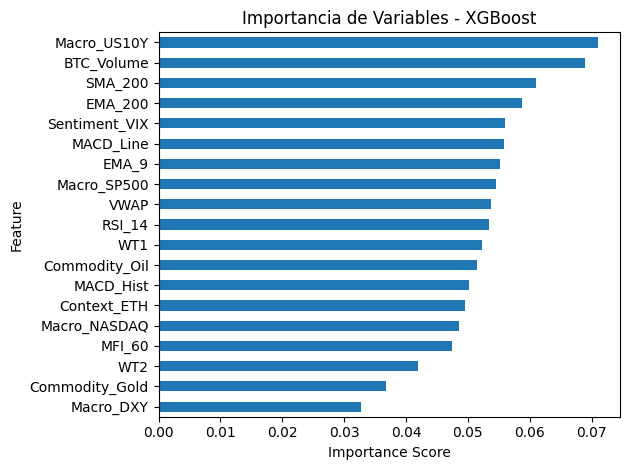

In [ ]:
#@title 7. XGBoost — Selección de Features (sin SHAP)

df_xgb = df_diario_ext.copy()

# Columnas que se transforman
cols_pct_feat = [c for c in (cols_log_return + cols_volume + cols_pct_robust)
                 if c != 'Target_BTC']

# Target: retorno logarítmico de BTC en t+1
df_xgb['Target_Return'] = np.log(df_xgb['Target_BTC']).diff().shift(-1)

# Features: transformar a retornos/diferencias hasta HOY
for col in cols_pct_feat:
    df_xgb[col] = df_xgb[col].pct_change()

for col in cols_diff_std + cols_diff_robust + cols_diff_minmax:
    df_xgb[col] = df_xgb[col].diff()

df_xgb.replace([np.inf, -np.inf], np.nan, inplace=True)
df_xgb.dropna(inplace=True)

feature_cols_xgb = (
    cols_pct_feat +
    cols_diff_std +
    cols_diff_robust +
    cols_diff_minmax
)

X_xgb = df_xgb[feature_cols_xgb]
y_xgb = df_xgb['Target_Return']

# Modelo XGBoost
modelo_xgb = xgb.XGBRegressor(
    n_estimators=150,
    max_depth=4,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

modelo_xgb.fit(X_xgb, y_xgb)

# =========================================================
# IMPORTANCIA DE FEATURES (reemplazo de SHAP)
# =========================================================

importance = modelo_xgb.feature_importances_

importance_df = pd.DataFrame({
    'Feature': feature_cols_xgb,
    'Importance': importance
}).sort_values('Importance', ascending=False)

# Umbral usando mediana
threshold = importance_df['Importance'].median()

top_features = importance_df[
    importance_df['Importance'] >= threshold
]['Feature'].tolist()

print(f"✅ Features seleccionadas ({len(top_features)}):")
print(top_features)

# =========================================================
# GRÁFICO DE IMPORTANCIA
# =========================================================

plt.figure(figsize=(10, 8))

importance_df.sort_values('Importance').plot(
    x='Feature',
    y='Importance',
    kind='barh',
    legend=False
)

plt.title('Importancia de Variables - XGBoost')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

---
## 8. Benchmark Multimodelo: Híbrido vs Baselines

Comparamos nuestra arquitectura contra tres baselines establecidos:

| Modelo | Descripción |
|---|---|
| **Hybrid (Ours)** | BiLSTM + Transformer con cross-attention bidireccional |
| LSTM Baseline | BiLSTM de 2 capas |
| GRU Baseline | BiGRU de 2 capas |
| Transformer Base | Transformer Encoder estándar |

Evaluación en **tres temporalidades** (Diario, Horario, 15-Min) con métricas:
RMSE (USD), MAE (USD), MAPE (%), MDA (%).

> La función de pérdida usada es **VolatilityAdjustedLoss** en todos los modelos,
> garantizando comparación justa.

In [ ]:
#@title 8a. Definición de Modelos Baseline y Función de Entrenamiento ESTA ENTRENANDO CON MSE NO CON VOLATILY LOSS POR AHORA
import copy

# =====================================================================
# 1. Definición de Modelos Baseline (Modificados para Multi-Step)
# =====================================================================
# NOTA: Se modificó la capa de salida para predecir 'pred_length' días
# (7 días en una sola inferencia) en lugar de 1 solo día.

class Baseline_LSTM(nn.Module):
    def __init__(self, input_dim, d_model, pred_length=7):
        super().__init__()
        self.lstm = nn.LSTM(input_dim, d_model, num_layers=2, batch_first=True, bidirectional=True)
        self.fc   = nn.Linear(d_model * 2, pred_length)
    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(out[:, -1, :])

class Baseline_GRU(nn.Module):
    def __init__(self, input_dim, d_model, pred_length=7):
        super().__init__()
        self.gru = nn.GRU(input_dim, d_model, num_layers=2, batch_first=True, bidirectional=True)
        self.fc  = nn.Linear(d_model * 2, pred_length)
    def forward(self, x):
        out, _ = self.gru(x)
        return self.fc(out[:, -1, :])

class Baseline_Transformer(nn.Module):
    def __init__(self, input_dim, d_model, pred_length=7):
        super().__init__()
        self.proj        = nn.Linear(input_dim, d_model)
        self.pe          = PositionalEncoding(d_model)
        enc_layer        = nn.TransformerEncoderLayer(d_model=d_model, nhead=2, batch_first=True)
        self.transformer = nn.TransformerEncoder(enc_layer, num_layers=2)
        self.fc          = nn.Linear(d_model, pred_length)
    def forward(self, x):
        x = self.pe(self.proj(x))
        return self.fc(self.transformer(x)[:, -1, :])

# =====================================================================
# 2. Métricas de Evaluación
# =====================================================================
def calc_metrics(y_real, y_pred, tipo='precio'):
    y_real, y_pred = np.array(y_real).flatten(), np.array(y_pred).flatten()

    real_diff = np.diff(y_real)
    pred_diff = y_pred[1:] - y_real[:-1]

    mse = mean_squared_error(y_real, y_pred)
    mae = mean_absolute_error(y_real, y_pred)
    mape = np.mean(np.abs((y_real - y_pred) / y_real)) * 100
    mda = np.mean(np.sign(real_diff) == np.sign(pred_diff)) * 100

    return {"RMSE": np.sqrt(mse), "MAE": mae, "MAPE (%)": mape, "MDA (%)": mda}

# =====================================================================
# 3. Motor Sliding Walk-Forward Estricto
# =====================================================================
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

def walk_forward_evaluation_with_logs(modelo, data_dict, seq_len=100, pred_len=7, warmup_size=730):
    # --- [Configuración Inicial Igual a la Anterior] ---
    features_raw = data_dict['features_raw']
    target_raw   = data_dict['target_raw']
    precios      = data_dict['precios_absolutos']
    cols         = data_dict['feature_cols']
    N = len(features_raw)

    optimizer = torch.optim.Adam(modelo.parameters(), lr=0.001, weight_decay=1e-4)
    criterion = torch.nn.MSELoss()

    all_reals_usd, all_preds_usd = [], []
    is_warmup = True

    # LISTA PARA GUARDAR LOS LOGS
    wf_logs = []

    # Identificar índices de columnas (igual que antes)
    idx_std = [i for i, c in enumerate(cols) if c in cols_log_return + cols_volume + cols_diff_std]
    idx_rob = [i for i, c in enumerate(cols) if c in cols_pct_robust + cols_diff_robust]
    idx_mm  = [i for i, c in enumerate(cols) if i not in idx_std + idx_rob]

    for t in range(warmup_size, N - pred_len + 1, pred_len):

        # --- [Escalado y Creación de Secuencias Igual a la Anterior] ---
        train_F = features_raw[t - warmup_size : t]
        train_T = target_raw[t - warmup_size : t]
        sc_std, sc_rob, sc_mm = StandardScaler(), RobustScaler(), MinMaxScaler(feature_range=(-1, 1))
        scaler_t = StandardScaler()

        train_F_sc = np.zeros_like(train_F)
        if idx_std: train_F_sc[:, idx_std] = sc_std.fit_transform(train_F[:, idx_std])
        if idx_rob: train_F_sc[:, idx_rob] = sc_rob.fit_transform(train_F[:, idx_rob])
        if idx_mm:  train_F_sc[:, idx_mm]  = sc_mm.fit_transform(train_F[:, idx_mm])
        train_T_sc = scaler_t.fit_transform(train_T.reshape(-1, 1)).flatten()

        X_tr, y_tr = create_sequences(train_F_sc, train_T_sc, seq_length=seq_len, pred_length=pred_len)
        loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)

        test_F_raw = features_raw[t - seq_len : t]
        test_F_sc  = np.zeros_like(test_F_raw)
        if idx_std: test_F_sc[:, idx_std] = sc_std.transform(test_F_raw[:, idx_std])
        if idx_rob: test_F_sc[:, idx_rob] = sc_rob.transform(test_F_raw[:, idx_rob])
        if idx_mm:  test_F_sc[:, idx_mm]  = sc_mm.transform(test_F_raw[:, idx_mm])

        x_infer = torch.tensor(test_F_sc, dtype=torch.float32).unsqueeze(0).to(device)
        real_prices_test = precios[t : t + pred_len]
        P_t = precios[t - 1]

        # --- ENTRENAMIENTO ---
        epochs = 15 if is_warmup else 2
        tipo_entrenamiento = "Inicial" if is_warmup else "Recalibración"

        for ep in range(epochs):
            modelo.train()
            batch_losses = []
            for xb, yb in loader:
                optimizer.zero_grad()
                preds = modelo(xb.to(device))
                loss = criterion(preds, yb.to(device))
                loss.backward()
                optimizer.step()
                batch_losses.append(loss.item())

            # EVALUACIÓN Y GUARDADO DE LOGS (Cada 5 épocas o la última)
            if (ep + 1) % 5 == 0 or ep == epochs - 1:
                modelo.eval()
                with torch.no_grad():
                    # Métricas Train
                    p_tr_sc = modelo(X_tr[-100:].to(device)).cpu().numpy()
                    y_tr_inv = scaler_t.inverse_transform(y_tr[-100:]).flatten()
                    p_tr_inv = scaler_t.inverse_transform(p_tr_sc).flatten()
                    met_tr = calc_metrics(y_tr_inv, p_tr_inv)

                    # Métricas Test
                    p_te_sc = modelo(x_infer).cpu().numpy()[0]
                    p_te_log_ret = scaler_t.inverse_transform(p_te_sc.reshape(-1, 1)).flatten()
                    pred_prices_test = P_t * np.exp(np.cumsum(p_te_log_ret))
                    met_te = calc_metrics(real_prices_test, pred_prices_test)

                # GUARDAR EN LA LISTA DE LOGS
                wf_logs.append({
                    'Ventana_t': t,
                    'Tipo': tipo_entrenamiento,
                    'Epoch': ep + 1,
                    'Loss': np.mean(batch_losses),
                    'TR_MDA': met_tr['MDA (%)'],
                    'TE_MDA': met_te['MDA (%)'],
                    'TE_RMSE_USD': met_te['RMSE']
                })

        all_preds_usd.extend(pred_prices_test)
        all_reals_usd.extend(real_prices_test)
        is_warmup = False

    # CONVERTIR LOGS A DATAFRAME
    df_history = pd.DataFrame(wf_logs)

    # Calcular métricas globales finales
    met_final = calc_metrics(all_reals_usd, all_preds_usd)

    return met_final, df_history, all_reals_usd, all_preds_usd



🚀 Iniciando Validación Walk-Forward (Log-Returns Multi-Step)...

[Diario] Shape inicial: (3114, 13)
[Diario] Shape final tras limpieza: (3113, 13)
[Diario] Features seleccionadas: 10

🧠 Evaluando LSTM Baseline...
   => Test RMSE: $1,912 | MAE: $1,299 | MAPE: 3.02% | MDA: 52.9%


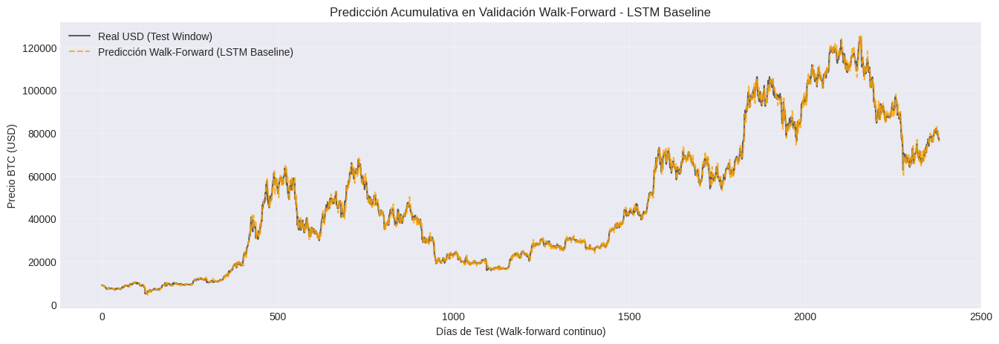


🧠 Evaluando GRU Baseline...
   => Test RMSE: $2,123 | MAE: $1,443 | MAPE: 3.35% | MDA: 49.2%


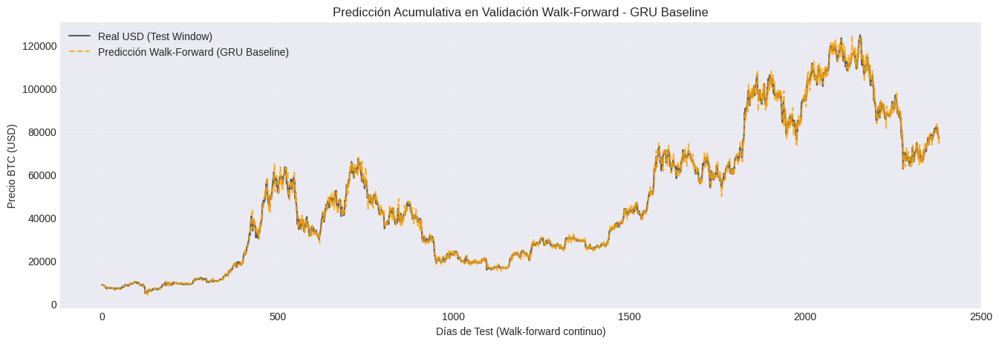


🧠 Evaluando Transformer Base...
   => Test RMSE: $1,776 | MAE: $1,160 | MAPE: 2.61% | MDA: 49.1%


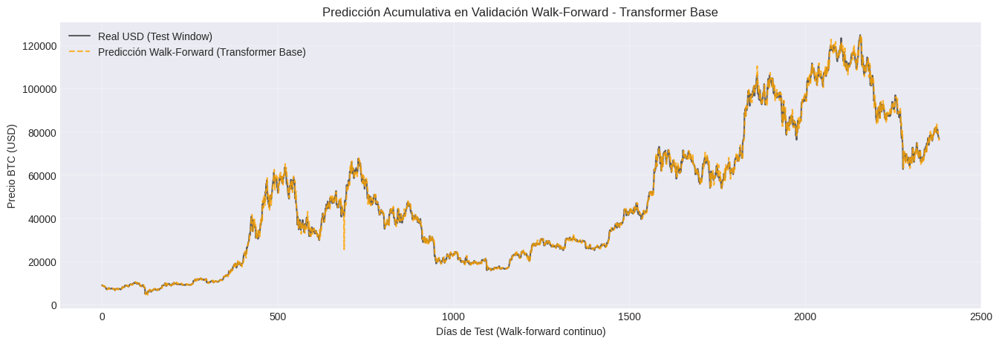


🧠 Evaluando Hybrid (Ours)...
   => Test RMSE: $1,739 | MAE: $1,155 | MAPE: 2.57% | MDA: 50.5%


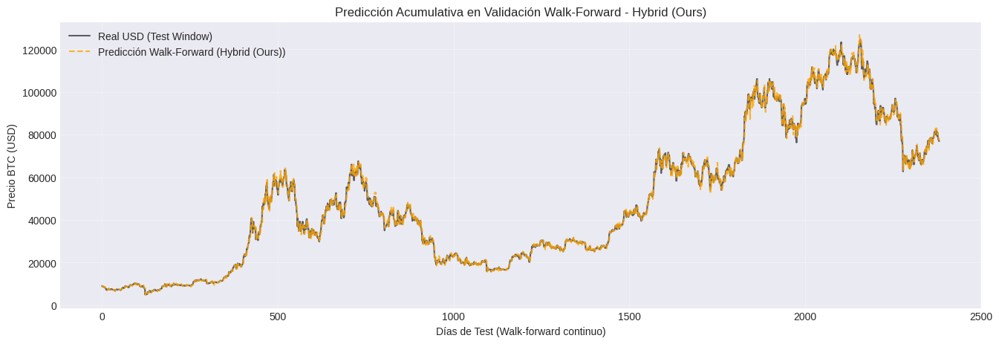


📊 RESULTADOS FINALES: SLIDING WALK-FORWARD (Multi-Step 7 Días)


,Modelo,Test RMSE,Test MAE,Test MAPE,Test MDA%
3,Hybrid (Ours),1738.573775,1154.923018,2.569983,50.461797
2,Transformer Base,1776.136058,1159.925945,2.605735,49.076406
0,LSTM Baseline,1911.704458,1299.194012,3.020216,52.854744
1,GRU Baseline,2123.244074,1443.216327,3.349655,49.160369


In [ ]:
#@title 8b. Benchmark

# =====================================================================
# 4. Ejecución del Benchmark Integrado
# =====================================================================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
seq_len = 100
pred_len = 1

# Asumo que el modelo Híbrido lo tenías definido. Lo añado aquí para compatibilidad.
# Asegúrate de que su out_features o última capa apunte a `pred_len`.
modelos_dict = {
    'LSTM Baseline':    lambda inp: Baseline_LSTM(inp, 32, pred_length=pred_len),
    'GRU Baseline':     lambda inp: Baseline_GRU(inp, 32, pred_length=pred_len),
    'Transformer Base': lambda inp: Baseline_Transformer(inp, 32, pred_length=pred_len),
    'Hybrid (Ours)':    lambda inp: Hybrid_LSTM_Transformer(inp, d_model=32, num_heads=4, hidden_dim_lstm=64, num_layers_lstm=2, pred_len=pred_len)
}

# Solo usaremos Diario como pidió la regla principal de 2 años / 100 dias entrada / 7 dias salida.
# Aplicar esto a 15 min requiere una lógica diferente de warm-up.
print("\n🚀 Iniciando Validación Walk-Forward (Log-Returns Multi-Step)...")
resultados_wf = []

df_diario = df_diario_ext[top_features + ['Target_BTC']].copy()

# Preparación sin leakage usando la función que corregimos antes
data_prep = preparacion_datos_base(df_diario, "Diario")

# Extraer parámetros dinámicos
input_features = data_prep['features_raw'].shape[1]
warmup_size = 730 # 2 años estrictos de warm up
historiales_detallados = {}
resultados_wf = []

for nombre_mod, mod_func in modelos_dict.items():
    print(f"\n{'='*50}\n🧠 Evaluando {nombre_mod}...")

    modelo_instancia = mod_func(input_features).to(device)

    # 1. ACTUALIZACIÓN: Ahora recibimos 4 variables (met_test, df_mod_history, reales, preds)
    met_test, df_mod_history, reales, preds = walk_forward_evaluation_with_logs(
        modelo_instancia,
        data_prep,
        seq_len=seq_len,
        pred_len=pred_len,
        warmup_size=warmup_size
    )

    # 2. Guardamos el DataFrame de historia detallada en nuestro diccionario
    historiales_detallados[nombre_mod] = df_mod_history

    print(f"   => Test RMSE: ${met_test['RMSE']:,.0f} | MAE: ${met_test['MAE']:,.0f} "
          f"| MAPE: {met_test['MAPE (%)']:.2f}% | MDA: {met_test['MDA (%)']:.1f}%")

    resultados_wf.append({
        'Modelo': nombre_mod,
        'Test RMSE': met_test['RMSE'],
        'Test MAE': met_test['MAE'],
        'Test MAPE': met_test['MAPE (%)'],
        'Test MDA%': met_test['MDA (%)']
    })

    # [El resto de tu código de gráficas se mantiene igual...]
    plt.figure(figsize=(16, 5))
    eje_x = np.arange(len(reales))
    plt.plot(eje_x, reales, label='Real USD (Test Window)', color='black', alpha=0.6)
    plt.plot(eje_x, preds, label=f'Predicción Walk-Forward ({nombre_mod})', color='orange', alpha=0.8, linestyle='--')
    plt.title(f'Predicción Acumulativa en Validación Walk-Forward - {nombre_mod}')
    plt.xlabel('Días de Test (Walk-forward continuo)')
    plt.ylabel('Precio BTC (USD)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

# Resumen Final
df_res_final = pd.DataFrame(resultados_wf).sort_values(by='Test MAE', ascending=True)
print("\n" + "="*60)
print("📊 RESULTADOS FINALES: SLIDING WALK-FORWARD (Multi-Step 7 Días)")
print("="*60)
display(df_res_final)


---
## 9. Visualización de Métricas Comparativas




📈 GENERANDO GRÁFICOS DE DIAGNÓSTICO DETALLADO


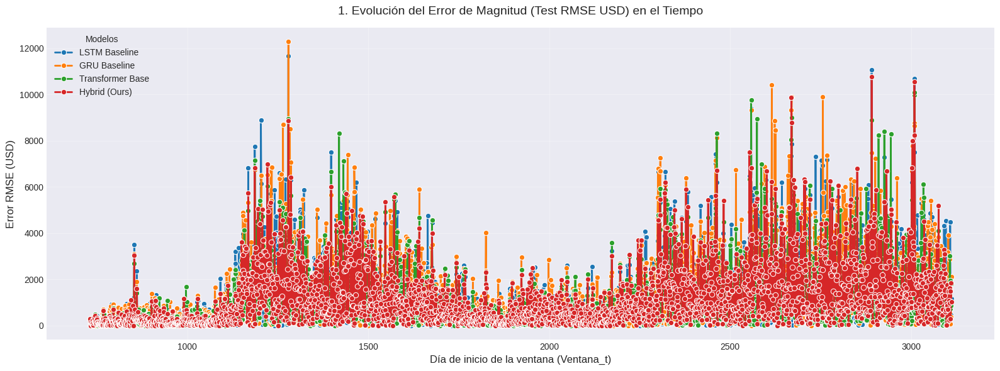

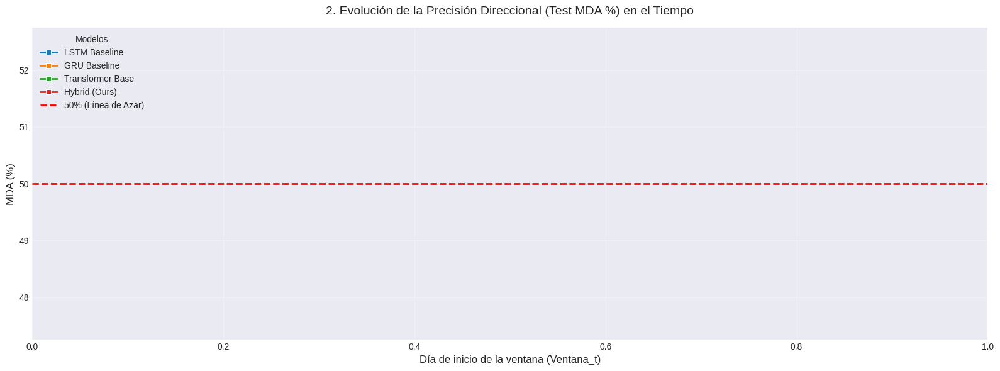

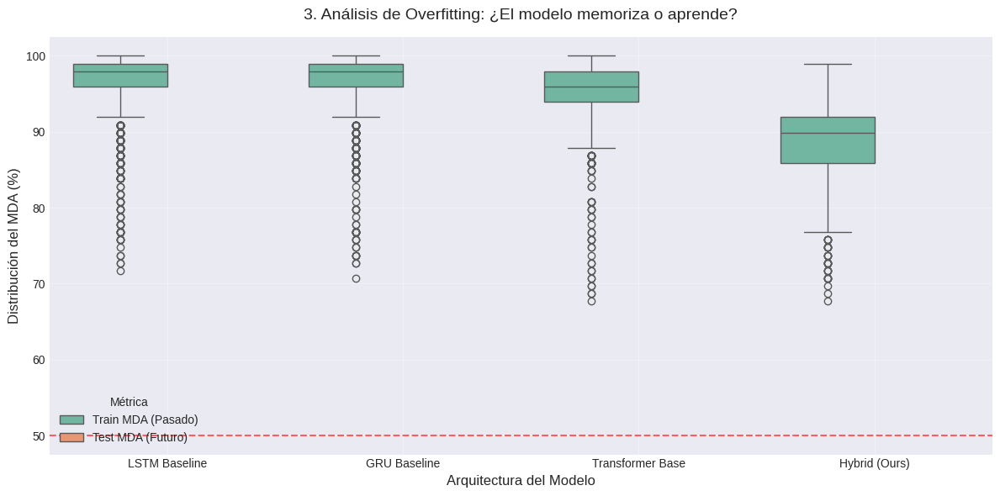

In [ ]:
import seaborn as sns
import pandas as pd

print("\n" + "="*60)
print("📈 GENERANDO GRÁFICOS DE DIAGNÓSTICO DETALLADO")
print("="*60)

# 1. Preparar los datos: Extraer solo la ÚLTIMA época de cada ventana para cada modelo
datos_finales_ventanas = []
for nombre_mod, df_hist in historiales_detallados.items():
    # Agrupamos por Ventana_t y tomamos la última fila (la última época de entrenamiento/fine-tuning)
    df_last_epoch = df_hist.groupby('Ventana_t').last().reset_index()
    df_last_epoch['Modelo'] = nombre_mod
    datos_finales_ventanas.append(df_last_epoch)

# Unimos todos los modelos en un solo DataFrame para graficar fácilmente
df_comparativo = pd.concat(datos_finales_ventanas, ignore_index=True)

# -------------------------------------------------------------------
# GRÁFICO 1: Estabilidad del Error en Dólares (Test RMSE USD)
# -------------------------------------------------------------------
plt.figure(figsize=(16, 6))
sns.lineplot(data=df_comparativo, x='Ventana_t', y='TE_RMSE_USD', hue='Modelo', marker='o', linewidth=2)
plt.title('1. Evolución del Error de Magnitud (Test RMSE USD) en el Tiempo', fontsize=14, pad=15)
plt.xlabel('Día de inicio de la ventana (Ventana_t)', fontsize=12)
plt.ylabel('Error RMSE (USD)', fontsize=12)
plt.legend(title='Modelos')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------
# GRÁFICO 2: Precisión de Dirección (Test MDA %)
# -------------------------------------------------------------------
plt.figure(figsize=(16, 6))
sns.lineplot(data=df_comparativo, x='Ventana_t', y='TE_MDA', hue='Modelo', marker='s', linewidth=2)
# Línea base del 50% (Azar)
plt.axhline(50, color='red', linestyle='--', linewidth=2, label='50% (Línea de Azar)')
plt.title('2. Evolución de la Precisión Direccional (Test MDA %) en el Tiempo', fontsize=14, pad=15)
plt.xlabel('Día de inicio de la ventana (Ventana_t)', fontsize=12)
plt.ylabel('MDA (%)', fontsize=12)
plt.legend(title='Modelos', loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------
# GRÁFICO 3: Análisis de Overfitting (Train vs Test MDA)
# -------------------------------------------------------------------
# Transformamos los datos para poder comparar Train y Test lado a lado
df_melted = df_comparativo.melt(
    id_vars=['Modelo'],
    value_vars=['TR_MDA', 'TE_MDA'],
    var_name='Tipo_Metrica',
    value_name='MDA_Value'
)

# Renombramos para que se vea mejor en el gráfico
df_melted['Tipo_Metrica'] = df_melted['Tipo_Metrica'].replace({'TR_MDA': 'Train MDA (Pasado)', 'TE_MDA': 'Test MDA (Futuro)'})

plt.figure(figsize=(12, 6))
sns.boxplot(data=df_melted, x='Modelo', y='MDA_Value', hue='Tipo_Metrica', palette='Set2')
plt.axhline(50, color='red', linestyle='--', alpha=0.6)
plt.title('3. Análisis de Overfitting: ¿El modelo memoriza o aprende?', fontsize=14, pad=15)
plt.xlabel('Arquitectura del Modelo', fontsize=12)
plt.ylabel('Distribución del MDA (%)', fontsize=12)
plt.legend(title='Métrica')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

---

# 10. Experimentos

A partir de este punto, implementaremos variaciones sistemáticas sobre nuestro motor de evaluación (Sliding Walk-Forward) para superar el estancamiento del modelo en el "Naive Forecast" (sesgo hacia predecir la media por el uso de MSELoss). Asimismo vamos a aplicar el modelo y los experimentos a Ethereum y Solana



## 10.1 Experimento 1: Re-introducción de la Arquitectura Híbrida GRU-Transformer


**Objetivo:** Evaluar si reemplazar la memoria pesada de una LSTM por las puertas de actualización más ágiles de una GRU dentro de la arquitectura híbrida (Hybrid_GRU_Transformer) permite capturar mejor la micro-tendencia direccional en un entorno multi-step (prediciendo ventanas completas de 7 pasos).
**Condiciones:**
- No se modificará la función de pérdida (se mantiene `MSELoss` como baseline de control).
- Se ejecutará sobre todas las temporalidades (Diario, Horario, 15 Minutos) con un periodo de *warm-up* estándar de 730 periodos.

🚀 INICIANDO EXPERIMENTO 1: Evaluación Multitemporal con Hybrid GRU...
✅ Modelo Hybrid_GRU_Transformer cargado (Bug Dimensional Corregido).

⌛ EVALUANDO TEMPORALIDAD: Diario

[Diario] Shape inicial: (3113, 13)
[Diario] Shape final tras limpieza: (3112, 13)
[Diario] Features seleccionadas: 10
   🧠 Entrenando y Validando LSTM Baseline...
   🧠 Entrenando y Validando GRU Baseline...
   🧠 Entrenando y Validando Transformer Base...
   🧠 Entrenando y Validando Hybrid LSTM...
   🧠 Entrenando y Validando Hybrid GRU...

⌛ EVALUANDO TEMPORALIDAD: Horario

[Horario] Shape inicial: (15316, 13)
[Horario] Shape final tras limpieza: (5851, 13)
[Horario] Features seleccionadas: 10
   🧠 Entrenando y Validando LSTM Baseline...
   🧠 Entrenando y Validando GRU Baseline...
   🧠 Entrenando y Validando Transformer Base...
   🧠 Entrenando y Validando Hybrid LSTM...
   🧠 Entrenando y Validando Hybrid GRU...

⌛ EVALUANDO TEMPORALIDAD: 15_Min

[15_Min] Shape inicial: (5402, 13)
[15_Min] Shape final tras limpieza: 

,Temporalidad,Modelo,Test RMSE,Test MAE,Test MAPE,Test MDA%
0,Diario,LSTM Baseline,3990.369131,2670.498553,6.034152,50.651534
1,Diario,GRU Baseline,4230.782612,2765.856614,6.266129,50.819672
2,Diario,Transformer Base,3498.255855,2322.218298,5.386326,49.138293
3,Diario,Hybrid LSTM,3842.282820,2429.450031,5.287293,51.366120
4,Diario,Hybrid GRU,3369.847541,2249.210401,5.077049,49.852879
5,Horario,LSTM Baseline,1751.830836,1229.445791,1.399703,51.505082
6,Horario,GRU Baseline,1837.516356,1302.232498,1.482258,51.016419
7,Horario,Transformer Base,1668.777906,1148.591485,1.306593,51.563722
8,Horario,Hybrid LSTM,1700.290045,1161.688287,1.318690,51.133698
9,Horario,Hybrid GRU,1625.228868,1127.150840,1.278033,50.664582



Generando gráficas de diagnóstico...


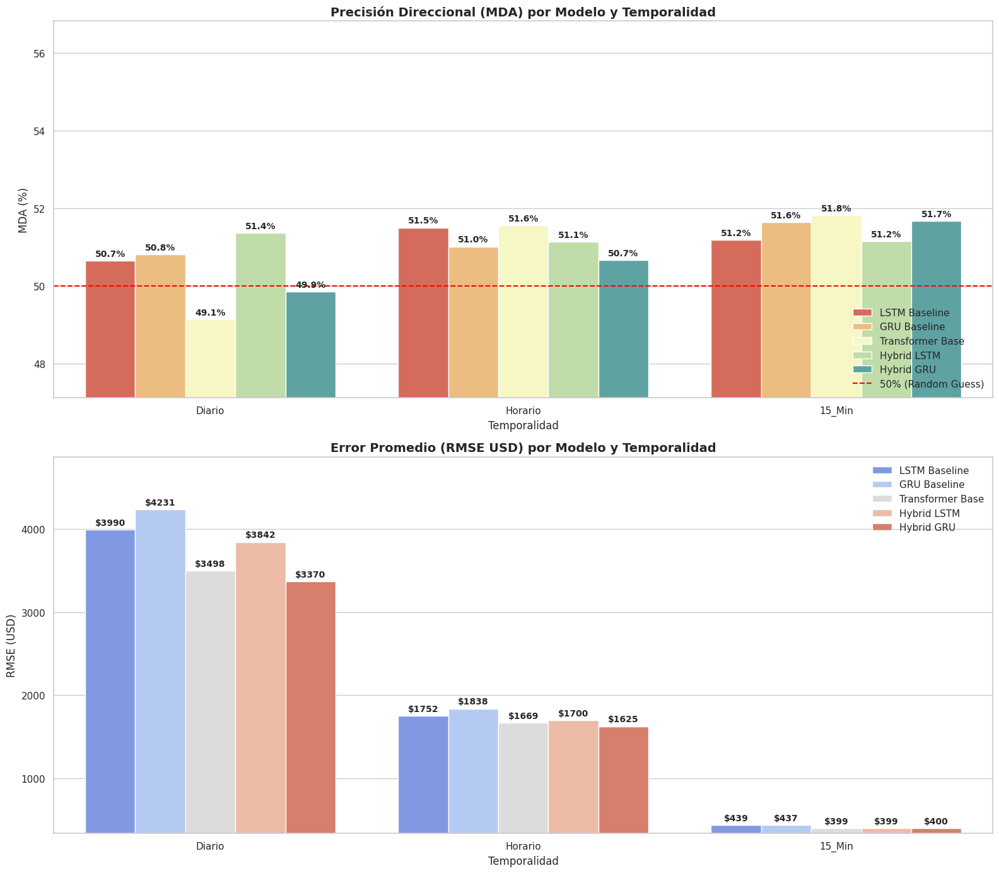

In [ ]:
#@title Experimento 1: Benchmark Walk-Forward Multitemporal (Incluyendo Hybrid GRU)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from IPython.display import display

print("🚀 INICIANDO EXPERIMENTO 1: Evaluación Multitemporal con Hybrid GRU...")

# =====================================================================
# 1. Definir Híbrido GRU adaptado al nuevo output y con dimensiones corregidas
# =====================================================================
class Hybrid_GRU_Transformer(nn.Module):
    def __init__(self, input_dim, d_model, num_heads, hidden_dim_gru, num_layers_gru, dropout=0.2, pred_len=7):
        super().__init__()
        self.input_projection = nn.Linear(input_dim, d_model)
        self.pos_encoder      = PositionalEncoding(d_model)
        self.input_dropout    = nn.Dropout(dropout)

        self.self_attention = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_t = nn.LayerNorm(d_model)

        # ¡CORRECCIÓN AQUÍ! hidden_size = d_model // 2 para que bidireccional cuadre a d_model
        self.gru = nn.GRU(
            input_size=d_model,
            hidden_size=d_model // 2,
            num_layers=num_layers_gru,
            batch_first=True,
            bidirectional=True,
            dropout=dropout if num_layers_gru > 1 else 0.0
        )
        self.norm_g = nn.LayerNorm(d_model)

        self.cross_attn_T2G = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_T2G = nn.LayerNorm(d_model)

        self.cross_attn_G2T = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_G2T = nn.LayerNorm(d_model)

        self.fusion = nn.Linear(d_model * 2, d_model)
        self.norm_f = nn.LayerNorm(d_model)
        self.drop_f = nn.Dropout(dropout)

        self.output = nn.Linear(d_model, pred_len)

    def forward(self, src):
        x    = self.input_projection(src)
        x_pe = self.input_dropout(self.pos_encoder(x))

        t_out, _ = self.self_attention(x_pe, x_pe, x_pe)
        t_feat   = self.norm_t(x_pe + t_out)

        g_out, _ = self.gru(x_pe)
        g_feat   = self.norm_g(x_pe + g_out)

        t2g, _ = self.cross_attn_T2G(query=g_feat, key=t_feat, value=t_feat)
        t2g    = self.norm_T2G(g_feat + t2g)

        g2t, _ = self.cross_attn_G2T(query=t_feat, key=g_feat, value=g_feat)
        g2t    = self.norm_G2T(t_feat + g2t)

        fused = torch.relu(self.fusion(torch.cat([t2g, g2t], dim=-1)))
        fused = self.norm_f(fused)

        return self.output(self.drop_f(fused[:, -1, :]))

print("✅ Modelo Hybrid_GRU_Transformer cargado (Bug Dimensional Corregido).")

# =====================================================================
# 2. Configuración General del Experimento
# =====================================================================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
seq_len = 100
pred_len = 7
warmup_size = 730 # 730 días para Diario, 730 horas para Horario, 730 15_mins (~7.6 días)

modelos_dict = {
    'LSTM Baseline':    lambda inp: Baseline_LSTM(inp, 32, pred_length=pred_len),
    'GRU Baseline':     lambda inp: Baseline_GRU(inp, 32, pred_length=pred_len),
    'Transformer Base': lambda inp: Baseline_Transformer(inp, 32, pred_length=pred_len),
    'Hybrid LSTM':      lambda inp: Hybrid_LSTM_Transformer(inp, d_model=32, num_heads=4, hidden_dim_lstm=64, num_layers_lstm=2, pred_len=pred_len),
    'Hybrid GRU':       lambda inp: Hybrid_GRU_Transformer(inp, d_model=32, num_heads=4, hidden_dim_gru=64, num_layers_gru=2, pred_len=pred_len)
}

datasets = {
    'Diario':  df_diario_ext,
    'Horario': df_horario_ext,
    '15_Min':  df_15m_ext
}

resultados_exp1 = []

# =====================================================================
# 3. Bucle de Evaluación Walk-Forward Multitemporal
# =====================================================================
for nombre_ds, df_raw in datasets.items():
    print(f"\n{'='*60}\n⌛ EVALUANDO TEMPORALIDAD: {nombre_ds}\n{'='*60}")

    # Filtramos por las top features de XGBoost + Target
    df_filtrado = df_raw[top_features + ['Target_BTC']].copy()

    # Preparación de datos
    data_prep = preparacion_datos_base(df_filtrado, nombre_ds)
    input_features = data_prep['features_raw'].shape[1]

    for nombre_mod, mod_func in modelos_dict.items():
        print(f"   🧠 Entrenando y Validando {nombre_mod}...")

        modelo_instancia = mod_func(input_features).to(device)

        # Ejecutamos la función de tu compañero (walk_forward_evaluation_with_logs)
        met_test, _, _, _ = walk_forward_evaluation_with_logs(
            modelo_instancia,
            data_prep,
            seq_len=seq_len,
            pred_len=pred_len,
            warmup_size=warmup_size
        )

        resultados_exp1.append({
            'Temporalidad': nombre_ds,
            'Modelo': nombre_mod,
            'Test RMSE': met_test['RMSE'],
            'Test MAE': met_test['MAE'],
            'Test MAPE': met_test['MAPE (%)'],
            'Test MDA%': met_test['MDA (%)']
        })

df_res_exp1 = pd.DataFrame(resultados_exp1)

print("\n" + "="*60)
print("📊 RESULTADOS FINALES: EXPERIMENTO 1 (Walk-Forward)")
print("="*60)
display(df_res_exp1)

# =====================================================================
# 4. Gráficas de Resultados (Barplots)
# =====================================================================
print("\nGenerando gráficas de diagnóstico...")
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(2, 1, figsize=(16, 14))

# --- GRÁFICA 1: PRECISIÓN DIRECCIONAL (MDA) ---
sns.barplot(data=df_res_exp1, x='Temporalidad', y='Test MDA%', hue='Modelo', ax=axes[0], palette="Spectral")
axes[0].set_title(f'Precisión Direccional (MDA) por Modelo y Temporalidad', fontsize=14, fontweight='bold')
axes[0].set_ylabel('MDA (%)')
axes[0].axhline(50, color='red', linestyle='--', label='50% (Random Guess)')

min_mda = df_res_exp1['Test MDA%'].min()
axes[0].set_ylim(max(40, min_mda - 2), df_res_exp1['Test MDA%'].max() + 5)
for container in axes[0].containers:
    axes[0].bar_label(container, fmt='%.1f%%', padding=3, fontsize=10, fontweight='bold')
axes[0].legend(loc='lower right')

# --- GRÁFICA 2: ERROR DE MAGNITUD (RMSE) ---
sns.barplot(data=df_res_exp1, x='Temporalidad', y='Test RMSE', hue='Modelo', ax=axes[1], palette="coolwarm")
axes[1].set_title(f'Error Promedio (RMSE USD) por Modelo y Temporalidad', fontsize=14, fontweight='bold')
axes[1].set_ylabel('RMSE (USD)')

min_rmse = df_res_exp1['Test RMSE'].min()
axes[1].set_ylim(min_rmse * 0.85, df_res_exp1['Test RMSE'].max() * 1.15)
for container in axes[1].containers:
    axes[1].bar_label(container, fmt='$%.0f', padding=3, fontsize=10, fontweight='bold')
axes[1].legend(loc='upper right')

plt.tight_layout()
plt.show()

## 10.2 Experimento 2: Integración de la Volatility Directional Loss


**Objetivo:** Romper el estancamiento del "Pronóstico Ingenuo" (Naive Forecast) reemplazando la función de pérdida tradicional (MSE) por una función personalizada (`VolatilityDirectionalLoss`).
**Hipótesis:** Al penalizar explícitamente a la red cuando se equivoca en el signo de la predicción (dirección del mercado), esperamos forzar al modelo a tomar decisiones direccionales más arriesgadas. Esto debería elevar el Test MDA (Mean Directional Accuracy) por encima del umbral del azar (50%), asumiendo un posible (y aceptable) ligero incremento en el RMSE como *trade-off*.
**Condiciones:**
- Evaluaremos los 5 modelos en las 3 temporalidades (Diario, Horario, 15_Min).
- Se utiliza el motor de Sliding Walk-Forward estricto (pred_len = 7).

🚀 INICIANDO EXPERIMENTO 2: Inyectando Volatility Directional Loss...
✅ VolatilityDirectionalLoss definida exitosamente.

⌛ EVALUANDO TEMPORALIDAD: Diario (Con Pérdida Direccional)

[Diario] Shape inicial: (3113, 13)
[Diario] Shape final tras limpieza: (3112, 13)
[Diario] Features seleccionadas: 10
   🧠 Entrenando y Validando LSTM Baseline...
   🧠 Entrenando y Validando GRU Baseline...
   🧠 Entrenando y Validando Transformer Base...
   🧠 Entrenando y Validando Hybrid LSTM...
   🧠 Entrenando y Validando Hybrid GRU...

⌛ EVALUANDO TEMPORALIDAD: Horario (Con Pérdida Direccional)

[Horario] Shape inicial: (15316, 13)
[Horario] Shape final tras limpieza: (5851, 13)
[Horario] Features seleccionadas: 10
   🧠 Entrenando y Validando LSTM Baseline...
   🧠 Entrenando y Validando GRU Baseline...
   🧠 Entrenando y Validando Transformer Base...
   🧠 Entrenando y Validando Hybrid LSTM...
   🧠 Entrenando y Validando Hybrid GRU...

⌛ EVALUANDO TEMPORALIDAD: 15_Min (Con Pérdida Direccional)

[15_Min] Sha

,Temporalidad,Modelo,Test RMSE,Test MAE,Test MAPE,Test MDA%
0,Diario,LSTM Baseline,2928.434905,1883.051152,4.272181,51.450189
1,Diario,GRU Baseline,3910.219680,2481.932782,5.108161,50.189155
2,Diario,Transformer Base,2936.843167,1889.328895,4.296512,51.702396
3,Diario,Hybrid LSTM,2928.195795,1882.954242,4.272271,51.534258
4,Diario,Hybrid GRU,2928.378687,1882.927682,4.272060,51.450189
5,Horario,LSTM Baseline,1682.442854,1170.658108,1.322707,51.075059
6,Horario,GRU Baseline,1689.941046,1177.806347,1.331346,51.544175
7,Horario,Transformer Base,1536.048976,1041.247348,1.183821,51.075059
8,Horario,Hybrid LSTM,1534.922436,1040.461169,1.182533,51.094605
9,Horario,Hybrid GRU,1534.867219,1040.271020,1.182395,51.035966



Generando gráficas de diagnóstico...


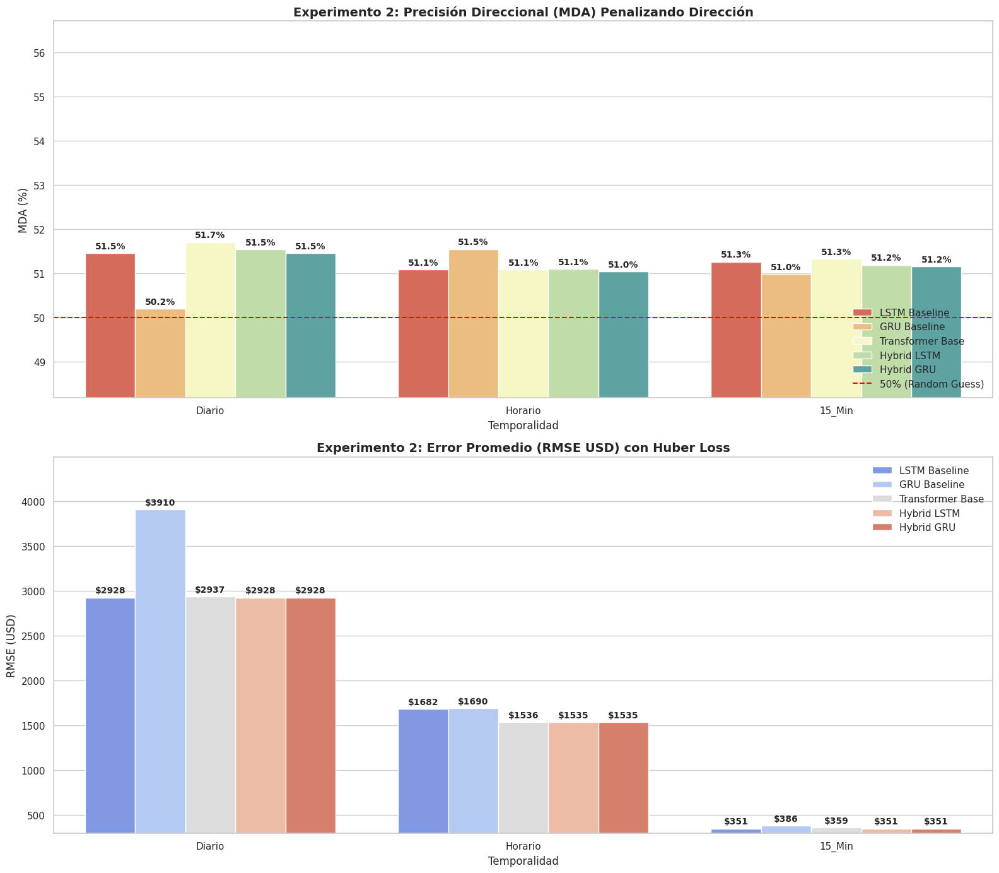

In [ ]:
#@title Experimento 2: Benchmark Walk-Forward con Volatility Directional Loss
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from IPython.display import display
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

print("🚀 INICIANDO EXPERIMENTO 2: Inyectando Volatility Directional Loss...")

# =====================================================================
# 1. Definir la Función de Pérdida Customizada
# =====================================================================
class VolatilityDirectionalLoss(nn.Module):
    def __init__(self, delta=1.0, dir_weight=1.0):
        super().__init__()
        self.huber = nn.HuberLoss(delta=delta)
        # dir_weight controla qué tanto nos importa la dirección vs la magnitud
        self.dir_weight = dir_weight

    def forward(self, y_pred, y_true):
        y_pred = y_pred.squeeze()
        y_true = y_true.squeeze()

        # 1. Magnitud (Huber es más suave que MSE con los outliers)
        loss_mag = self.huber(y_pred, y_true)

        # 2. Penalización Direccional
        signo_real = torch.sign(y_true)
        penalizacion = - (y_pred * signo_real)
        loss_dir = torch.mean(torch.relu(penalizacion))

        return loss_mag + (self.dir_weight * loss_dir)

print("✅ VolatilityDirectionalLoss definida exitosamente.")

# =====================================================================
# 2. Sobrescribir el Motor Walk-Forward para usar la nueva Loss
# =====================================================================
def walk_forward_evaluation_dir_loss(modelo, data_dict, seq_len=100, pred_len=7, warmup_size=730):
    features_raw = data_dict['features_raw']
    target_raw   = data_dict['target_raw']
    precios      = data_dict['precios_absolutos']
    cols         = data_dict['feature_cols']
    N = len(features_raw)

    optimizer = torch.optim.Adam(modelo.parameters(), lr=0.001, weight_decay=1e-4)

    # ¡AQUÍ ESTÁ LA MAGIA DEL EXPERIMENTO 2!
    criterion = VolatilityDirectionalLoss(delta=1.0, dir_weight=1.5)

    all_reals_usd, all_preds_usd = [], []
    is_warmup = True

    idx_std = [i for i, c in enumerate(cols) if c in cols_log_return + cols_volume + cols_diff_std]
    idx_rob = [i for i, c in enumerate(cols) if c in cols_pct_robust + cols_diff_robust]
    idx_mm  = [i for i, c in enumerate(cols) if i not in idx_std + idx_rob]

    for t in range(warmup_size, N - pred_len + 1, pred_len):
        train_F = features_raw[t - warmup_size : t]
        train_T = target_raw[t - warmup_size : t]
        sc_std, sc_rob, sc_mm = StandardScaler(), RobustScaler(), MinMaxScaler(feature_range=(-1, 1))
        scaler_t = StandardScaler()

        train_F_sc = np.zeros_like(train_F)
        if idx_std: train_F_sc[:, idx_std] = sc_std.fit_transform(train_F[:, idx_std])
        if idx_rob: train_F_sc[:, idx_rob] = sc_rob.fit_transform(train_F[:, idx_rob])
        if idx_mm:  train_F_sc[:, idx_mm]  = sc_mm.fit_transform(train_F[:, idx_mm])
        train_T_sc = scaler_t.fit_transform(train_T.reshape(-1, 1)).flatten()

        X_tr, y_tr = create_sequences(train_F_sc, train_T_sc, seq_length=seq_len, pred_length=pred_len)
        loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)

        test_F_raw = features_raw[t - seq_len : t]
        test_F_sc  = np.zeros_like(test_F_raw)
        if idx_std: test_F_sc[:, idx_std] = sc_std.transform(test_F_raw[:, idx_std])
        if idx_rob: test_F_sc[:, idx_rob] = sc_rob.transform(test_F_raw[:, idx_rob])
        if idx_mm:  test_F_sc[:, idx_mm]  = sc_mm.transform(test_F_raw[:, idx_mm])

        x_infer = torch.tensor(test_F_sc, dtype=torch.float32).unsqueeze(0).to(device)
        real_prices_test = precios[t : t + pred_len]
        P_t = precios[t - 1]

        epochs = 15 if is_warmup else 2

        for ep in range(epochs):
            modelo.train()
            for xb, yb in loader:
                optimizer.zero_grad()
                preds = modelo(xb.to(device))
                loss = criterion(preds, yb.to(device))
                loss.backward()
                torch.nn.utils.clip_grad_norm_(modelo.parameters(), 1.0)
                optimizer.step()

        modelo.eval()
        with torch.no_grad():
            p_te_sc = modelo(x_infer).cpu().numpy()[0]
            p_te_log_ret = scaler_t.inverse_transform(p_te_sc.reshape(-1, 1)).flatten()
            pred_prices_test = P_t * np.exp(np.cumsum(p_te_log_ret))

        all_preds_usd.extend(pred_prices_test)
        all_reals_usd.extend(real_prices_test)
        is_warmup = False

    met_final = calc_metrics(all_reals_usd, all_preds_usd)
    return met_final

# =====================================================================
# 3. Configuración y Bucle Principal
# =====================================================================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
seq_len = 100
pred_len = 7
warmup_size = 730

modelos_dict = {
    'LSTM Baseline':    lambda inp: Baseline_LSTM(inp, 32, pred_length=pred_len),
    'GRU Baseline':     lambda inp: Baseline_GRU(inp, 32, pred_length=pred_len),
    'Transformer Base': lambda inp: Baseline_Transformer(inp, 32, pred_length=pred_len),
    'Hybrid LSTM':      lambda inp: Hybrid_LSTM_Transformer(inp, d_model=32, num_heads=4, hidden_dim_lstm=64, num_layers_lstm=2, pred_len=pred_len),
    'Hybrid GRU':       lambda inp: Hybrid_GRU_Transformer(inp, d_model=32, num_heads=4, hidden_dim_gru=64, num_layers_gru=2, pred_len=pred_len)
}

datasets = {
    'Diario':  df_diario_ext,
    'Horario': df_horario_ext,
    '15_Min':  df_15m_ext
}

resultados_exp2 = []

for nombre_ds, df_raw in datasets.items():
    print(f"\n{'='*60}\n⌛ EVALUANDO TEMPORALIDAD: {nombre_ds} (Con Pérdida Direccional)\n{'='*60}")

    df_filtrado = df_raw[top_features + ['Target_BTC']].copy()
    data_prep = preparacion_datos_base(df_filtrado, nombre_ds)
    input_features = data_prep['features_raw'].shape[1]

    for nombre_mod, mod_func in modelos_dict.items():
        print(f"   🧠 Entrenando y Validando {nombre_mod}...")

        modelo_instancia = mod_func(input_features).to(device)

        # Llamamos al motor modificado!
        met_test = walk_forward_evaluation_dir_loss(
            modelo_instancia,
            data_prep,
            seq_len=seq_len,
            pred_len=pred_len,
            warmup_size=warmup_size
        )

        resultados_exp2.append({
            'Temporalidad': nombre_ds,
            'Modelo': nombre_mod,
            'Test RMSE': met_test['RMSE'],
            'Test MAE': met_test['MAE'],
            'Test MAPE': met_test['MAPE (%)'],
            'Test MDA%': met_test['MDA (%)']
        })

df_res_exp2 = pd.DataFrame(resultados_exp2)

print("\n" + "="*60)
print("📊 RESULTADOS FINALES: EXPERIMENTO 2 (Directional Loss)")
print("="*60)
display(df_res_exp2)

# =====================================================================
# 4. Gráficas de Resultados (Barplots)
# =====================================================================
print("\nGenerando gráficas de diagnóstico...")
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(2, 1, figsize=(16, 14))

# --- GRÁFICA 1: PRECISIÓN DIRECCIONAL (MDA) ---
sns.barplot(data=df_res_exp2, x='Temporalidad', y='Test MDA%', hue='Modelo', ax=axes[0], palette="Spectral")
axes[0].set_title(f'Experimento 2: Precisión Direccional (MDA) Penalizando Dirección', fontsize=14, fontweight='bold')
axes[0].set_ylabel('MDA (%)')
axes[0].axhline(50, color='red', linestyle='--', label='50% (Random Guess)')

min_mda = df_res_exp2['Test MDA%'].min()
axes[0].set_ylim(max(40, min_mda - 2), df_res_exp2['Test MDA%'].max() + 5)
for container in axes[0].containers:
    axes[0].bar_label(container, fmt='%.1f%%', padding=3, fontsize=10, fontweight='bold')
axes[0].legend(loc='lower right')

# --- GRÁFICA 2: ERROR DE MAGNITUD (RMSE) ---
sns.barplot(data=df_res_exp2, x='Temporalidad', y='Test RMSE', hue='Modelo', ax=axes[1], palette="coolwarm")
axes[1].set_title(f'Experimento 2: Error Promedio (RMSE USD) con Huber Loss', fontsize=14, fontweight='bold')
axes[1].set_ylabel('RMSE (USD)')

min_rmse = df_res_exp2['Test RMSE'].min()
axes[1].set_ylim(min_rmse * 0.85, df_res_exp2['Test RMSE'].max() * 1.15)
for container in axes[1].containers:
    axes[1].bar_label(container, fmt='$%.0f', padding=3, fontsize=10, fontweight='bold')
axes[1].legend(loc='upper right')

plt.tight_layout()
plt.show()

## 10.3 Experimentos 3: Longitud de Secuencia

In [ ]:
#@title Motor Maestra de Experimentos (Walk-Forward + Gráficas)

import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display

# 1. Asegurar la Loss Personalizada
class VolatilityDirectionalLoss(nn.Module):
    def __init__(self, delta=1.0, dir_weight=1.5):
        super().__init__()
        self.huber = nn.HuberLoss(delta=delta)
        self.dir_weight = dir_weight

    def forward(self, y_pred, y_true):
        y_pred = y_pred.squeeze()
        y_true = y_true.squeeze()
        loss_mag = self.huber(y_pred, y_true)
        signo_real = torch.sign(y_true)
        penalizacion = - (y_pred * signo_real)
        loss_dir = torch.mean(torch.relu(penalizacion))
        return loss_mag + (self.dir_weight * loss_dir)

# =====================================================================
# 1. Definir Híbrido GRU adaptado al nuevo output y con dimensiones corregidas
# =====================================================================
class Hybrid_GRU_Transformer(nn.Module):
    def __init__(self, input_dim, d_model, num_heads, hidden_dim_gru, num_layers_gru, dropout=0.2, pred_len=7):
        super().__init__()
        self.input_projection = nn.Linear(input_dim, d_model)
        self.pos_encoder      = PositionalEncoding(d_model)
        self.input_dropout    = nn.Dropout(dropout)

        self.self_attention = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_t = nn.LayerNorm(d_model)

        # ¡CORRECCIÓN AQUÍ! hidden_size = d_model // 2 para que bidireccional cuadre a d_model
        self.gru = nn.GRU(
            input_size=d_model,
            hidden_size=d_model // 2,
            num_layers=num_layers_gru,
            batch_first=True,
            bidirectional=True,
            dropout=dropout if num_layers_gru > 1 else 0.0
        )
        self.norm_g = nn.LayerNorm(d_model)

        self.cross_attn_T2G = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_T2G = nn.LayerNorm(d_model)

        self.cross_attn_G2T = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_G2T = nn.LayerNorm(d_model)

        self.fusion = nn.Linear(d_model * 2, d_model)
        self.norm_f = nn.LayerNorm(d_model)
        self.drop_f = nn.Dropout(dropout)

        self.output = nn.Linear(d_model, pred_len)

    def forward(self, src):
        x    = self.input_projection(src)
        x_pe = self.input_dropout(self.pos_encoder(x))

        t_out, _ = self.self_attention(x_pe, x_pe, x_pe)
        t_feat   = self.norm_t(x_pe + t_out)

        g_out, _ = self.gru(x_pe)
        g_feat   = self.norm_g(x_pe + g_out)

        t2g, _ = self.cross_attn_T2G(query=g_feat, key=t_feat, value=t_feat)
        t2g    = self.norm_T2G(g_feat + t2g)

        g2t, _ = self.cross_attn_G2T(query=t_feat, key=g_feat, value=g_feat)
        g2t    = self.norm_G2T(t_feat + g2t)

        fused = torch.relu(self.fusion(torch.cat([t2g, g2t], dim=-1)))
        fused = self.norm_f(fused)

        return self.output(self.drop_f(fused[:, -1, :]))

print("✅ Modelo Hybrid_GRU_Transformer cargado (Bug Dimensional Corregido).")

# 2. El Evaluador Walk-Forward (Retorna Métricas y Trayectorias)
def wf_eval_experimento(modelo, data_dict, seq_len, pred_len, warmup_size=730):
    features_raw, target_raw, precios, cols = data_dict['features_raw'], data_dict['target_raw'], data_dict['precios_absolutos'], data_dict['feature_cols']
    N = len(features_raw)

    optimizer = torch.optim.Adam(modelo.parameters(), lr=0.001, weight_decay=1e-4)
    criterion = VolatilityDirectionalLoss(delta=1.0, dir_weight=1.5)

    all_reals_usd, all_preds_usd = [], []
    is_warmup = True

    idx_std = [i for i, c in enumerate(cols) if c in cols_log_return + cols_volume + cols_diff_std]
    idx_rob = [i for i, c in enumerate(cols) if c in cols_pct_robust + cols_diff_robust]
    idx_mm  = [i for i, c in enumerate(cols) if i not in idx_std + idx_rob]

    for t in range(warmup_size, N - pred_len + 1, pred_len):
        train_F = features_raw[t - warmup_size : t]
        train_T = target_raw[t - warmup_size : t]

        sc_std, sc_rob, sc_mm, scaler_t = StandardScaler(), RobustScaler(), MinMaxScaler((-1, 1)), StandardScaler()
        train_F_sc = np.zeros_like(train_F)
        if idx_std: train_F_sc[:, idx_std] = sc_std.fit_transform(train_F[:, idx_std])
        if idx_rob: train_F_sc[:, idx_rob] = sc_rob.fit_transform(train_F[:, idx_rob])
        if idx_mm:  train_F_sc[:, idx_mm]  = sc_mm.fit_transform(train_F[:, idx_mm])
        train_T_sc = scaler_t.fit_transform(train_T.reshape(-1, 1)).flatten()

        X_tr, y_tr = create_sequences(train_F_sc, train_T_sc, seq_length=seq_len, pred_length=pred_len)
        loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)

        test_F_raw = features_raw[t - seq_len : t]
        test_F_sc  = np.zeros_like(test_F_raw)
        if idx_std: test_F_sc[:, idx_std] = sc_std.transform(test_F_raw[:, idx_std])
        if idx_rob: test_F_sc[:, idx_rob] = sc_rob.transform(test_F_raw[:, idx_rob])
        if idx_mm:  test_F_sc[:, idx_mm]  = sc_mm.transform(test_F_raw[:, idx_mm])

        x_infer = torch.tensor(test_F_sc, dtype=torch.float32).unsqueeze(0).to(device)
        real_prices_test = precios[t : t + pred_len]
        P_t = precios[t - 1]

        epochs = 15 if is_warmup else 2
        for ep in range(epochs):
            modelo.train()
            for xb, yb in loader:
                optimizer.zero_grad()
                loss = criterion(modelo(xb.to(device)), yb.to(device))
                loss.backward()
                torch.nn.utils.clip_grad_norm_(modelo.parameters(), 1.0)
                optimizer.step()

        modelo.eval()
        with torch.no_grad():
            p_te_sc = modelo(x_infer).cpu().numpy()[0]
            p_te_log_ret = scaler_t.inverse_transform(p_te_sc.reshape(-1, 1)).flatten()
            pred_prices_test = P_t * np.exp(np.cumsum(p_te_log_ret))

        all_preds_usd.extend(pred_prices_test)
        all_reals_usd.extend(real_prices_test)
        is_warmup = False

    return calc_metrics(all_reals_usd, all_preds_usd), all_reals_usd, all_preds_usd

# 3. Función Principal Ejecutora
def correr_experimento(nombre_exp, seq_len, pred_len):
    print(f"\n{'='*70}\n🚀 INICIANDO {nombre_exp.upper()}\n[Config: Mira {seq_len} T hacia atrás -> Predice {pred_len} T hacia adelante]\n{'='*70}")

    modelos_dict = {
        'LSTM Baseline':    lambda inp: Baseline_LSTM(inp, 32, pred_length=pred_len),
        'GRU Baseline':     lambda inp: Baseline_GRU(inp, 32, pred_length=pred_len),
        'Transformer Base': lambda inp: Baseline_Transformer(inp, 32, pred_length=pred_len),
        'Hybrid LSTM':      lambda inp: Hybrid_LSTM_Transformer(inp, d_model=32, num_heads=4, hidden_dim_lstm=64, num_layers_lstm=2, pred_len=pred_len),
        'Hybrid GRU':       lambda inp: Hybrid_GRU_Transformer(inp, d_model=32, num_heads=4, hidden_dim_gru=64, num_layers_gru=2, pred_len=pred_len)
    }

    datasets_raw = {'Diario': df_diario_ext, 'Horario': df_horario_ext, '15_Min': df_15m_ext}
    resultados, trayectorias = [], {}

    for nombre_ds, df_raw in datasets_raw.items():
        print(f"\n⌛ Procesando Temporalidad: {nombre_ds}...")
        df_filtrado = df_raw[top_features + ['Target_BTC']].copy()
        data_prep = preparacion_datos_base(df_filtrado, nombre_ds)
        input_features = data_prep['features_raw'].shape[1]

        trayectorias[nombre_ds] = {}
        for nombre_mod, mod_func in modelos_dict.items():
            print(f"   🧠 {nombre_mod}...")
            modelo_instancia = mod_func(input_features).to(device)
            met_test, reales, preds = wf_eval_experimento(modelo_instancia, data_prep, seq_len, pred_len, warmup_size=730)

            resultados.append({
                'Temporalidad': nombre_ds, 'Modelo': nombre_mod,
                'Test RMSE': met_test['RMSE'], 'Test MAE': met_test['MAE'],
                'Test MDA%': met_test['MDA (%)']
            })
            trayectorias[nombre_ds][nombre_mod] = (reales, preds)

    df_res = pd.DataFrame(resultados)

    # --- GRÁFICAS: BARPLOTS ---
    sns.set_theme(style="whitegrid")
    fig1, axes1 = plt.subplots(2, 1, figsize=(16, 10))

    sns.barplot(data=df_res, x='Temporalidad', y='Test MDA%', hue='Modelo', ax=axes1[0], palette="Spectral")
    axes1[0].set_title(f'[{nombre_exp}] Precisión Direccional (MDA %)', fontweight='bold')
    axes1[0].axhline(50, color='red', linestyle='--')
    axes1[0].set_ylim(max(40, df_res['Test MDA%'].min() - 2), df_res['Test MDA%'].max() + 5)
    for c in axes1[0].containers: axes1[0].bar_label(c, fmt='%.1f%%', padding=3, fontsize=9)

    sns.barplot(data=df_res, x='Temporalidad', y='Test RMSE', hue='Modelo', ax=axes1[1], palette="coolwarm")
    axes1[1].set_title(f'[{nombre_exp}] Error de Magnitud (RMSE USD)', fontweight='bold')
    axes1[1].set_ylim(df_res['Test RMSE'].min() * 0.85, df_res['Test RMSE'].max() * 1.15)
    for c in axes1[1].containers: axes1[1].bar_label(c, fmt='$%.0f', padding=3, fontsize=9)
    plt.tight_layout(); plt.show()

    # --- GRÁFICAS: PREDICCIONES ACUMULATIVAS (GRID 3x5) ---
    print(f"\n📈 Generando Trayectorias Acumulativas para {nombre_exp}...")
    fig2, axes2 = plt.subplots(3, 5, figsize=(25, 12), sharex=False)
    model_names = list(modelos_dict.keys())
    ds_names = list(datasets_raw.keys())

    for i, ds_name in enumerate(ds_names):
        for j, mod_name in enumerate(model_names):
            ax = axes2[i, j]
            reales, preds = trayectorias[ds_name][mod_name]

            # Hacemos Zoom a los últimos 200 periodos para que se vea claro el detalle
            zoom = 200 if len(reales) > 200 else len(reales)

            ax.plot(reales[-zoom:], color='black', alpha=0.7, linewidth=2, label='Real USD')

            c_pred = '#D32F2F' if 'Hybrid' in mod_name else '#1976D2'
            ax.plot(preds[-zoom:], color=c_pred, alpha=0.9, linestyle='--', linewidth=2, label='Pred Walk-Forward')

            if i == 0: ax.set_title(mod_name, fontsize=14, fontweight='bold')
            if j == 0: ax.set_ylabel(f'{ds_name} (USD)', fontsize=12, fontweight='bold')
            ax.grid(True, alpha=0.3)
            if i == 0 and j == 0: ax.legend(loc='upper left')

    plt.suptitle(f"[{nombre_exp}] Predicción Acumulativa en Walk-Forward (Zoom {zoom} periodos finales)", fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    print("\n📊 TABLA DE RESULTADOS:")
    display(df_res.sort_values(by=['Temporalidad', 'Test MAE']))

print("✅ Motor Maestro cargado y listo.")

✅ Modelo Hybrid_GRU_Transformer cargado (Bug Dimensional Corregido).
✅ Motor Maestro cargado y listo.


### Experimento A: El "Walk Before You Run" (Corto Plazo)
**Hipótesis:** Al reducir el contexto a solo 14 períodos y exigir predecir únicamente el paso inmediato (`pred_len=1`), probaremos la capacidad reactiva "Day-Trader" de los modelos frente al ruido inmediato.


🚀 INICIANDO PRUEBA A: WALK BEFORE YOU RUN
[Config: Mira 14 T hacia atrás -> Predice 1 T hacia adelante]

⌛ Procesando Temporalidad: Diario...

[Diario] Shape inicial: (3114, 13)
[Diario] Shape final tras limpieza: (3113, 13)
[Diario] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...

⌛ Procesando Temporalidad: Horario...

[Horario] Shape inicial: (15323, 13)
[Horario] Shape final tras limpieza: (5856, 13)
[Horario] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...

⌛ Procesando Temporalidad: 15_Min...

[15_Min] Shape inicial: (5441, 13)
[15_Min] Shape final tras limpieza: (3625, 13)
[15_Min] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...


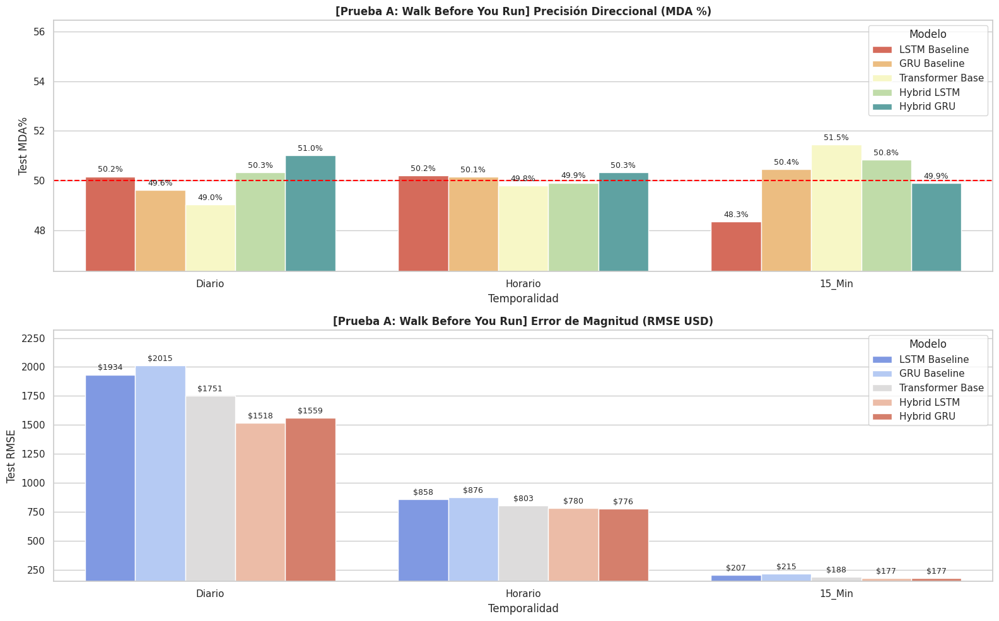


📈 Generando Trayectorias Acumulativas para Prueba A: Walk Before You Run...


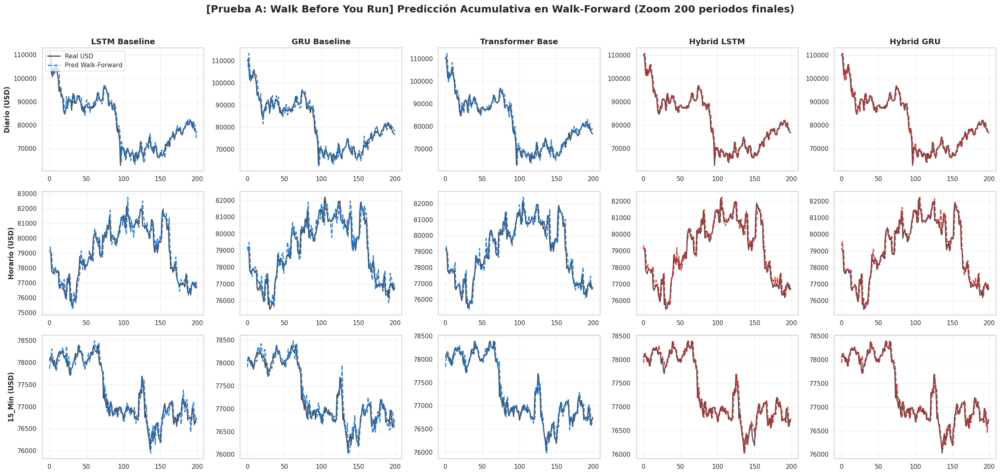


📊 TABLA DE RESULTADOS:


,Temporalidad,Modelo,Test RMSE,Test MAE,Test MDA%
14,15_Min,Hybrid GRU,176.872527,119.042373,49.896337
13,15_Min,Hybrid LSTM,177.195189,119.441920,50.829302
12,15_Min,Transformer Base,187.543377,128.240451,51.451279
10,15_Min,LSTM Baseline,206.649566,146.543075,48.341396
11,15_Min,GRU Baseline,214.909377,154.552106,50.449205
3,Diario,Hybrid LSTM,1517.849656,967.665711,50.335852
4,Diario,Hybrid GRU,1558.725604,979.953398,51.007557
2,Diario,Transformer Base,1750.922911,1120.484109,49.034425
0,Diario,LSTM Baseline,1933.975655,1308.085686,50.167926
1,Diario,GRU Baseline,2014.565033,1376.068926,49.622166


In [ ]:
#@title Prueba A: Corto Plazo (14 in -> 1 out)
correr_experimento(nombre_exp="Prueba A: Walk Before You Run", seq_len=14, pred_len=1)

### Experimento B: El "Swing Trader" (Mediano Plazo)
**Hipótesis:** Aumentando la ventana a 30 días y obligando a la red a emitir un vector de 3 días hacia el futuro (`pred_len=3`), buscaremos identificar qué modelo es capaz de mantener la direccionalidad de una micro-tendencia sin sobreajustarse al ruido intradiario.


🚀 INICIANDO PRUEBA B: SWING TRADER
[Config: Mira 30 T hacia atrás -> Predice 3 T hacia adelante]

⌛ Procesando Temporalidad: Diario...

[Diario] Shape inicial: (3114, 13)
[Diario] Shape final tras limpieza: (3113, 13)
[Diario] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...

⌛ Procesando Temporalidad: Horario...

[Horario] Shape inicial: (15323, 13)
[Horario] Shape final tras limpieza: (5856, 13)
[Horario] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...

⌛ Procesando Temporalidad: 15_Min...

[15_Min] Shape inicial: (5441, 13)
[15_Min] Shape final tras limpieza: (3625, 13)
[15_Min] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...


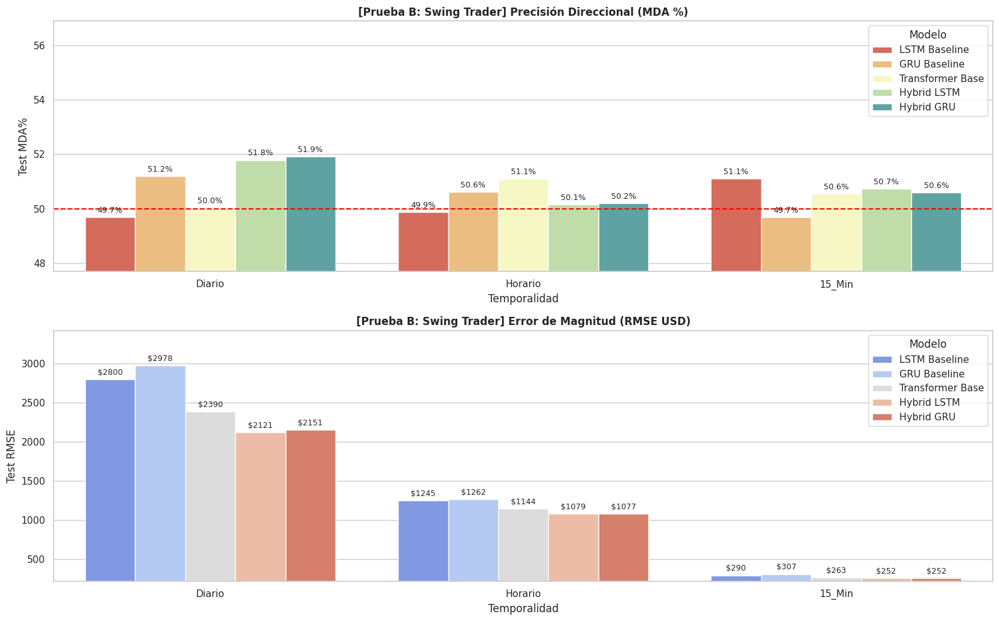


📈 Generando Trayectorias Acumulativas para Prueba B: Swing Trader...


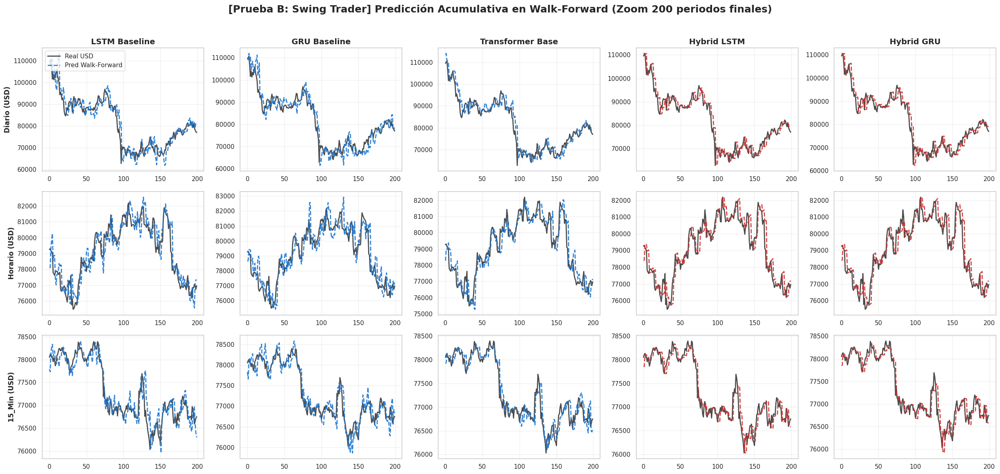


📊 TABLA DE RESULTADOS:


,Temporalidad,Modelo,Test RMSE,Test MAE,Test MDA%
14,15_Min,Hybrid GRU,251.604015,168.345802,50.587422
13,15_Min,Hybrid LSTM,251.839765,168.358147,50.725639
12,15_Min,Transformer Base,263.367036,177.431418,50.552868
10,15_Min,LSTM Baseline,290.214735,201.075050,51.105736
11,15_Min,GRU Baseline,306.874752,221.015736,49.689012
3,Diario,Hybrid LSTM,2120.863973,1349.926948,51.784964
4,Diario,Hybrid GRU,2151.021959,1361.490983,51.910962
2,Diario,Transformer Base,2389.974717,1538.435639,50.021000
0,Diario,LSTM Baseline,2800.329442,1865.064989,49.685006
1,Diario,GRU Baseline,2978.276111,1951.443230,51.196976


In [ ]:
#@title Prueba B: Swing Trader (30 in -> 3 out)
correr_experimento(nombre_exp="Prueba B: Swing Trader", seq_len=30, pred_len=3)

### Experimento C: El Contexto Rápido
**Hipótesis:** Proveyendo un contexto extenso (60 periodos) pero exigiendo una predicción de corto plazo (`pred_len=1`), evaluaremos si la memoria pesada del Transformer aprovecha la profundidad histórica o si, por el contrario, sufre de "ruido por exceso de información" en comparación con la GRU.


🚀 INICIANDO PRUEBA C: CONTEXTO RÁPIDO
[Config: Mira 60 T hacia atrás -> Predice 1 T hacia adelante]

⌛ Procesando Temporalidad: Diario...

[Diario] Shape inicial: (3114, 13)
[Diario] Shape final tras limpieza: (3113, 13)
[Diario] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...

⌛ Procesando Temporalidad: Horario...

[Horario] Shape inicial: (15323, 13)
[Horario] Shape final tras limpieza: (5852, 13)
[Horario] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...

⌛ Procesando Temporalidad: 15_Min...

[15_Min] Shape inicial: (5441, 13)
[15_Min] Shape final tras limpieza: (3620, 13)
[15_Min] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...


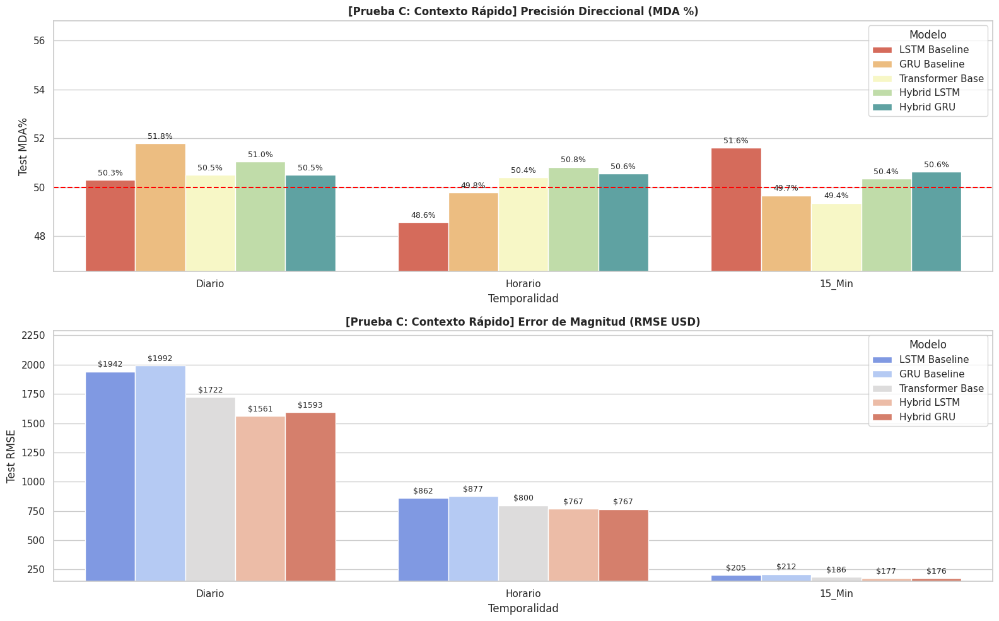


📈 Generando Trayectorias Acumulativas para Prueba C: Contexto Rápido...


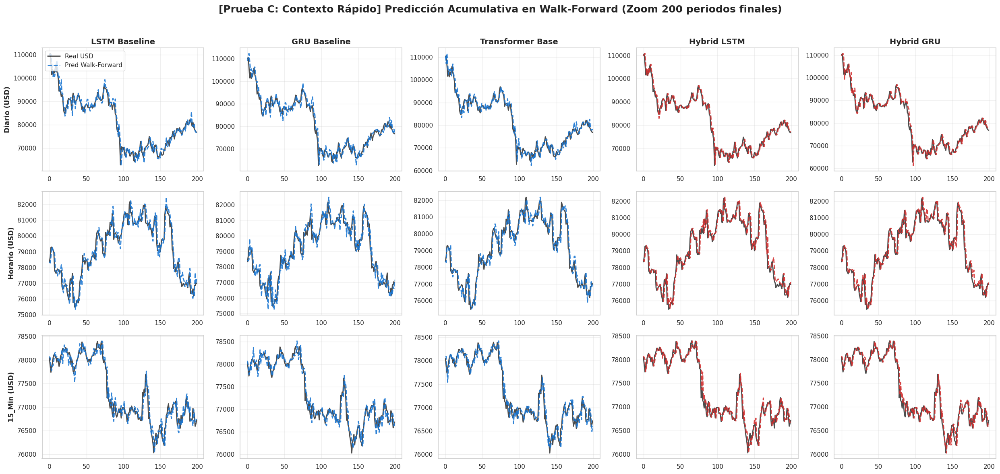


📊 TABLA DE RESULTADOS:


,Temporalidad,Modelo,Test RMSE,Test MAE,Test MDA%
13,15_Min,Hybrid LSTM,176.603004,119.006840,50.363448
14,15_Min,Hybrid GRU,176.166954,119.355143,50.640360
12,15_Min,Transformer Base,185.848049,127.741983,49.359640
10,15_Min,LSTM Baseline,204.798297,144.546879,51.609553
11,15_Min,GRU Baseline,211.866718,152.731106,49.671166
3,Diario,Hybrid LSTM,1560.691722,986.768059,51.049538
4,Diario,Hybrid GRU,1592.664551,992.324741,50.503778
2,Diario,Transformer Base,1722.216127,1116.723447,50.503778
0,Diario,LSTM Baseline,1941.706266,1311.191578,50.293871
1,Diario,GRU Baseline,1992.183801,1342.750674,51.805206


In [ ]:
#@title Prueba C: Contexto Rápido (60 in -> 1 out)
correr_experimento(nombre_exp="Prueba C: Contexto Rápido", seq_len=60, pred_len=1)

### Experimento D: Trader Común" (Corto Plazo)
**Hipótesis:** Un trade común, 20 de contexto y 20 de longitud del trade.


🚀 INICIANDO PRUEBA D: TRADE COMÚN
[Config: Mira 20 T hacia atrás -> Predice 20 T hacia adelante]

⌛ Procesando Temporalidad: Diario...

[Diario] Shape inicial: (3114, 13)
[Diario] Shape final tras limpieza: (3113, 13)
[Diario] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...

⌛ Procesando Temporalidad: Horario...

[Horario] Shape inicial: (15326, 13)
[Horario] Shape final tras limpieza: (5855, 13)
[Horario] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...

⌛ Procesando Temporalidad: 15_Min...

[15_Min] Shape inicial: (5455, 13)
[15_Min] Shape final tras limpieza: (3632, 13)
[15_Min] Features seleccionadas: 10
   🧠 LSTM Baseline...
   🧠 GRU Baseline...
   🧠 Transformer Base...
   🧠 Hybrid LSTM...
   🧠 Hybrid GRU...


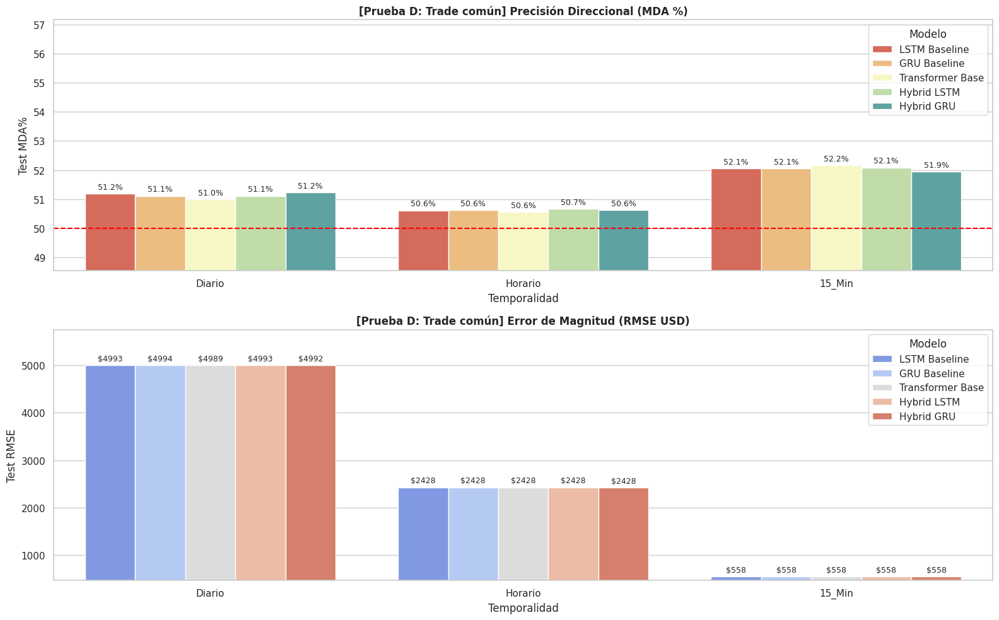


📈 Generando Trayectorias Acumulativas para Prueba D: Trade común...


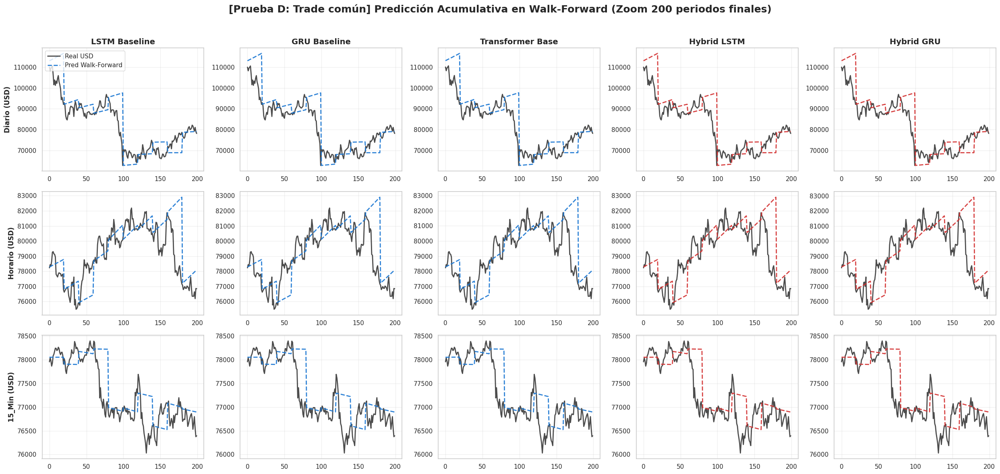


📊 TABLA DE RESULTADOS:


,Temporalidad,Modelo,Test RMSE,Test MAE,Test MDA%
12,15_Min,Transformer Base,557.577102,384.210318,52.155916
14,15_Min,Hybrid GRU,558.016560,384.481755,51.948948
11,15_Min,GRU Baseline,558.105182,384.550520,52.052432
13,15_Min,Hybrid LSTM,558.087568,384.569357,52.086927
10,15_Min,LSTM Baseline,558.295881,384.713869,52.052432
2,Diario,Transformer Base,4988.769698,3182.957985,50.987810
0,Diario,LSTM Baseline,4992.511848,3185.048807,51.197982
3,Diario,Hybrid LSTM,4992.513431,3185.064759,51.113913
4,Diario,Hybrid GRU,4992.088372,3185.170215,51.240017
1,Diario,GRU Baseline,4994.117381,3186.148339,51.113913


In [ ]:
#@title Prueba D: Trade común, 20 in 20 out
correr_experimento(nombre_exp="Prueba D: Trade común", seq_len=20, pred_len=20)

## 10.4 Experimento 4: Dynamic VIX-Weighted Loss (State-of-the-art approach)


**Objetivo:** Implementar la propuesta de trabajo futuro del paper. Adaptar dinámicamente el parámetro $\lambda$ de la penalización direccional en función de la volatilidad instantánea del mercado (VIX).
**Diseño Matemático:** Se modifica la función de pérdida para que extraiga el valor del VIX en el último instante de la secuencia de entrada ($T_{t-1}$). El peso direccional se calcula como $\lambda_t = \lambda_{base} \cdot \exp(-VIX_t)$, volviendo al modelo conservador durante el caos y agresivo durante las tendencias estables.
**Configuración Base:** Se utilizará la ventana ganadora del Ablation Study: `seq_len=60` y `pred_len=1`.

🚀 INICIANDO EXPERIMENTO 4: Dynamic VIX-Adjusted Loss (Walk-Forward)...

⌛ Temporalidad: Diario

[Diario] Shape inicial: (3114, 13)
[Diario] Shape final tras limpieza: (3113, 13)
[Diario] Features seleccionadas: 10
   ✅ VIX encontrado en columna índice: 7
   🧠 Hybrid LSTM (VIX)...
      RMSE: $1,658 | MDA: 50.59%
   🧠 Hybrid GRU (VIX)...
      RMSE: $1,646 | MDA: 50.29%

⌛ Temporalidad: Horario

[Horario] Shape inicial: (15320, 13)
[Horario] Shape final tras limpieza: (5844, 13)
[Horario] Features seleccionadas: 10
   ✅ VIX encontrado en columna índice: 7
   🧠 Hybrid LSTM (VIX)...
      RMSE: $786 | MDA: 51.01%
   🧠 Hybrid GRU (VIX)...
      RMSE: $784 | MDA: 50.44%

⌛ Temporalidad: 15_Min

[15_Min] Shape inicial: (5413, 13)
[15_Min] Shape final tras limpieza: (3578, 13)
[15_Min] Features seleccionadas: 10
   ✅ VIX encontrado en columna índice: 7
   🧠 Hybrid LSTM (VIX)...
      RMSE: $180 | MDA: 51.32%
   🧠 Hybrid GRU (VIX)...
      RMSE: $183 | MDA: 50.79%

📊 RESULTADOS EXPERIMENTO 4: 

,Temporalidad,Modelo,Test RMSE,Test MAE,Test MAPE,Test MDA%
4,15_Min,Hybrid LSTM (VIX),179.761159,121.260654,0.159485,51.317176
5,15_Min,Hybrid GRU (VIX),182.911202,123.994647,0.163105,50.790306
1,Diario,Hybrid GRU (VIX),1646.205681,1042.627768,2.283283,50.293871
0,Diario,Hybrid LSTM (VIX),1657.631828,1058.417867,2.311511,50.587741
3,Horario,Hybrid GRU (VIX),783.680337,503.448440,0.571065,50.440055
2,Horario,Hybrid LSTM (VIX),786.213287,506.677570,0.575146,51.007236


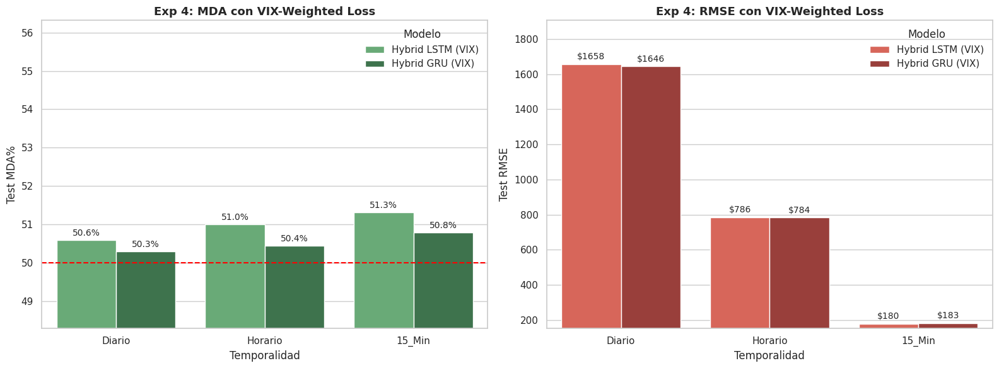

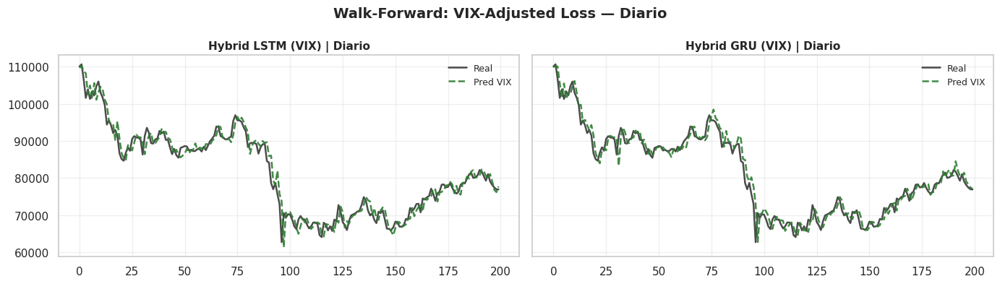

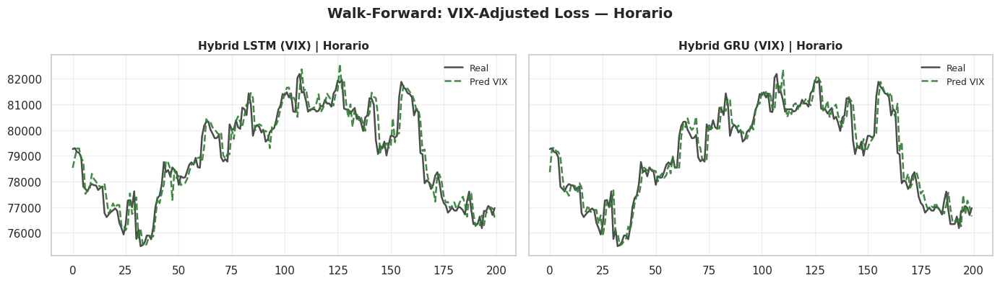

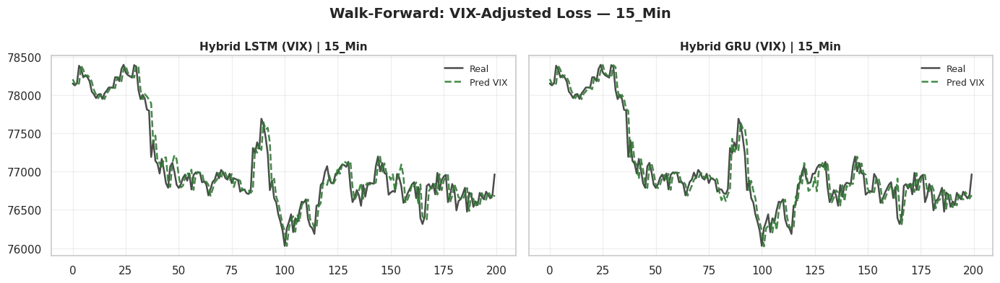

In [ ]:
#@title Experimento 4: Dynamic VIX-Adjusted Loss (Walk-Forward, Diario+Horario+15Min)
import torch, torch.nn as nn, numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display

print("🚀 INICIANDO EXPERIMENTO 4: Dynamic VIX-Adjusted Loss (Walk-Forward)...")

# ─── 1. FUNCIÓN DE PÉRDIDA DINÁMICA ────────────────────────────────────────────
class DynamicVIXLoss(nn.Module):
    """
    λ(t) = λ_base + VIX_norm(t) * (λ_max - λ_base)
    VIX alto  → λ grande → conservador (penaliza más errores de dirección)
    VIX bajo  → λ pequeño → agresivo  (confía en la tendencia)
    """
    def __init__(self, vix_col_idx, base_lambda=0.1, max_lambda=1.5, delta=1.0):
        super().__init__()
        self.huber       = nn.HuberLoss(delta=delta)
        self.vix_col_idx = vix_col_idx
        self.base_lam    = base_lambda
        self.max_lam     = max_lambda

    def forward(self, y_pred, y_true, x_input):
        y_pred = y_pred.squeeze()
        y_true = y_true.squeeze()

        loss_mag = self.huber(y_pred, y_true)

        signo_real   = torch.sign(y_true)
        penalizacion = -(y_pred * signo_real)
        loss_dir_raw = torch.relu(penalizacion)

        # VIX del último timestep de cada secuencia del batch
        vix_t    = x_input[:, -1, self.vix_col_idx]          # (B,)
        vmin, vmax = vix_t.min(), vix_t.max()
        vix_norm = (vix_t - vmin) / (vmax - vmin + 1e-8)     # [0, 1]
        dyn_lam  = self.base_lam + vix_norm * (self.max_lam - self.base_lam)  # (B,)

        loss_dir = (dyn_lam * loss_dir_raw).mean()
        return loss_mag + loss_dir


# ─── 2. MOTOR WALK-FORWARD CON VIX DINÁMICO ────────────────────────────────────
def wf_eval_vix(modelo, data_dict, vix_col_idx,
                seq_len=60, pred_len=1, warmup_size=730):
    features_raw = data_dict['features_raw']
    target_raw   = data_dict['target_raw']
    precios      = data_dict['precios_absolutos']
    cols         = data_dict['feature_cols']
    N = len(features_raw)

    optimizer = torch.optim.Adam(modelo.parameters(), lr=0.001, weight_decay=1e-4)
    criterion = DynamicVIXLoss(
        vix_col_idx=vix_col_idx, base_lambda=0.1, max_lambda=1.5, delta=1.0
    )

    all_reals, all_preds = [], []
    is_warmup = True

    idx_std = [i for i, c in enumerate(cols) if c in cols_log_return + cols_volume + cols_diff_std]
    idx_rob = [i for i, c in enumerate(cols) if c in cols_pct_robust + cols_diff_robust]
    idx_mm  = [i for i, c in enumerate(cols) if i not in idx_std + idx_rob]

    for t in range(warmup_size, N - pred_len + 1, pred_len):
        # ── Escalar ventana de entrenamiento ──
        train_F = features_raw[t - warmup_size : t]
        train_T = target_raw[t - warmup_size : t]

        sc_std, sc_rob, sc_mm = StandardScaler(), RobustScaler(), MinMaxScaler((-1, 1))
        scaler_t = StandardScaler()

        train_F_sc = np.zeros_like(train_F)
        if idx_std: train_F_sc[:, idx_std] = sc_std.fit_transform(train_F[:, idx_std])
        if idx_rob: train_F_sc[:, idx_rob] = sc_rob.fit_transform(train_F[:, idx_rob])
        if idx_mm:  train_F_sc[:, idx_mm]  = sc_mm.fit_transform(train_F[:, idx_mm])
        train_T_sc = scaler_t.fit_transform(train_T.reshape(-1, 1)).flatten()

        X_tr, y_tr = create_sequences(train_F_sc, train_T_sc,
                                       seq_length=seq_len, pred_length=pred_len)
        loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)

        # ── Escalar ventana de inferencia ──
        test_F_raw = features_raw[t - seq_len : t]
        test_F_sc  = np.zeros_like(test_F_raw)
        if idx_std: test_F_sc[:, idx_std] = sc_std.transform(test_F_raw[:, idx_std])
        if idx_rob: test_F_sc[:, idx_rob] = sc_rob.transform(test_F_raw[:, idx_rob])
        if idx_mm:  test_F_sc[:, idx_mm]  = sc_mm.transform(test_F_raw[:, idx_mm])

        x_infer = torch.tensor(test_F_sc, dtype=torch.float32).unsqueeze(0).to(device)
        real_prices = precios[t : t + pred_len]
        P_t = precios[t - 1]

        # ── Entrenamiento ──
        epochs = 15 if is_warmup else 2
        for _ in range(epochs):
            modelo.train()
            for xb, yb in loader:
                xb, yb = xb.to(device), yb.to(device)
                optimizer.zero_grad()
                loss = criterion(modelo(xb), yb, xb)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(modelo.parameters(), 1.0)
                optimizer.step()

        # ── Inferencia ──
        modelo.eval()
        with torch.no_grad():
            p_sc      = modelo(x_infer).cpu().numpy()[0]
            p_log_ret = scaler_t.inverse_transform(p_sc.reshape(-1, 1)).flatten()
            pred_usd  = P_t * np.exp(np.cumsum(p_log_ret))

        all_preds.extend(pred_usd)
        all_reals.extend(real_prices)
        is_warmup = False

    return calc_metrics(all_reals, all_preds), all_reals, all_preds


# ─── 3. CONFIGURACIÓN Y EJECUCIÓN ──────────────────────────────────────────────
device     = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
SEQ_LEN    = 60
PRED_LEN   = 1
WARMUP     = 730

datasets_raw = {
    'Diario':  df_diario_ext,
    'Horario': df_horario_ext,
    '15_Min':  df_15m_ext
}

resultados_vix = []
trayectorias_vix = {}

for nombre_ds, df_raw in datasets_raw.items():
    print(f"\n{'='*60}\n⌛ Temporalidad: {nombre_ds}")

    # Forzar VIX en las features aunque SHAP no lo haya seleccionado
    feats_con_vix = list(dict.fromkeys(top_features + ['Sentiment_VIX']))
    df_filtrado   = df_raw[[c for c in feats_con_vix if c in df_raw.columns] + ['Target_BTC']].copy()
    data_prep     = preparacion_datos_base(df_filtrado, nombre_ds)
    cols          = data_prep['feature_cols']
    input_dim     = data_prep['features_raw'].shape[1]

    # Índice del VIX en el tensor ya preparado
    if 'Sentiment_VIX' in cols:
        vix_idx = cols.index('Sentiment_VIX')
        print(f"   ✅ VIX encontrado en columna índice: {vix_idx}")
    else:
        print(f"   ❌ VIX no disponible en {nombre_ds} — saltando.")
        continue

    trayectorias_vix[nombre_ds] = {}

    for nombre_mod, rnn_type in [('Hybrid LSTM (VIX)', 'LSTM'), ('Hybrid GRU (VIX)', 'GRU')]:
        print(f"   🧠 {nombre_mod}...")

        if rnn_type == 'LSTM':
            modelo = Hybrid_LSTM_Transformer(
                input_dim, d_model=32, num_heads=4,
                hidden_dim_lstm=64, num_layers_lstm=2, pred_len=PRED_LEN
            ).to(device)
        else:
            modelo = Hybrid_GRU_Transformer(
                input_dim, d_model=32, num_heads=4,
                hidden_dim_gru=64, num_layers_gru=2, pred_len=PRED_LEN
            ).to(device)

        met, reales, preds = wf_eval_vix(
            modelo, data_prep, vix_idx,
            seq_len=SEQ_LEN, pred_len=PRED_LEN, warmup_size=WARMUP
        )

        resultados_vix.append({
            'Temporalidad': nombre_ds,
            'Modelo':       nombre_mod,
            'Test RMSE':    met['RMSE'],
            'Test MAE':     met['MAE'],
            'Test MAPE':    met['MAPE (%)'],
            'Test MDA%':    met['MDA (%)']
        })
        trayectorias_vix[nombre_ds][nombre_mod] = (reales, preds)
        print(f"      RMSE: ${met['RMSE']:,.0f} | MDA: {met['MDA (%)']:.2f}%")

df_vix = pd.DataFrame(resultados_vix)

print("\n" + "="*60)
print("📊 RESULTADOS EXPERIMENTO 4: DYNAMIC VIX-ADJUSTED LOSS")
print("="*60)
display(df_vix.sort_values(by=['Temporalidad', 'Test MAE']))

# ─── 4. GRÁFICAS ───────────────────────────────────────────────────────────────
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.barplot(data=df_vix, x='Temporalidad', y='Test MDA%',
            hue='Modelo', ax=axes[0], palette="Greens_d")
axes[0].axhline(50, color='red', linestyle='--', linewidth=1.5)
axes[0].set_title('Exp 4: MDA con VIX-Weighted Loss', fontweight='bold', fontsize=13)
axes[0].set_ylim(max(40, df_vix['Test MDA%'].min() - 2), df_vix['Test MDA%'].max() + 5)
for c in axes[0].containers:
    axes[0].bar_label(c, fmt='%.1f%%', padding=3, fontsize=10)

sns.barplot(data=df_vix, x='Temporalidad', y='Test RMSE',
            hue='Modelo', ax=axes[1], palette="Reds_d")
axes[1].set_title('Exp 4: RMSE con VIX-Weighted Loss', fontweight='bold', fontsize=13)
axes[1].set_ylim(df_vix['Test RMSE'].min() * 0.85, df_vix['Test RMSE'].max() * 1.15)
for c in axes[1].containers:
    axes[1].bar_label(c, fmt='$%.0f', padding=3, fontsize=10)

plt.tight_layout()
plt.show()

# ─── 5. TRAYECTORIAS PREDICCIÓN vs REAL ────────────────────────────────────────
for nombre_ds, modelos_tray in trayectorias_vix.items():
    fig, axes = plt.subplots(1, len(modelos_tray), figsize=(14, 4), sharey=True)
    if len(modelos_tray) == 1:
        axes = [axes]
    for ax, (nombre_mod, (reales, preds)) in zip(axes, modelos_tray.items()):
        zoom = min(200, len(reales))
        ax.plot(reales[-zoom:], color='black', linewidth=1.8, label='Real', alpha=0.7)
        ax.plot(preds[-zoom:],  color='#2E7D32', linewidth=1.8,
                linestyle='--', label='Pred VIX', alpha=0.9)
        ax.set_title(f'{nombre_mod} | {nombre_ds}', fontsize=11, fontweight='bold')
        ax.legend(fontsize=9)
        ax.grid(True, alpha=0.3)
    plt.suptitle(f'Walk-Forward: VIX-Adjusted Loss — {nombre_ds}',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

## 10.5 Experimento 5: Pruebas ACF y PACF

### Experimento E: Optimización Econométrica (Data-Driven Box-Jenkins)
**Objetivo:** Eliminar la selección heurística de hiperparámetros. Utilizar la Función de Autocorrelación Parcial (PACF) de la serie de retornos y de volatilidad para definir matemáticamente el horizonte de predicción (`pred_len`) y la ventana de contexto histórico (`seq_len`).
**Hipótesis:** Un `seq_len` alineado con la memoria estadística de la varianza (Efecto GARCH) combinado con un `pred_len` restringido a los rezagos significativos lineales, permitirá al Híbrido filtrar ruido innecesario y maximizar el rendimiento direccional.

📊 Generando Correlogramas para Bitcoin (Diario)...


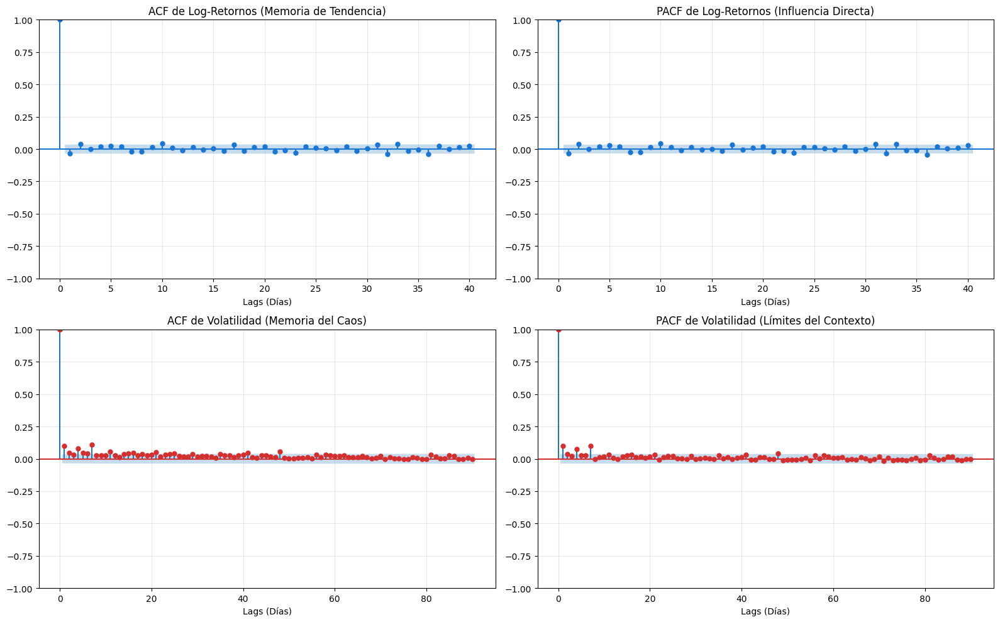


💡 CÓMO INTERPRETAR ESTO PARA TU PAPER:
1. Para 'pred_len': Mira la PACF azul (Arriba Derecha). El último 'palito' que sobrepase
   el área azul sombreada (95% de confianza) antes de apagarse, es tu límite de predicción.
   En crypto, esto suele morir en el lag 1, 3 o máximo 7.
2. Para 'seq_len': Mira la PACF roja (Abajo Derecha). La volatilidad tiene mucha memoria.
   Busca el último pico significativo (suele estar cerca de 14, 21 o 30 días). Ese será el
   tamaño ideal de tu ventana de contexto para el Transformer.


In [ ]:
#@title Diagnóstico Econométrico: Análisis ACF y PACF (Fijando seq_len y pred_len)

import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import numpy as np

print("📊 Generando Correlogramas para Bitcoin (Diario)...")

# 1. Calcular Log-Retornos y Volatilidad (Retornos al Cuadrado)
precios_diarios = df_diario_ext['Target_BTC'].dropna()
log_returns = np.log(precios_diarios / precios_diarios.shift(1)).dropna()
volatilidad = log_returns ** 2  # Proxy de la varianza condicional

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# --- FILA 1: LOG-RETORNOS CRUDOS (Nos dice el 'pred_len' óptimo) ---
# La ACF nos muestra la memoria a corto plazo. La PACF la influencia directa de un día aislado.
plot_acf(log_returns, lags=40, ax=axes[0, 0], color='#1976D2', title='ACF de Log-Retornos (Memoria de Tendencia)')
plot_pacf(log_returns, lags=40, ax=axes[0, 1], color='#1976D2', title='PACF de Log-Retornos (Influencia Directa)')

# --- FILA 2: VOLATILIDAD / RETORNOS AL CUADRADO (Nos dice el 'seq_len' óptimo) ---
# Como el modelo usa Volatility-Adjusted Loss, necesita ver todo el clúster de volatilidad
plot_acf(volatilidad, lags=90, ax=axes[1, 0], color='#D32F2F', title='ACF de Volatilidad (Memoria del Caos)')
plot_pacf(volatilidad, lags=90, ax=axes[1, 1], color='#D32F2F', title='PACF de Volatilidad (Límites del Contexto)')

# Estética
for ax in axes.flatten():
    ax.grid(True, alpha=0.3)
    ax.set_xlabel('Lags (Días)')

plt.tight_layout()
plt.show()

print("\n💡 CÓMO INTERPRETAR ESTO PARA TU PAPER:")
print("1. Para 'pred_len': Mira la PACF azul (Arriba Derecha). El último 'palito' que sobrepase")
print("   el área azul sombreada (95% de confianza) antes de apagarse, es tu límite de predicción.")
print("   En crypto, esto suele morir en el lag 1, 3 o máximo 7.")
print("2. Para 'seq_len': Mira la PACF roja (Abajo Derecha). La volatilidad tiene mucha memoria.")
print("   Busca el último pico significativo (suele estar cerca de 14, 21 o 30 días). Ese será el")
print("   tamaño ideal de tu ventana de contexto para el Transformer.")

🧠 INICIANDO EXPERIMENTO E: Auto-Tuning Estadístico de Hiperparámetros...

📊 Extrayendo memoria estadística (PACF) del mercado...
   [Diario] -> Contexto Óptimo (seq_len): 48 | Predicción Óptima (pred_len): 2
   [Horario] -> Contexto Óptimo (seq_len): 11 | Predicción Óptima (pred_len): 6
   [15_Min] -> Contexto Óptimo (seq_len): 18 | Predicción Óptima (pred_len): 1

🚀 INICIANDO ENTRENAMIENTO CON PARÁMETROS DINÁMICOS...

⌛ Procesando: Diario
   ⚙️  Configuración inyectada: 48 In -> 2 Out

[Diario] Shape inicial: (3114, 13)
[Diario] Shape final tras limpieza: (3113, 13)
[Diario] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
   🧠 Evaluando GRU Baseline...
   🧠 Evaluando Transformer Base...
   🧠 Evaluando Hybrid LSTM...
   🧠 Evaluando Hybrid GRU...

⌛ Procesando: Horario
   ⚙️  Configuración inyectada: 11 In -> 6 Out

[Horario] Shape inicial: (15327, 13)
[Horario] Shape final tras limpieza: (5856, 13)
[Horario] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
   🧠 Eva

,Temporalidad,Modelo,Params (In->Out),Test RMSE,Test MAE,Test MDA%
13,15_Min,Hybrid LSTM,18 -> 1,173.357741,116.822281,50.637272
14,15_Min,Hybrid GRU,18 -> 1,177.817729,119.259138,50.533930
12,15_Min,Transformer Base,18 -> 1,188.186652,129.060148,50.396142
10,15_Min,LSTM Baseline,18 -> 1,209.780130,149.266403,51.429556
11,15_Min,GRU Baseline,18 -> 1,210.592811,150.473160,52.152945
4,Diario,Hybrid GRU,48 -> 2,1822.028573,1155.056351,51.364973
3,Diario,Hybrid LSTM,48 -> 2,1834.765215,1163.168056,51.406972
2,Diario,Transformer Base,48 -> 2,2020.980432,1311.987631,51.532969
1,Diario,GRU Baseline,48 -> 2,2448.443459,1656.350122,50.440991
0,Diario,LSTM Baseline,48 -> 2,2508.934888,1692.495040,49.307014


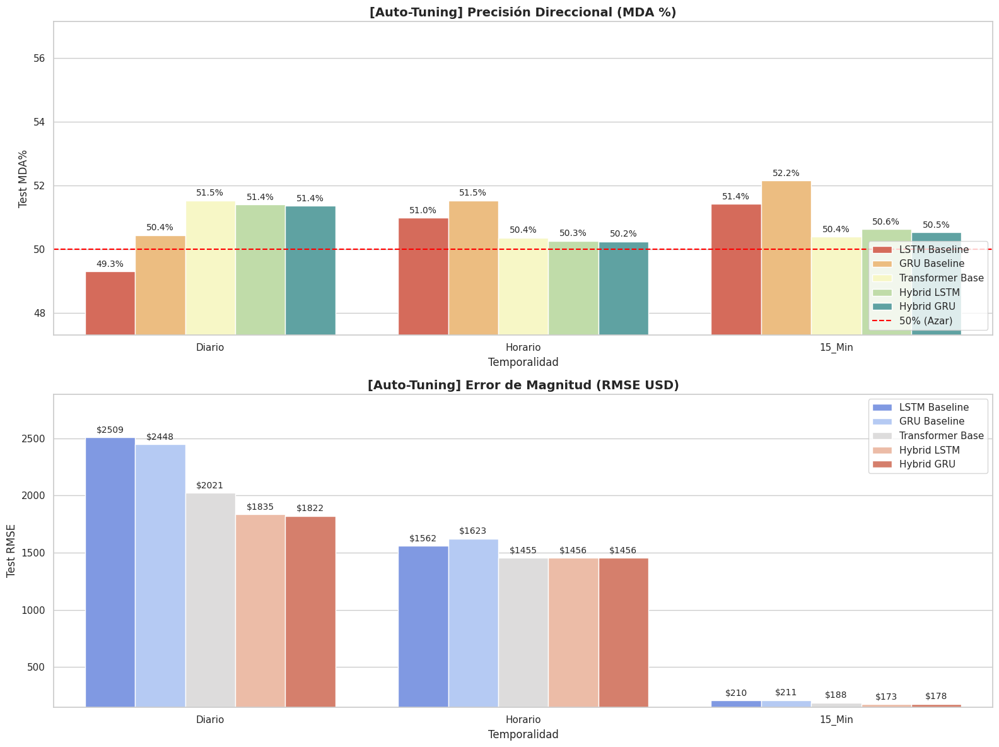

In [ ]:
#@title Experimento E: Autotuning Matemático (Box-Jenkins) y Evaluación
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from statsmodels.tsa.stattools import pacf
from IPython.display import display

print("🧠 INICIANDO EXPERIMENTO E: Auto-Tuning Estadístico de Hiperparámetros...")

# =====================================================================
# 1. ALGORITMO AUTOMÁTICO DE BOX-JENKINS PARA HALLAR VENTANAS ÓPTIMAS
# =====================================================================
def calcular_ventanas_optimas(df, nombre, max_pred=7, max_seq=90):
    # Calcular retornos logarítmicos y volatilidad
    precios = df['Target_BTC'].dropna()
    log_ret = np.log(precios / precios.shift(1)).replace([np.inf, -np.inf], np.nan).dropna()
    volatilidad = log_ret ** 2

    # Límite estadístico: Intervalo de confianza del 95% (+/- 1.96 / sqrt(N))
    umbral_ret = 1.96 / np.sqrt(len(log_ret))
    umbral_vol = 1.96 / np.sqrt(len(volatilidad))

    # PACF de Retornos (Para hallar pred_len)
    pacf_r = pacf(log_ret, nlags=max_pred)
    lags_sig_r = np.where(np.abs(pacf_r[1:]) > umbral_ret)[0] + 1
    # Tomamos el último lag significativo. Si no hay memoria, por defecto 1.
    opt_pred_len = int(lags_sig_r[-1]) if len(lags_sig_r) > 0 else 1

    # PACF de Volatilidad (Para hallar seq_len)
    pacf_v = pacf(volatilidad, nlags=max_seq)
    lags_sig_v = np.where(np.abs(pacf_v[1:]) > umbral_vol)[0] + 1
    # Tomamos el último lag de volatilidad significativo. Mínimo 10 para dar algo de contexto.
    opt_seq_len = int(lags_sig_v[-1]) if len(lags_sig_v) > 0 else 10

    print(f"   [{nombre}] -> Contexto Óptimo (seq_len): {opt_seq_len} | Predicción Óptima (pred_len): {opt_pred_len}")
    return opt_seq_len, opt_pred_len

# Diccionario para guardar los parámetros autocalculados
parametros_optimos = {}
datasets_raw = {'Diario': df_diario_ext, 'Horario': df_horario_ext, '15_Min': df_15m_ext}

print("\n📊 Extrayendo memoria estadística (PACF) del mercado...")
for nombre_ds, df in datasets_raw.items():
    s_len, p_len = calcular_ventanas_optimas(df, nombre_ds)
    parametros_optimos[nombre_ds] = {'seq_len': s_len, 'pred_len': p_len}

# =====================================================================
# 2. MOTOR DE EXPERIMENTOS ADAPTATIVO
# =====================================================================
resultados_opt = []
trayectorias_opt = {}

print("\n🚀 INICIANDO ENTRENAMIENTO CON PARÁMETROS DINÁMICOS...")

for nombre_ds, df_raw in datasets_raw.items():
    print(f"\n{'='*70}\n⌛ Procesando: {nombre_ds}")

    # Extraer los parámetros exactos calculados por PACF para esta temporalidad
    s_len = parametros_optimos[nombre_ds]['seq_len']
    p_len = parametros_optimos[nombre_ds]['pred_len']
    print(f"   ⚙️  Configuración inyectada: {s_len} In -> {p_len} Out")

    df_filtrado = df_raw[top_features + ['Target_BTC']].copy()
    data_prep = preparacion_datos_base(df_filtrado, nombre_ds)
    input_features = data_prep['features_raw'].shape[1]

    # Construir modelos DINÁMICAMENTE con el nuevo pred_len
    modelos_instancias = {
        'LSTM Baseline':    Baseline_LSTM(input_features, 32, pred_length=p_len),
        'GRU Baseline':     Baseline_GRU(input_features, 32, pred_length=p_len),
        'Transformer Base': Baseline_Transformer(input_features, 32, pred_length=p_len),
        'Hybrid LSTM':      Hybrid_LSTM_Transformer(input_features, d_model=32, num_heads=4, hidden_dim_lstm=64, num_layers_lstm=2, pred_len=p_len),
        'Hybrid GRU':       Hybrid_GRU_Transformer(input_features, d_model=32, num_heads=4, hidden_dim_gru=64, num_layers_gru=2, pred_len=p_len)
    }

    trayectorias_opt[nombre_ds] = {}

    for nombre_mod, modelo in modelos_instancias.items():
        print(f"   🧠 Evaluando {nombre_mod}...")
        modelo = modelo.to(device)

        # OJO: Usamos el wf_eval_experimento de nuestra celda Maestra (con la VolatilityDirectionalLoss)
        met_test, reales, preds = wf_eval_experimento(
            modelo, data_prep, seq_len=s_len, pred_len=p_len, warmup_size=730
        )

        resultados_opt.append({
            'Temporalidad': nombre_ds, 'Modelo': nombre_mod,
            'Params (In->Out)': f"{s_len} -> {p_len}",
            'Test RMSE': met_test['RMSE'], 'Test MAE': met_test['MAE'],
            'Test MDA%': met_test['MDA (%)']
        })
        trayectorias_opt[nombre_ds][nombre_mod] = (reales, preds)

df_res_opt = pd.DataFrame(resultados_opt)

# =====================================================================
# 3. GRÁFICAS DE RESULTADOS
# =====================================================================
print("\n" + "="*60)
print("📊 RESULTADOS FINALES: AUTO-TUNING STATISTICAL (PACF)")
print("="*60)
display(df_res_opt.sort_values(by=['Temporalidad', 'Test MAE']))

sns.set_theme(style="whitegrid")
fig1, axes1 = plt.subplots(2, 1, figsize=(16, 12))

# MDA
sns.barplot(data=df_res_opt, x='Temporalidad', y='Test MDA%', hue='Modelo', ax=axes1[0], palette="Spectral")
axes1[0].set_title(f'[Auto-Tuning] Precisión Direccional (MDA %)', fontweight='bold', fontsize=14)
axes1[0].axhline(50, color='red', linestyle='--', label='50% (Azar)')
min_mda = df_res_opt['Test MDA%'].min()
axes1[0].set_ylim(max(40, min_mda - 2), df_res_opt['Test MDA%'].max() + 5)
for c in axes1[0].containers: axes1[0].bar_label(c, fmt='%.1f%%', padding=3, fontsize=10)
axes1[0].legend(loc='lower right')

# RMSE
sns.barplot(data=df_res_opt, x='Temporalidad', y='Test RMSE', hue='Modelo', ax=axes1[1], palette="coolwarm")
axes1[1].set_title(f'[Auto-Tuning] Error de Magnitud (RMSE USD)', fontweight='bold', fontsize=14)
min_rmse = df_res_opt['Test RMSE'].min()
axes1[1].set_ylim(min_rmse * 0.85, df_res_opt['Test RMSE'].max() * 1.15)
for c in axes1[1].containers: axes1[1].bar_label(c, fmt='$%.0f', padding=3, fontsize=10)
axes1[1].legend(loc='upper right')

plt.tight_layout(); plt.show()

🚀 INICIANDO EXPERIMENTO ETH & SOL: Generalización del Híbrido a Nuevos Activos...

📥 Descargando datos para ETH (ETH-USD)...
   ✅ ETH: 1656 filas, 20 columnas.

📥 Descargando datos para SOL (SOL-USD)...
   ✅ SOL: 1335 filas, 21 columnas.

🔑 Features a usar (heredadas de BTC via SHAP): ['BTC_Volume', 'Macro_US10Y', 'MACD_Line', 'EMA_9', 'RSI_14', 'Macro_SP500', 'SMA_200', 'Sentiment_VIX', 'VWAP', 'EMA_200']

📊 Calculando memoria estadística (PACF) para ETH y SOL...
   [ETH] -> seq_len óptimo: 82 | pred_len óptimo: 7
   [SOL] -> seq_len óptimo: 61 | pred_len óptimo: 3

🚀 INICIANDO ENTRENAMIENTO WALK-FORWARD EN ETH Y SOL...

⌛ Activo: ETH
   ⚙️  Configuración PACF: 82 In -> 7 Out

[ETH] Shape inicial: (1656, 13)
[ETH] Shape final tras limpieza: (1655, 13)
[ETH] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
      RMSE: $218 | MDA: 50.92%
   🧠 Evaluando GRU Baseline...
      RMSE: $218 | MDA: 51.25%
   🧠 Evaluando Transformer Base...
      RMSE: $219 | MDA: 50.81%
   🧠 Evaluand

,Activo,Modelo,Params,Test RMSE,Test MAE,Test MAPE,Test MDA%
1,ETH,GRU Baseline,82 -> 7,217.861425,142.048654,5.507060,51.245937
4,ETH,Hybrid GRU,82 -> 7,217.759934,142.022357,5.503751,51.245937
3,ETH,Hybrid LSTM,82 -> 7,217.716449,142.028847,5.505765,51.137595
0,ETH,LSTM Baseline,82 -> 7,217.832708,142.072741,5.507707,50.920910
2,ETH,Transformer Base,82 -> 7,218.752928,141.955978,5.495508,50.812568
5,SOL,LSTM Baseline,61 -> 3,12.442874,9.194139,6.025552,50.664452
6,SOL,GRU Baseline,61 -> 3,14.230778,10.549503,6.904069,49.169435
9,SOL,Hybrid GRU,61 -> 3,11.018258,8.159969,5.338842,49.169435
8,SOL,Hybrid LSTM,61 -> 3,10.994252,8.145065,5.331479,48.837209
7,SOL,Transformer Base,61 -> 3,11.174856,8.263929,5.420783,48.006645


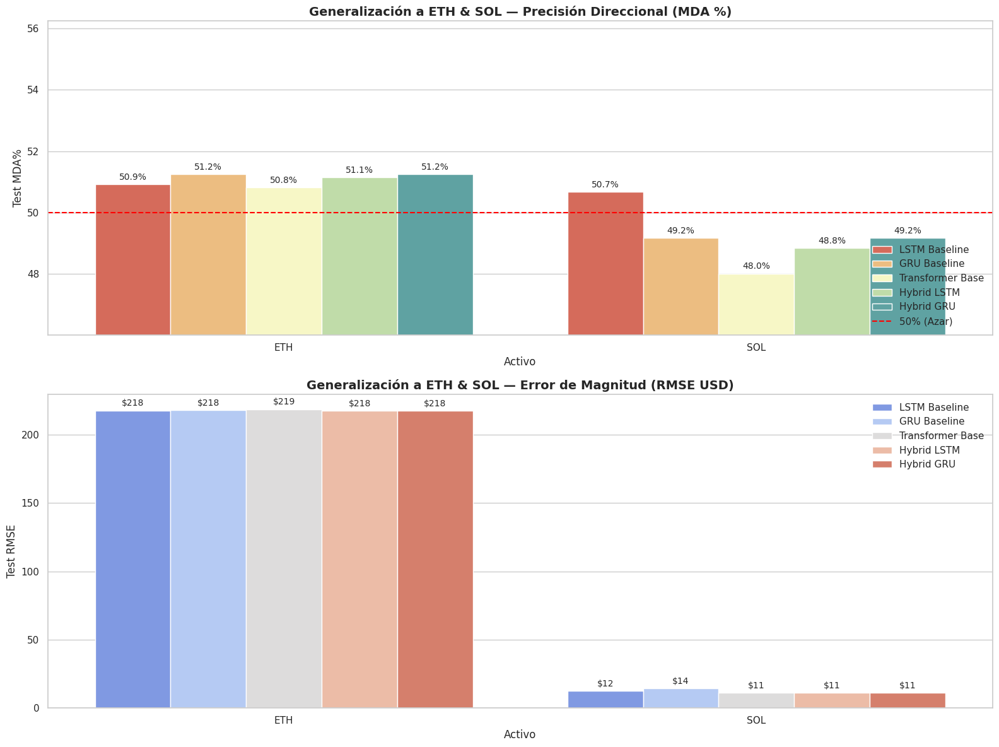

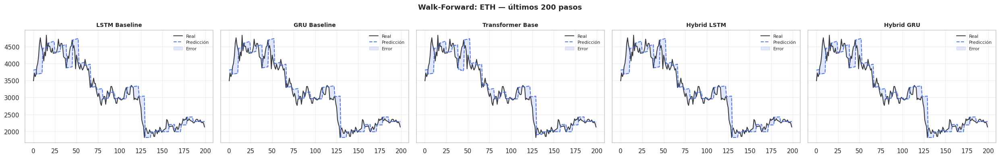

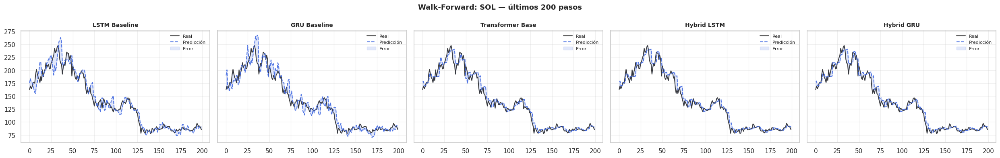

In [ ]:
#@title Experimento E.1 - ETH & SOL: Generalización a Nuevos Activos (Box-Jenkins Auto-Tuning)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import yfinance as yf
from statsmodels.tsa.stattools import pacf
from IPython.display import display

print("🚀 INICIANDO EXPERIMENTO ETH & SOL: Generalización del Híbrido a Nuevos Activos...")

# =====================================================================
# 1. DESCARGA Y PREPARACIÓN DE DATOS ETH Y SOL
# =====================================================================
def descargar_dataset_activo(ticker_symbol, nombre_activo, start='2019-01-01'):
    """Descarga y construye el mismo dataset multimodal usado para BTC."""
    print(f"\n📥 Descargando datos para {nombre_activo} ({ticker_symbol})...")

    # ── Precio principal del activo ──────────────────────────────────
    df_main = yf.download(ticker_symbol, start=start, auto_adjust=True, progress=False)

    # Aplanar MultiIndex si yfinance lo devuelve así
    if isinstance(df_main.columns, pd.MultiIndex):
        df_main.columns = [col[0] for col in df_main.columns]

    df_main = df_main[['Open', 'High', 'Low', 'Close', 'Volume']].copy()
    df_main.columns = [f'{nombre_activo}_{c}' for c in df_main.columns]
    df_main[f'Target_{nombre_activo}'] = df_main[f'{nombre_activo}_Close']

    # ── Macro y contexto ─────────────────────────────────────────────
    dfs_macro = {}
    for col_name, ticker in MACRO_TICKERS.items():
        if nombre_activo == 'ETH' and col_name == 'Context_ETH':
            continue
        try:
            tmp = yf.download(ticker, start=start, auto_adjust=True, progress=False)
            if isinstance(tmp.columns, pd.MultiIndex):
                tmp.columns = [col[0] for col in tmp.columns]
            tmp = tmp[['Close']].copy()
            tmp.columns = [col_name]
            dfs_macro[col_name] = tmp
        except Exception as e:
            print(f"   ⚠️  {col_name} no disponible ({e}), omitiendo.")

    df_macro = pd.concat(dfs_macro.values(), axis=1) if dfs_macro else pd.DataFrame()
    df_full = pd.concat([df_main, df_macro], axis=1).dropna()

    # ── Indicadores técnicos ─────────────────────────────────────────
    close = df_full[f'{nombre_activo}_Close']
    vol   = df_full[f'{nombre_activo}_Volume']

    df_full['EMA_9']   = close.ewm(span=9).mean()
    df_full['EMA_200'] = close.ewm(span=200).mean()
    df_full['SMA_200'] = close.rolling(200).mean()
    df_full['VWAP']    = (close * vol).cumsum() / vol.cumsum()

    delta = close.diff()
    gain  = delta.clip(lower=0).rolling(14).mean()
    loss  = (-delta.clip(upper=0)).rolling(14).mean()
    df_full['RSI_14'] = 100 - (100 / (1 + gain / loss.replace(0, 1e-10)))

    ema12 = close.ewm(span=12).mean()
    ema26 = close.ewm(span=26).mean()
    df_full['MACD_Line'] = ema12 - ema26
    df_full['MACD_Hist'] = df_full['MACD_Line'] - df_full['MACD_Line'].ewm(span=9).mean()

    # ── Renombrar para unificar con el pipeline de BTC ───────────────
    rename_map = {
        f'{nombre_activo}_Open':   'BTC_Open',
        f'{nombre_activo}_High':   'BTC_High',
        f'{nombre_activo}_Low':    'BTC_Low',
        f'{nombre_activo}_Close':  'BTC_Close',
        f'{nombre_activo}_Volume': 'BTC_Volume',
        f'Target_{nombre_activo}': 'Target_BTC',
    }
    df_full = df_full.rename(columns=rename_map)
    df_full = df_full.dropna()

    print(f"   ✅ {nombre_activo}: {len(df_full)} filas, {df_full.shape[1]} columnas.")
    return df_full


# Descargar ambos activos
dfs_nuevos_activos = {}
for nombre, ticker in TICKERS_EXTRA.items():
    dfs_nuevos_activos[nombre] = descargar_dataset_activo(ticker, nombre)

# =====================================================================
# 2. SELECCIÓN DE FEATURES CON EL MISMO PIPELINE XGBoost + SHAP
#    (Reutilizamos top_features de BTC como proxy — mismo mercado cripto)
# =====================================================================
# top_features ya fue calculado en la celda 17 para BTC.
# Lo aplicamos directamente: features compartidas entre activos.
print(f"\n🔑 Features a usar (heredadas de BTC via SHAP): {top_features}")

# =====================================================================
# 3. ALGORITMO BOX-JENKINS PARA VENTANAS ÓPTIMAS POR ACTIVO
# =====================================================================
def calcular_ventanas_optimas(df, nombre, max_pred=7, max_seq=90):
    precios = df['Target_BTC'].dropna()
    log_ret = np.log(precios / precios.shift(1)).replace([np.inf, -np.inf], np.nan).dropna()
    volatilidad = log_ret ** 2

    umbral_ret = 1.96 / np.sqrt(len(log_ret))
    umbral_vol = 1.96 / np.sqrt(len(volatilidad))

    pacf_r = pacf(log_ret, nlags=max_pred)
    lags_sig_r = np.where(np.abs(pacf_r[1:]) > umbral_ret)[0] + 1
    opt_pred_len = int(lags_sig_r[-1]) if len(lags_sig_r) > 0 else 1

    pacf_v = pacf(volatilidad, nlags=max_seq)
    lags_sig_v = np.where(np.abs(pacf_v[1:]) > umbral_vol)[0] + 1
    opt_seq_len = int(lags_sig_v[-1]) if len(lags_sig_v) > 0 else 10

    print(f"   [{nombre}] -> seq_len óptimo: {opt_seq_len} | pred_len óptimo: {opt_pred_len}")
    return opt_seq_len, opt_pred_len

print("\n📊 Calculando memoria estadística (PACF) para ETH y SOL...")
params_nuevos = {}
for nombre_activo, df_activo in dfs_nuevos_activos.items():
    s, p = calcular_ventanas_optimas(df_activo, nombre_activo)
    params_nuevos[nombre_activo] = {'seq_len': s, 'pred_len': p}

# =====================================================================
# 4. EXPERIMENTO: WALK-FORWARD CON TODOS LOS MODELOS
# =====================================================================
resultados_eth_sol = []
trayectorias_eth_sol = {}

print("\n🚀 INICIANDO ENTRENAMIENTO WALK-FORWARD EN ETH Y SOL...")

for nombre_activo, df_raw in dfs_nuevos_activos.items():
    print(f"\n{'='*70}\n⌛ Activo: {nombre_activo}")

    s_len = params_nuevos[nombre_activo]['seq_len']
    p_len = params_nuevos[nombre_activo]['pred_len']
    print(f"   ⚙️  Configuración PACF: {s_len} In -> {p_len} Out")

    # Filtrar solo las features disponibles (top_features puede tener cols que no existen en ETH/SOL)
    feats_disponibles = [f for f in top_features if f in df_raw.columns]
    if len(feats_disponibles) < 3:
        print(f"   ⚠️  Muy pocas features disponibles para {nombre_activo}, usando todas.")
        feats_disponibles = [c for c in df_raw.columns if c != 'Target_BTC']

    df_filtrado = df_raw[feats_disponibles + ['Target_BTC']].copy()
    data_prep = preparacion_datos_base(df_filtrado, nombre_activo)
    input_features = data_prep['features_raw'].shape[1]

    modelos_instancias = {
        'LSTM Baseline':    Baseline_LSTM(input_features, 32, pred_length=p_len),
        'GRU Baseline':     Baseline_GRU(input_features, 32, pred_length=p_len),
        'Transformer Base': Baseline_Transformer(input_features, 32, pred_length=p_len),
        'Hybrid LSTM':      Hybrid_LSTM_Transformer(input_features, d_model=32, num_heads=4,
                                hidden_dim_lstm=64, num_layers_lstm=2, pred_len=p_len),
        'Hybrid GRU':       Hybrid_GRU_Transformer(input_features, d_model=32, num_heads=4,
                                hidden_dim_gru=64, num_layers_gru=2, pred_len=p_len),
    }

    trayectorias_eth_sol[nombre_activo] = {}

    for nombre_mod, modelo in modelos_instancias.items():
        print(f"   🧠 Evaluando {nombre_mod}...")
        modelo = modelo.to(device)

        met_test, reales, preds = wf_eval_experimento(
            modelo, data_prep, seq_len=s_len, pred_len=p_len, warmup_size=730
        )

        resultados_eth_sol.append({
            'Activo':      nombre_activo,
            'Modelo':      nombre_mod,
            'Params':      f"{s_len} -> {p_len}",
            'Test RMSE':   met_test['RMSE'],
            'Test MAE':    met_test['MAE'],
            'Test MAPE':   met_test['MAPE (%)'],
            'Test MDA%':   met_test['MDA (%)'],
        })
        trayectorias_eth_sol[nombre_activo][nombre_mod] = (reales, preds)
        print(f"      RMSE: ${met_test['RMSE']:,.0f} | MDA: {met_test['MDA (%)']:.2f}%")

df_eth_sol = pd.DataFrame(resultados_eth_sol)

# =====================================================================
# 5. VISUALIZACIÓN DE RESULTADOS
# =====================================================================
print("\n" + "="*60)
print("📊 RESULTADOS FINALES — ETH & SOL")
print("="*60)
display(df_eth_sol.sort_values(by=['Activo', 'Test MDA%'], ascending=[True, False]))

sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(2, 1, figsize=(16, 12))

# MDA
sns.barplot(data=df_eth_sol, x='Activo', y='Test MDA%', hue='Modelo',
            ax=axes[0], palette="Spectral")
axes[0].set_title('Generalización a ETH & SOL — Precisión Direccional (MDA %)',
                   fontsize=14, fontweight='bold')
axes[0].axhline(50, color='red', linestyle='--', linewidth=1.5, label='50% (Azar)')
min_mda = df_eth_sol['Test MDA%'].min()
axes[0].set_ylim(max(40, min_mda - 2), df_eth_sol['Test MDA%'].max() + 5)
for c in axes[0].containers:
    axes[0].bar_label(c, fmt='%.1f%%', padding=3, fontsize=10)
axes[0].legend(loc='lower right')

# RMSE
sns.barplot(data=df_eth_sol, x='Activo', y='Test RMSE', hue='Modelo',
            ax=axes[1], palette="coolwarm")
axes[1].set_title('Generalización a ETH & SOL — Error de Magnitud (RMSE USD)',
                   fontsize=14, fontweight='bold')
for c in axes[1].containers:
    axes[1].bar_label(c, fmt='$%.0f', padding=3, fontsize=10)
axes[1].legend(loc='upper right')

plt.tight_layout()
plt.show()

# =====================================================================
# 6. TRAYECTORIAS PREDICCIÓN vs REAL (últimos 200 pasos)
# =====================================================================
for nombre_activo, modelos_tray in trayectorias_eth_sol.items():
    n_mods = len(modelos_tray)
    fig, axes = plt.subplots(1, n_mods, figsize=(5 * n_mods, 4), sharey=True)
    if n_mods == 1:
        axes = [axes]
    for ax, (nombre_mod, (reales, preds)) in zip(axes, modelos_tray.items()):
        zoom = min(200, len(reales))
        ax.plot(reales[-zoom:], color='black', linewidth=1.5, label='Real', alpha=0.75)
        ax.plot(preds[-zoom:],  color='royalblue', linewidth=1.5,
                linestyle='--', label='Predicción', alpha=0.9)
        ax.fill_between(range(zoom),
                         [min(r, p) for r, p in zip(reales[-zoom:], preds[-zoom:])],
                         [max(r, p) for r, p in zip(reales[-zoom:], preds[-zoom:])],
                         alpha=0.15, color='royalblue', label='Error')
        ax.set_title(f'{nombre_mod}', fontsize=10, fontweight='bold')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
    plt.suptitle(f'Walk-Forward: {nombre_activo} — últimos {zoom} pasos',
                  fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()

## 10.6 Experimento 6: Pruebas Finales PACF, ACF y Dynamic VIX

In [ ]:
class DynamicVIXLoss(nn.Module):
    def __init__(self, vix_col_idx, base_lambda=0.1, max_lambda=1.5, delta=1.0):
        super().__init__()
        self.huber       = nn.HuberLoss(delta=delta)
        self.vix_col_idx = vix_col_idx
        self.base_lam    = base_lambda
        self.max_lam     = max_lambda

    def forward(self, y_pred, y_true, x_input):
        # Forzamos dimensiones 2D (Batch, Pred_len) de forma segura
        y_pred = y_pred.view(y_pred.size(0), -1)
        y_true = y_true.view(y_true.size(0), -1)

        loss_mag = self.huber(y_pred, y_true)

        signo_real   = torch.sign(y_true)
        penalizacion = -(y_pred * signo_real)
        loss_dir_raw = torch.relu(penalizacion)

        vix_t    = x_input[:, -1, self.vix_col_idx]
        vmin, vmax = vix_t.min(), vix_t.max()
        vix_norm = (vix_t - vmin) / (vmax - vmin + 1e-8)
        dyn_lam  = self.base_lam + vix_norm * (self.max_lam - self.base_lam)

        # 🌟 FIJAMOS LA DIMENSIÓN A (Batch, 1) PASE LO QUE PASE
        dyn_lam = dyn_lam.view(-1, 1)

        loss_dir = (dyn_lam * loss_dir_raw).mean()
        return loss_mag + loss_dir

🚀 INICIANDO EXPERIMENTO DEFINITIVO: PACF Auto-Tuning + Dynamic VIX Loss...

📊 1. Extrayendo memoria estadística (PACF)...
   [Diario] -> Contexto (seq_len): 48 | Horizonte (pred_len): 2
   [Horario] -> Contexto (seq_len): 11 | Horizonte (pred_len): 6
   [15_Min] -> Contexto (seq_len): 58 | Horizonte (pred_len): 5

📊 2. Entrenando Modelos con VIX Loss + Autotuning PACF...

⌛ Procesando Temporalidad: Diario
   ⚙️  Inyectando: seq_len=48 | pred_len=2

[Diario] Shape inicial: (3115, 13)
[Diario] Shape final tras limpieza: (3114, 13)
[Diario] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
   🧠 Evaluando GRU Baseline...
   🧠 Evaluando Transformer Base...
   🧠 Evaluando Hybrid LSTM...
   🧠 Evaluando Hybrid GRU...

⌛ Procesando Temporalidad: Horario
   ⚙️  Inyectando: seq_len=11 | pred_len=6

[Horario] Shape inicial: (15335, 13)
[Horario] Shape final tras limpieza: (5849, 13)
[Horario] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
   🧠 Evaluando GRU Baseline...
   🧠 Ev

,Temporalidad,Modelo,Test RMSE,Test MDA%
13,15_Min,Hybrid LSTM,293.964851,51.672991
14,15_Min,Hybrid GRU,293.412878,51.672991
12,15_Min,Transformer Base,319.099581,51.431528
10,15_Min,LSTM Baseline,360.444260,51.362539
11,15_Min,GRU Baseline,381.777845,49.499828
3,Diario,Hybrid LSTM,1852.384986,51.699538
4,Diario,Hybrid GRU,1851.812080,51.573647
1,Diario,GRU Baseline,2467.234189,51.028116
0,Diario,LSTM Baseline,2406.242616,50.188838
2,Diario,Transformer Base,2104.719083,49.769198


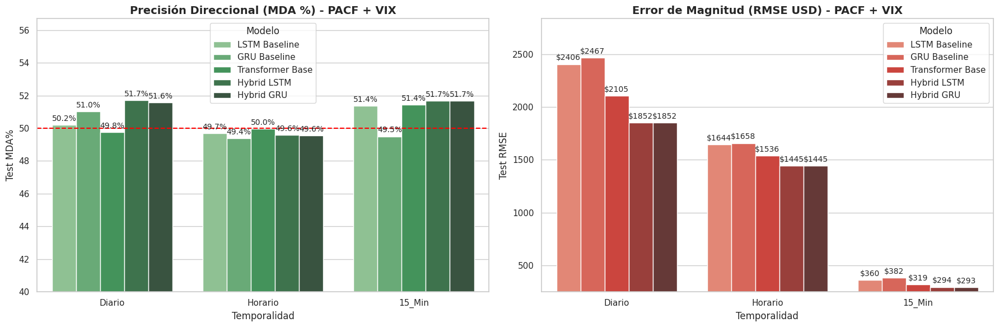


📸 GENERANDO PANELES DE MICRO-ZOOM PARA EL PAPER


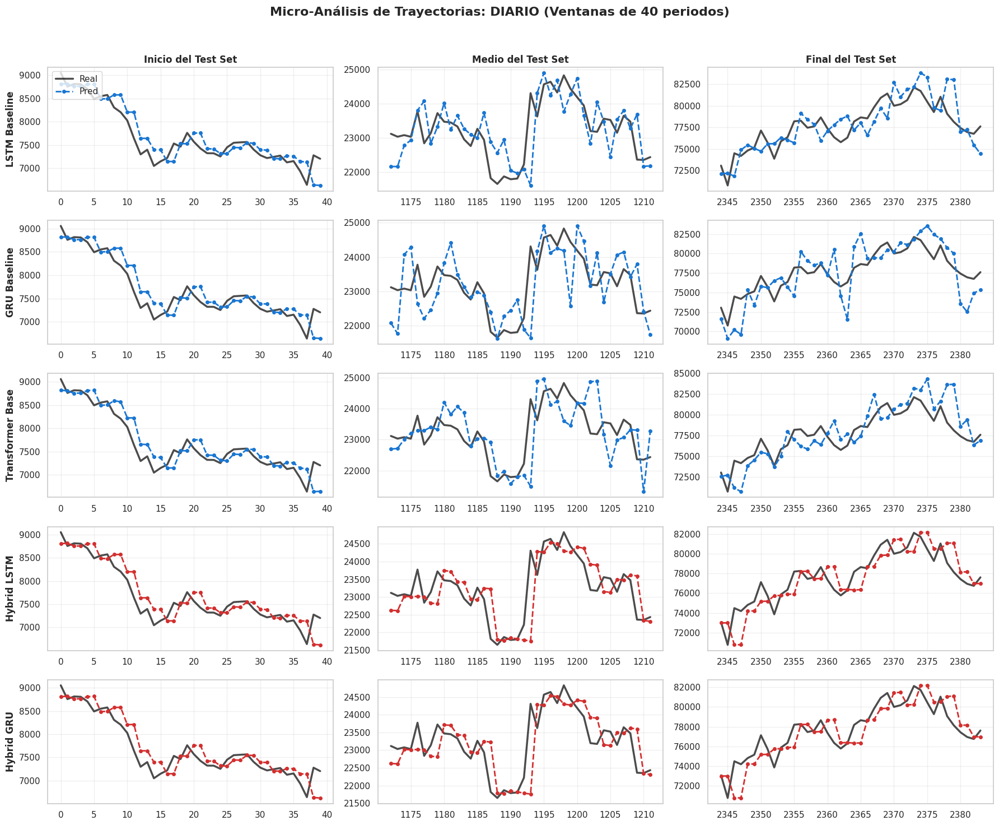

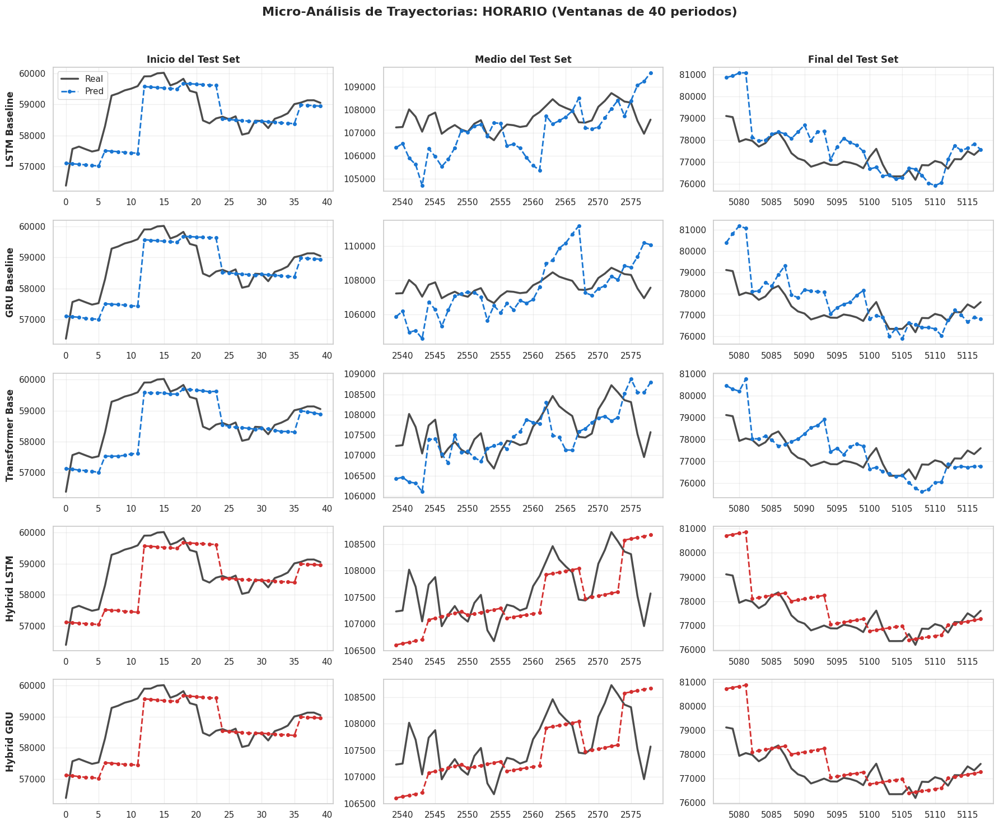

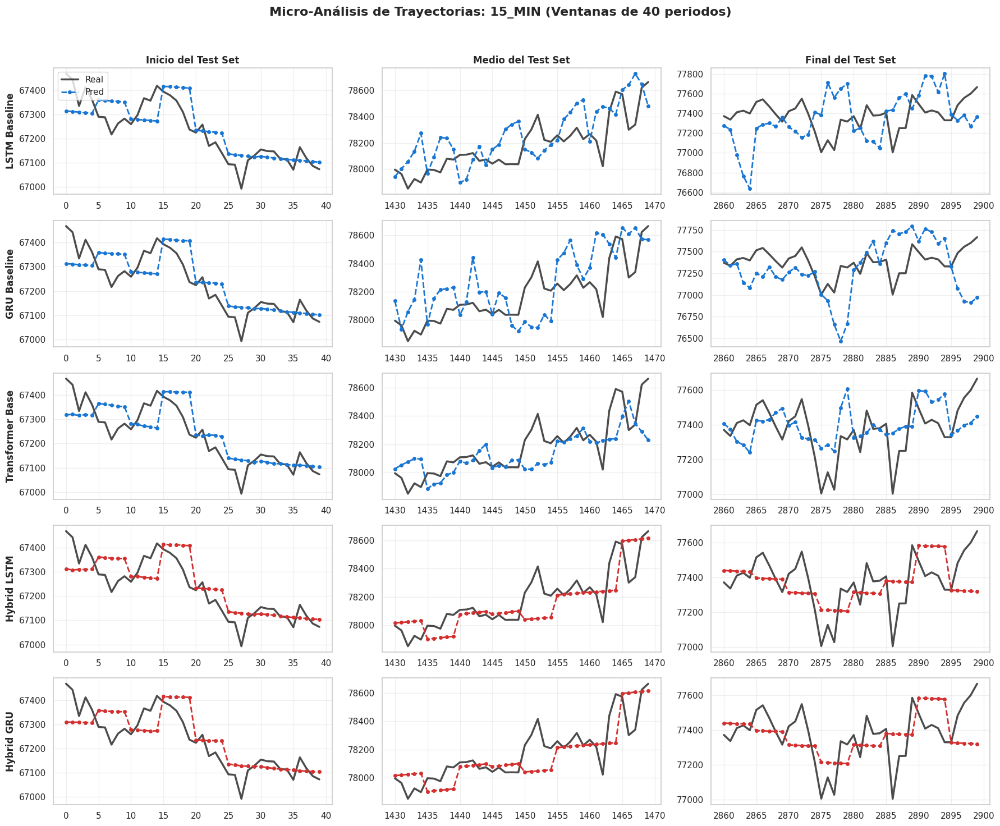

In [ ]:
#@title Experimento Definitivo: PACF Auto-Tuning + Dynamic VIX Loss + Micro-Zooms
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
from statsmodels.tsa.stattools import pacf
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display

print("🚀 INICIANDO EXPERIMENTO DEFINITIVO: PACF Auto-Tuning + Dynamic VIX Loss...")

# =====================================================================
# 1. AUTOTUNING (BOX-JENKINS)
# =====================================================================
def calcular_ventanas_optimas(df, nombre, max_pred=7, max_seq=90):
    precios = df['Target_BTC'].dropna()
    log_ret = np.log(precios / precios.shift(1)).replace([np.inf, -np.inf], np.nan).dropna()
    volatilidad = log_ret ** 2

    umbral_ret = 1.96 / np.sqrt(len(log_ret))
    umbral_vol = 1.96 / np.sqrt(len(volatilidad))

    pacf_r = pacf(log_ret, nlags=max_pred)
    lags_sig_r = np.where(np.abs(pacf_r[1:]) > umbral_ret)[0] + 1
    opt_pred_len = int(lags_sig_r[-1]) if len(lags_sig_r) > 0 else 1

    pacf_v = pacf(volatilidad, nlags=max_seq)
    lags_sig_v = np.where(np.abs(pacf_v[1:]) > umbral_vol)[0] + 1
    opt_seq_len = int(lags_sig_v[-1]) if len(lags_sig_v) > 0 else 10

    print(f"   [{nombre}] -> Contexto (seq_len): {opt_seq_len} | Horizonte (pred_len): {opt_pred_len}")
    return opt_seq_len, opt_pred_len

parametros_optimos = {}
datasets_raw = {'Diario': df_diario_ext, 'Horario': df_horario_ext, '15_Min': df_15m_ext}

print("\n📊 1. Extrayendo memoria estadística (PACF)...")
for nombre_ds, df in datasets_raw.items():
    s_len, p_len = calcular_ventanas_optimas(df, nombre_ds)
    parametros_optimos[nombre_ds] = {'seq_len': s_len, 'pred_len': p_len}

# =====================================================================
# 2. PÉRDIDA DINÁMICA (VIX) Y MOTOR WALK-FORWARD
# =====================================================================
# =====================================================================
# 2. PÉRDIDA DINÁMICA (VIX) Y MOTOR WALK-FORWARD
# =====================================================================
class DynamicVIXLoss(nn.Module):
    def __init__(self, vix_col_idx, base_lambda=0.1, max_lambda=1.5, delta=1.0):
        super().__init__()
        self.huber = nn.HuberLoss(delta=delta)
        self.vix_col_idx = vix_col_idx
        self.base_lam = base_lambda
        self.max_lam = max_lambda

    def forward(self, y_pred, y_true, x_input):
        # 1. Aseguramos que siempre sean 2D: (Batch, Pred_len) sin importar si Pred_len es 1 o 5
        if y_pred.dim() == 1: y_pred = y_pred.unsqueeze(1)
        if y_true.dim() == 1: y_true = y_true.unsqueeze(1)

        loss_mag = self.huber(y_pred, y_true)

        # 2. Penalización Direccional
        signo_real = torch.sign(y_true)
        penalizacion = -(y_pred * signo_real)
        loss_dir_raw = torch.relu(penalizacion) # Shape será (64, pred_len)

        # 3. Extracción y Normalización del VIX
        vix_t = x_input[:, -1, self.vix_col_idx] # Shape es (64,)
        vmin, vmax = vix_t.min(), vix_t.max()
        vix_norm = (vix_t - vmin) / (vmax - vmin + 1e-8)
        dyn_lam = self.base_lam + vix_norm * (self.max_lam - self.base_lam) # Shape es (64,)

        # 🌟 LA MAGIA DE LA CORRECCIÓN: Convertimos (64,) a (64, 1)
        # Esto permite que PyTorch lo multiplique automáticamente por la matriz (64, pred_len)
        dyn_lam = dyn_lam.unsqueeze(1)

        loss_dir = (dyn_lam * loss_dir_raw).mean()
        return loss_mag + loss_dir

# (Deja el resto del código wf_eval_vix_dynamic exactamente igual)

def wf_eval_vix_dynamic(modelo, data_dict, vix_col_idx, seq_len, pred_len, warmup_size=730):
    features_raw, target_raw, precios, cols = data_dict['features_raw'], data_dict['target_raw'], data_dict['precios_absolutos'], data_dict['feature_cols']
    N = len(features_raw)

    optimizer = torch.optim.Adam(modelo.parameters(), lr=0.001, weight_decay=1e-4)
    criterion = DynamicVIXLoss(vix_col_idx=vix_col_idx, base_lambda=0.1, max_lambda=1.5, delta=1.0)

    all_reals, all_preds = [], []
    is_warmup = True

    idx_std = [i for i, c in enumerate(cols) if c in cols_log_return + cols_volume + cols_diff_std]
    idx_rob = [i for i, c in enumerate(cols) if c in cols_pct_robust + cols_diff_robust]
    idx_mm  = [i for i, c in enumerate(cols) if i not in idx_std + idx_rob]

    for t in range(warmup_size, N - pred_len + 1, pred_len):
        train_F, train_T = features_raw[t - warmup_size : t], target_raw[t - warmup_size : t]

        sc_std, sc_rob, sc_mm, scaler_t = StandardScaler(), RobustScaler(), MinMaxScaler((-1, 1)), StandardScaler()
        train_F_sc = np.zeros_like(train_F)
        if idx_std: train_F_sc[:, idx_std] = sc_std.fit_transform(train_F[:, idx_std])
        if idx_rob: train_F_sc[:, idx_rob] = sc_rob.fit_transform(train_F[:, idx_rob])
        if idx_mm:  train_F_sc[:, idx_mm]  = sc_mm.fit_transform(train_F[:, idx_mm])
        train_T_sc = scaler_t.fit_transform(train_T.reshape(-1, 1)).flatten()

        X_tr, y_tr = create_sequences(train_F_sc, train_T_sc, seq_length=seq_len, pred_length=pred_len)
        loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)

        test_F_raw = features_raw[t - seq_len : t]
        test_F_sc  = np.zeros_like(test_F_raw)
        if idx_std: test_F_sc[:, idx_std] = sc_std.transform(test_F_raw[:, idx_std])
        if idx_rob: test_F_sc[:, idx_rob] = sc_rob.transform(test_F_raw[:, idx_rob])
        if idx_mm:  test_F_sc[:, idx_mm]  = sc_mm.transform(test_F_raw[:, idx_mm])

        x_infer = torch.tensor(test_F_sc, dtype=torch.float32).unsqueeze(0).to(device)
        real_prices = precios[t : t + pred_len]
        P_t = precios[t - 1]

        epochs = 15 if is_warmup else 2
        for _ in range(epochs):
            modelo.train()
            for xb, yb in loader:
                xb, yb = xb.to(device), yb.to(device)
                optimizer.zero_grad()
                loss = criterion(modelo(xb), yb, xb)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(modelo.parameters(), 1.0)
                optimizer.step()

        modelo.eval()
        with torch.no_grad():
            p_sc = modelo(x_infer).cpu().numpy()[0]
            p_log_ret = scaler_t.inverse_transform(p_sc.reshape(-1, 1)).flatten()
            pred_usd = P_t * np.exp(np.cumsum(p_log_ret))

        all_preds.extend(pred_usd)
        all_reals.extend(real_prices)
        is_warmup = False

    return calc_metrics(all_reals, all_preds), all_reals, all_preds

# =====================================================================
# 3. EJECUCIÓN DEL ENTRENAMIENTO MULTIMODELO
# =====================================================================
print("\n📊 2. Entrenando Modelos con VIX Loss + Autotuning PACF...")
resultados_finales = []
trayectorias_finales = {}

for nombre_ds, df_raw in datasets_raw.items():
    print(f"\n{'='*70}\n⌛ Procesando Temporalidad: {nombre_ds}")
    s_len, p_len = parametros_optimos[nombre_ds]['seq_len'], parametros_optimos[nombre_ds]['pred_len']
    print(f"   ⚙️  Inyectando: seq_len={s_len} | pred_len={p_len}")

    # Forzar inclusión del VIX
    feats_con_vix = list(dict.fromkeys(top_features + ['Sentiment_VIX']))
    df_filtrado = df_raw[[c for c in feats_con_vix if c in df_raw.columns] + ['Target_BTC']].copy()
    data_prep = preparacion_datos_base(df_filtrado, nombre_ds)
    cols = data_prep['feature_cols']
    input_dim = data_prep['features_raw'].shape[1]

    if 'Sentiment_VIX' in cols:
        vix_idx = cols.index('Sentiment_VIX')
    else:
        print(f"   ❌ VIX no disponible en {nombre_ds}. Saltando.")
        continue

    modelos_instancias = {
        'LSTM Baseline':    Baseline_LSTM(input_dim, 32, pred_length=p_len),
        'GRU Baseline':     Baseline_GRU(input_dim, 32, pred_length=p_len),
        'Transformer Base': Baseline_Transformer(input_dim, 32, pred_length=p_len),
        'Hybrid LSTM':      Hybrid_LSTM_Transformer(input_dim, d_model=32, num_heads=4, hidden_dim_lstm=64, num_layers_lstm=2, pred_len=p_len),
        'Hybrid GRU':       Hybrid_GRU_Transformer(input_dim, d_model=32, num_heads=4, hidden_dim_gru=64, num_layers_gru=2, pred_len=p_len)
    }

    trayectorias_finales[nombre_ds] = {}

    for nombre_mod, modelo in modelos_instancias.items():
        print(f"   🧠 Evaluando {nombre_mod}...")
        modelo = modelo.to(device)

        met, reales, preds = wf_eval_vix_dynamic(
            modelo, data_prep, vix_idx, seq_len=s_len, pred_len=p_len, warmup_size=730
        )

        resultados_finales.append({
            'Temporalidad': nombre_ds, 'Modelo': nombre_mod,
            'Test RMSE': met['RMSE'], 'Test MDA%': met['MDA (%)']
        })
        trayectorias_finales[nombre_ds][nombre_mod] = (np.array(reales), np.array(preds))

df_res_final = pd.DataFrame(resultados_finales)

# =====================================================================
# 4. TABLA Y BARPLOTS
# =====================================================================
print("\n" + "="*60)
print("📊 RESULTADOS: PACF + DYNAMIC VIX LOSS")
print("="*60)
display(df_res_final.sort_values(by=['Temporalidad', 'Test MDA%'], ascending=[True, False]))

sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.barplot(data=df_res_final, x='Temporalidad', y='Test MDA%', hue='Modelo', ax=axes[0], palette="Greens_d")
axes[0].set_title('Precisión Direccional (MDA %) - PACF + VIX', fontweight='bold', fontsize=14)
axes[0].axhline(50, color='red', linestyle='--')
axes[0].set_ylim(40, df_res_final['Test MDA%'].max() + 5)
for c in axes[0].containers: axes[0].bar_label(c, fmt='%.1f%%', padding=3, fontsize=10)

sns.barplot(data=df_res_final, x='Temporalidad', y='Test RMSE', hue='Modelo', ax=axes[1], palette="Reds_d")
axes[1].set_title('Error de Magnitud (RMSE USD) - PACF + VIX', fontweight='bold', fontsize=14)
axes[1].set_ylim(df_res_final['Test RMSE'].min() * 0.85, df_res_final['Test RMSE'].max() * 1.15)
for c in axes[1].containers: axes[1].bar_label(c, fmt='$%.0f', padding=3, fontsize=10)

plt.tight_layout()
plt.show()

# =====================================================================
# 5. MICRO-ZOOMS (CAPTURAS DE SECUENCIAS AISLADAS)
# =====================================================================
print("\n" + "="*60)
print("📸 GENERANDO PANELES DE MICRO-ZOOM PARA EL PAPER")
print("="*60)

# Cuántos datos queremos ver en cada "fotografía" (zoom window)
W = 40

for nombre_ds, modelos_tray in trayectorias_finales.items():
    # Preparamos una matriz de N_Modelos (filas) x 3 Snapshots (columnas)
    fig, axes = plt.subplots(len(modelos_tray), 3, figsize=(18, 3 * len(modelos_tray)), sharex=False)

    for row_idx, (nombre_mod, (reales, preds)) in enumerate(modelos_tray.items()):
        L = len(reales)

        # 3 Zonas Temporales (Inicio, Medio, Final del Test Set)
        zonas = [
            (0, min(W, L)),                                # Snapshot 1: Primeros W días
            (L // 2 - W // 2, L // 2 + W // 2),            # Snapshot 2: W días en el medio
            (L - W, L)                                     # Snapshot 3: Últimos W días
        ]

        for col_idx, (start, end) in enumerate(zonas):
            ax = axes[row_idx, col_idx]

            # Graficar Real vs Predicción para ese micro-intervalo
            ax.plot(range(start, end), reales[start:end], color='black', linewidth=2.5, alpha=0.7, label='Real')

            color_pred = '#D32F2F' if 'Hybrid' in nombre_mod else '#1976D2'
            ax.plot(range(start, end), preds[start:end], color=color_pred, linewidth=2, linestyle='--', marker='o', markersize=4, label='Pred')

            # Formato y Leyendas
            if col_idx == 0:
                ax.set_ylabel(nombre_mod, fontweight='bold', fontsize=12)
            if row_idx == 0:
                titulos_cols = ['Inicio del Test Set', 'Medio del Test Set', 'Final del Test Set']
                ax.set_title(titulos_cols[col_idx], fontweight='bold', fontsize=12)

            ax.grid(True, alpha=0.3)
            if row_idx == 0 and col_idx == 0:
                ax.legend(loc='upper left')

    plt.suptitle(f'Micro-Análisis de Trayectorias: {nombre_ds.upper()} (Ventanas de {W} periodos)', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

🚀 INICIANDO EXPERIMENTO DEFINITIVO: PACF Context + VIX Loss + Pred_len=1...

📊 1. Extrayendo memoria de volatilidad (PACF) para el Contexto...
   [Diario] -> Contexto (seq_len): 48 | Horizonte (pred_len): 1
   [Horario] -> Contexto (seq_len): 11 | Horizonte (pred_len): 1
   [15_Min] -> Contexto (seq_len): 58 | Horizonte (pred_len): 1

📊 2. Entrenando Modelos con VIX Loss + PACF Context (pred_len=1)...

⌛ Procesando Temporalidad: Diario
   ⚙️  Inyectando: seq_len=48 (PACF) | pred_len=1 (Fixed)

[Diario] Shape inicial: (3115, 13)
[Diario] Shape final tras limpieza: (3114, 13)
[Diario] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
   🧠 Evaluando GRU Baseline...
   🧠 Evaluando Transformer Base...
   🧠 Evaluando Hybrid LSTM...
   🧠 Evaluando Hybrid GRU...

⌛ Procesando Temporalidad: Horario
   ⚙️  Inyectando: seq_len=11 (PACF) | pred_len=1 (Fixed)

[Horario] Shape inicial: (15335, 13)
[Horario] Shape final tras limpieza: (5849, 13)
[Horario] Features seleccionadas: 10
   🧠 Eval

,Temporalidad,Modelo,Test RMSE,Test MDA%
13,15_Min,Hybrid LSTM,182.311681,51.396070
14,15_Min,Hybrid GRU,181.601937,50.982420
12,15_Min,Transformer Base,188.763354,50.741124
10,15_Min,LSTM Baseline,208.071255,50.293002
11,15_Min,GRU Baseline,219.768759,49.500172
3,Diario,Hybrid LSTM,1632.464098,51.070080
2,Diario,Transformer Base,1711.257299,50.608477
4,Diario,Hybrid GRU,1664.207784,50.608477
0,Diario,LSTM Baseline,2054.796508,49.937054
1,Diario,GRU Baseline,2046.657887,49.517415


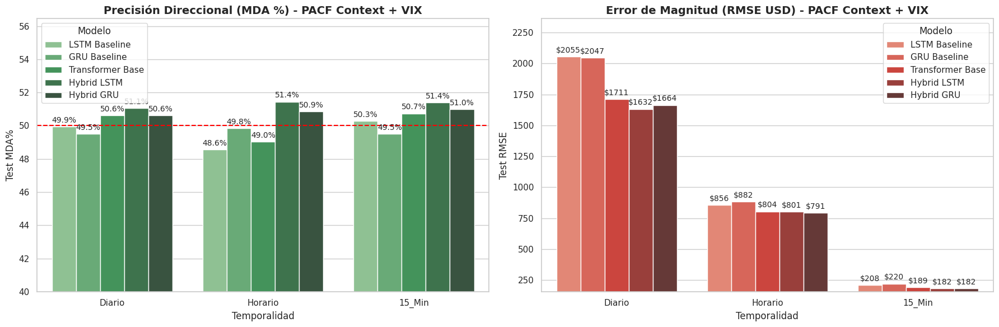


📸 GENERANDO PANELES DE MICRO-ZOOM (PRONÓSTICO 1-A-1)


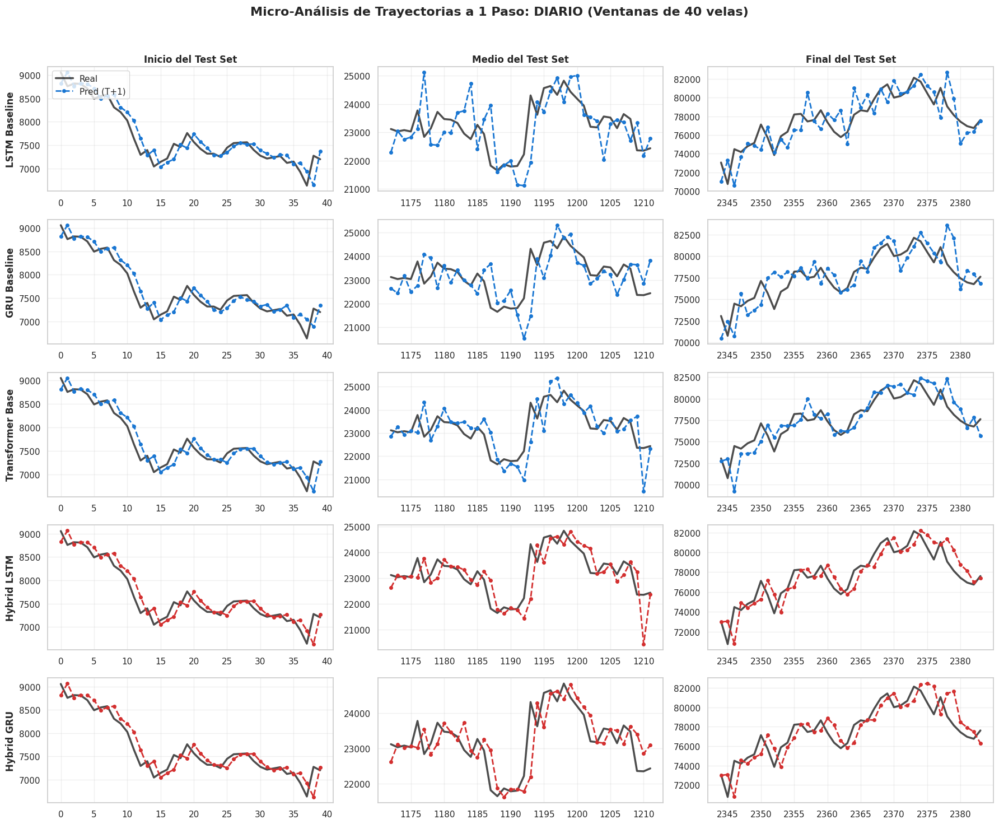

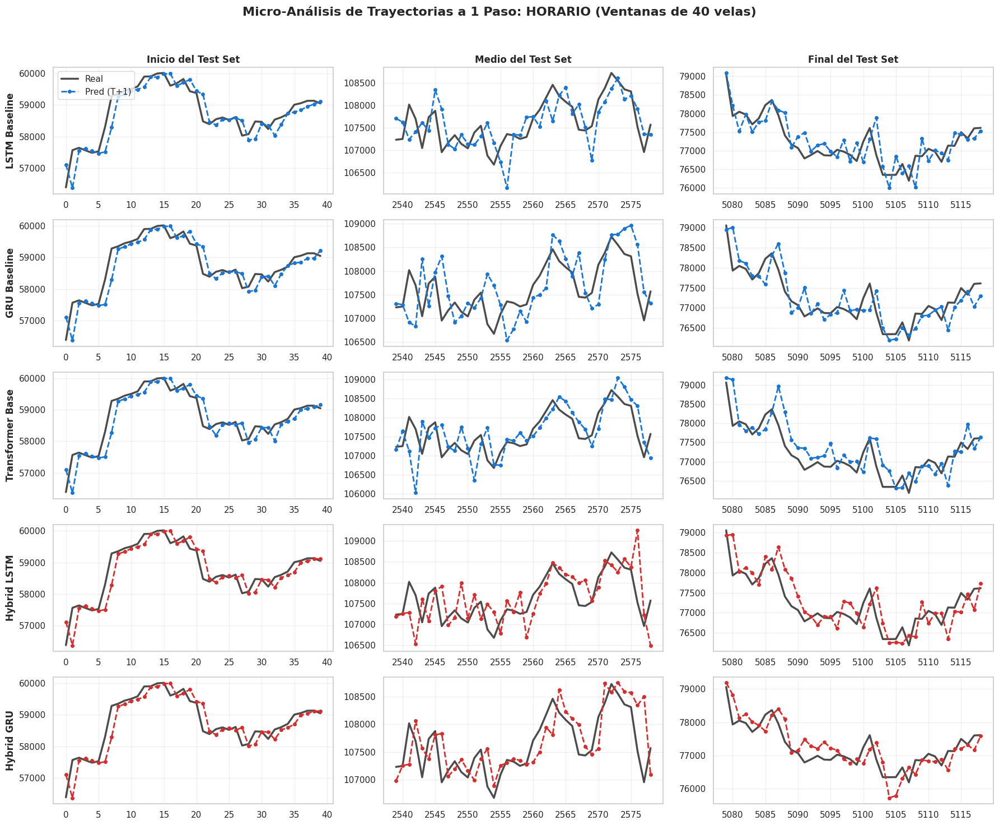

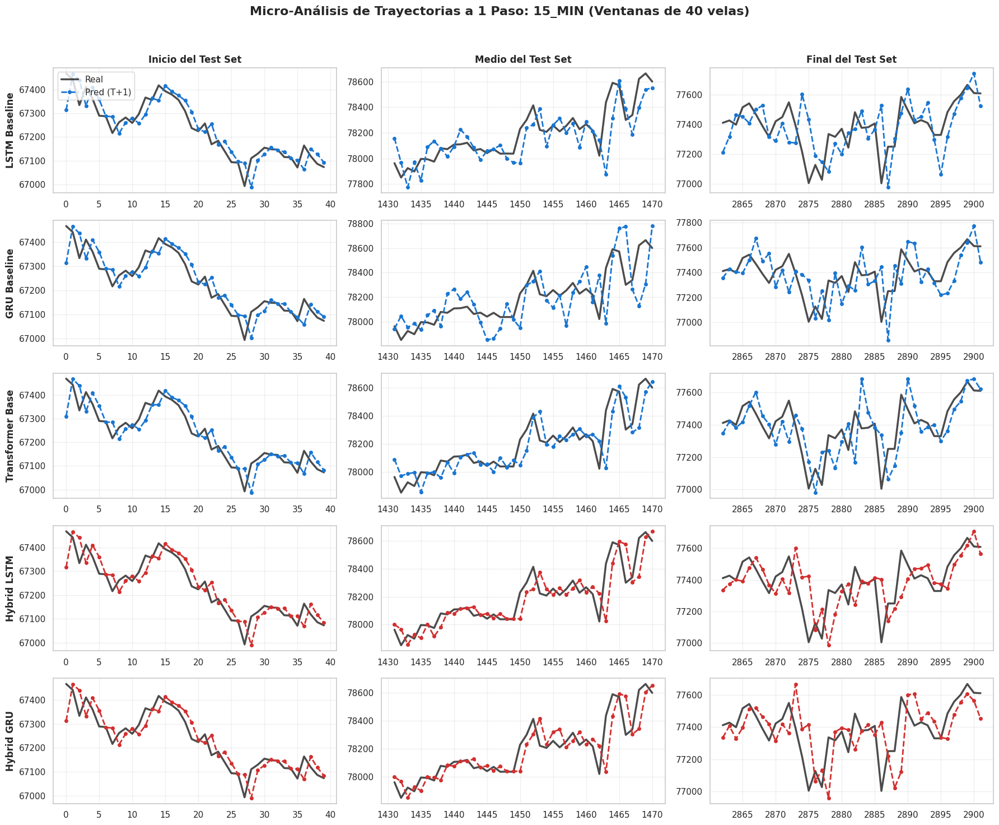

In [ ]:
#@title Experimento Definitivo: PACF Auto-Tuning (Contexto) + VIX Loss (pred_len=1)
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
from statsmodels.tsa.stattools import pacf
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display

print("🚀 INICIANDO EXPERIMENTO DEFINITIVO: PACF Context + VIX Loss + Pred_len=1...")

# =====================================================================
# 1. AUTOTUNING (BOX-JENKINS) - SOLO PARA SEQ_LEN
# =====================================================================
def calcular_ventanas_optimas(df, nombre, max_seq=90):
    precios = df['Target_BTC'].dropna()
    log_ret = np.log(precios / precios.shift(1)).replace([np.inf, -np.inf], np.nan).dropna()
    volatilidad = log_ret ** 2

    umbral_vol = 1.96 / np.sqrt(len(volatilidad))

    pacf_v = pacf(volatilidad, nlags=max_seq)
    lags_sig_v = np.where(np.abs(pacf_v[1:]) > umbral_vol)[0] + 1
    opt_seq_len = int(lags_sig_v[-1]) if len(lags_sig_v) > 0 else 10

    # FORZAMOS PRED_LEN A 1 (Next-Candle Prediction)
    opt_pred_len = 1

    print(f"   [{nombre}] -> Contexto (seq_len): {opt_seq_len} | Horizonte (pred_len): {opt_pred_len}")
    return opt_seq_len, opt_pred_len

parametros_optimos = {}
datasets_raw = {'Diario': df_diario_ext, 'Horario': df_horario_ext, '15_Min': df_15m_ext}

print("\n📊 1. Extrayendo memoria de volatilidad (PACF) para el Contexto...")
for nombre_ds, df in datasets_raw.items():
    s_len, p_len = calcular_ventanas_optimas(df, nombre_ds)
    parametros_optimos[nombre_ds] = {'seq_len': s_len, 'pred_len': p_len}

# =====================================================================
# 2. PÉRDIDA DINÁMICA (VIX) Y MOTOR WALK-FORWARD
# =====================================================================
class DynamicVIXLoss(nn.Module):
    def __init__(self, vix_col_idx, base_lambda=0.1, max_lambda=1.5, delta=1.0):
        super().__init__()
        self.huber = nn.HuberLoss(delta=delta)
        self.vix_col_idx = vix_col_idx
        self.base_lam = base_lambda
        self.max_lam = max_lambda

    def forward(self, y_pred, y_true, x_input):
        # Aseguramos que siempre sean 2D: (Batch, Pred_len)
        if y_pred.dim() == 1: y_pred = y_pred.unsqueeze(1)
        if y_true.dim() == 1: y_true = y_true.unsqueeze(1)

        loss_mag = self.huber(y_pred, y_true)

        # Penalización Direccional
        signo_real = torch.sign(y_true)
        penalizacion = -(y_pred * signo_real)
        loss_dir_raw = torch.relu(penalizacion)

        # Extracción y Normalización del VIX
        vix_t = x_input[:, -1, self.vix_col_idx]
        vmin, vmax = vix_t.min(), vix_t.max()
        vix_norm = (vix_t - vmin) / (vmax - vmin + 1e-8)
        dyn_lam = self.base_lam + vix_norm * (self.max_lam - self.base_lam)

        # Broadcasting para multiplicar por (Batch, 1)
        dyn_lam = dyn_lam.unsqueeze(1)

        loss_dir = (dyn_lam * loss_dir_raw).mean()
        return loss_mag + loss_dir

def wf_eval_vix_dynamic(modelo, data_dict, vix_col_idx, seq_len, pred_len, warmup_size=730):
    features_raw, target_raw, precios, cols = data_dict['features_raw'], data_dict['target_raw'], data_dict['precios_absolutos'], data_dict['feature_cols']
    N = len(features_raw)

    optimizer = torch.optim.Adam(modelo.parameters(), lr=0.001, weight_decay=1e-4)
    criterion = DynamicVIXLoss(vix_col_idx=vix_col_idx, base_lambda=0.1, max_lambda=1.5, delta=1.0)

    all_reals, all_preds = [], []
    is_warmup = True

    idx_std = [i for i, c in enumerate(cols) if c in cols_log_return + cols_volume + cols_diff_std]
    idx_rob = [i for i, c in enumerate(cols) if c in cols_pct_robust + cols_diff_robust]
    idx_mm  = [i for i, c in enumerate(cols) if i not in idx_std + idx_rob]

    for t in range(warmup_size, N - pred_len + 1, pred_len):
        train_F, train_T = features_raw[t - warmup_size : t], target_raw[t - warmup_size : t]

        sc_std, sc_rob, sc_mm, scaler_t = StandardScaler(), RobustScaler(), MinMaxScaler((-1, 1)), StandardScaler()
        train_F_sc = np.zeros_like(train_F)
        if idx_std: train_F_sc[:, idx_std] = sc_std.fit_transform(train_F[:, idx_std])
        if idx_rob: train_F_sc[:, idx_rob] = sc_rob.fit_transform(train_F[:, idx_rob])
        if idx_mm:  train_F_sc[:, idx_mm]  = sc_mm.fit_transform(train_F[:, idx_mm])
        train_T_sc = scaler_t.fit_transform(train_T.reshape(-1, 1)).flatten()

        X_tr, y_tr = create_sequences(train_F_sc, train_T_sc, seq_length=seq_len, pred_length=pred_len)
        loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)

        test_F_raw = features_raw[t - seq_len : t]
        test_F_sc  = np.zeros_like(test_F_raw)
        if idx_std: test_F_sc[:, idx_std] = sc_std.transform(test_F_raw[:, idx_std])
        if idx_rob: test_F_sc[:, idx_rob] = sc_rob.transform(test_F_raw[:, idx_rob])
        if idx_mm:  test_F_sc[:, idx_mm]  = sc_mm.transform(test_F_raw[:, idx_mm])

        x_infer = torch.tensor(test_F_sc, dtype=torch.float32).unsqueeze(0).to(device)
        real_prices = precios[t : t + pred_len]
        P_t = precios[t - 1]

        epochs = 15 if is_warmup else 2
        for _ in range(epochs):
            modelo.train()
            for xb, yb in loader:
                xb, yb = xb.to(device), yb.to(device)
                optimizer.zero_grad()
                loss = criterion(modelo(xb), yb, xb)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(modelo.parameters(), 1.0)
                optimizer.step()

        modelo.eval()
        with torch.no_grad():
            p_sc = modelo(x_infer).cpu().numpy()[0]
            p_log_ret = scaler_t.inverse_transform(p_sc.reshape(-1, 1)).flatten()
            pred_usd = P_t * np.exp(np.cumsum(p_log_ret))

        all_preds.extend(pred_usd)
        all_reals.extend(real_prices)
        is_warmup = False

    return calc_metrics(all_reals, all_preds), all_reals, all_preds

# =====================================================================
# 3. EJECUCIÓN DEL ENTRENAMIENTO MULTIMODELO
# =====================================================================
print("\n📊 2. Entrenando Modelos con VIX Loss + PACF Context (pred_len=1)...")
resultados_finales = []
trayectorias_finales = {}

for nombre_ds, df_raw in datasets_raw.items():
    print(f"\n{'='*70}\n⌛ Procesando Temporalidad: {nombre_ds}")
    s_len, p_len = parametros_optimos[nombre_ds]['seq_len'], parametros_optimos[nombre_ds]['pred_len']
    print(f"   ⚙️  Inyectando: seq_len={s_len} (PACF) | pred_len={p_len} (Fixed)")

    feats_con_vix = list(dict.fromkeys(top_features + ['Sentiment_VIX']))
    df_filtrado = df_raw[[c for c in feats_con_vix if c in df_raw.columns] + ['Target_BTC']].copy()
    data_prep = preparacion_datos_base(df_filtrado, nombre_ds)
    cols = data_prep['feature_cols']
    input_dim = data_prep['features_raw'].shape[1]

    if 'Sentiment_VIX' in cols:
        vix_idx = cols.index('Sentiment_VIX')
    else:
        print(f"   ❌ VIX no disponible en {nombre_ds}. Saltando.")
        continue

    modelos_instancias = {
        'LSTM Baseline':    Baseline_LSTM(input_dim, 32, pred_length=p_len),
        'GRU Baseline':     Baseline_GRU(input_dim, 32, pred_length=p_len),
        'Transformer Base': Baseline_Transformer(input_dim, 32, pred_length=p_len),
        'Hybrid LSTM':      Hybrid_LSTM_Transformer(input_dim, d_model=32, num_heads=4, hidden_dim_lstm=64, num_layers_lstm=2, pred_len=p_len),
        'Hybrid GRU':       Hybrid_GRU_Transformer(input_dim, d_model=32, num_heads=4, hidden_dim_gru=64, num_layers_gru=2, pred_len=p_len)
    }

    trayectorias_finales[nombre_ds] = {}

    for nombre_mod, modelo in modelos_instancias.items():
        print(f"   🧠 Evaluando {nombre_mod}...")
        modelo = modelo.to(device)

        met, reales, preds = wf_eval_vix_dynamic(
            modelo, data_prep, vix_idx, seq_len=s_len, pred_len=p_len, warmup_size=730
        )

        resultados_finales.append({
            'Temporalidad': nombre_ds, 'Modelo': nombre_mod,
            'Test RMSE': met['RMSE'], 'Test MDA%': met['MDA (%)']
        })
        trayectorias_finales[nombre_ds][nombre_mod] = (np.array(reales), np.array(preds))

df_res_final = pd.DataFrame(resultados_finales)

# =====================================================================
# 4. TABLA Y BARPLOTS
# =====================================================================
print("\n" + "="*60)
print("📊 RESULTADOS: PACF CONTEXT + DYNAMIC VIX LOSS (PRED_LEN=1)")
print("="*60)
display(df_res_final.sort_values(by=['Temporalidad', 'Test MDA%'], ascending=[True, False]))

sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.barplot(data=df_res_final, x='Temporalidad', y='Test MDA%', hue='Modelo', ax=axes[0], palette="Greens_d")
axes[0].set_title('Precisión Direccional (MDA %) - PACF Context + VIX', fontweight='bold', fontsize=14)
axes[0].axhline(50, color='red', linestyle='--', label='50% (Azar)')
axes[0].set_ylim(40, df_res_final['Test MDA%'].max() + 5)
for c in axes[0].containers: axes[0].bar_label(c, fmt='%.1f%%', padding=3, fontsize=10)

sns.barplot(data=df_res_final, x='Temporalidad', y='Test RMSE', hue='Modelo', ax=axes[1], palette="Reds_d")
axes[1].set_title('Error de Magnitud (RMSE USD) - PACF Context + VIX', fontweight='bold', fontsize=14)
axes[1].set_ylim(df_res_final['Test RMSE'].min() * 0.85, df_res_final['Test RMSE'].max() * 1.15)
for c in axes[1].containers: axes[1].bar_label(c, fmt='$%.0f', padding=3, fontsize=10)

plt.tight_layout()
plt.show()

# =====================================================================
# 5. MICRO-ZOOMS (CAPTURAS DE SECUENCIAS AISLADAS)
# =====================================================================
print("\n" + "="*60)
print("📸 GENERANDO PANELES DE MICRO-ZOOM (PRONÓSTICO 1-A-1)")
print("="*60)

W = 40

for nombre_ds, modelos_tray in trayectorias_finales.items():
    fig, axes = plt.subplots(len(modelos_tray), 3, figsize=(18, 3 * len(modelos_tray)), sharex=False)

    for row_idx, (nombre_mod, (reales, preds)) in enumerate(modelos_tray.items()):
        L = len(reales)

        zonas = [
            (0, min(W, L)),                                # Snapshot 1: Inicio
            (L // 2 - W // 2, L // 2 + W // 2),            # Snapshot 2: Medio
            (L - W, L)                                     # Snapshot 3: Final
        ]

        for col_idx, (start, end) in enumerate(zonas):
            ax = axes[row_idx, col_idx]

            ax.plot(range(start, end), reales[start:end], color='black', linewidth=2.5, alpha=0.7, label='Real')

            color_pred = '#D32F2F' if 'Hybrid' in nombre_mod else '#1976D2'
            ax.plot(range(start, end), preds[start:end], color=color_pred, linewidth=2, linestyle='--', marker='o', markersize=4, label='Pred (T+1)')

            if col_idx == 0:
                ax.set_ylabel(nombre_mod, fontweight='bold', fontsize=12)
            if row_idx == 0:
                titulos_cols = ['Inicio del Test Set', 'Medio del Test Set', 'Final del Test Set']
                ax.set_title(titulos_cols[col_idx], fontweight='bold', fontsize=12)

            ax.grid(True, alpha=0.3)
            if row_idx == 0 and col_idx == 0:
                ax.legend(loc='upper left')

    plt.suptitle(f'Micro-Análisis de Trayectorias a 1 Paso: {nombre_ds.upper()} (Ventanas de {W} velas)', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = 'Diario' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'Hybrid GRU'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para Diario usando Hybrid GRU...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - Diario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "83213.82,83672.35,85399.78,84312.84,85189.02,85286.80,88364.06,93247.37,94079.68,93823.55,95369.78,94794.00,94254.87,96352.82,94861.71,94686.52,96655.04,97070.30,96257.15,95672.77,95817.60,96640.45,98132.03,103759.18,103141.63,104893.51,104300.64,103644.72,104356

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = 'Horario' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'Hybrid GRU'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para Horario usando Hybrid GRU...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - Horario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "67133.69,67020.07,67257.79,67151.08,67199.40,67139.56,66781.43,67036.94,66880.70,67187.86,67525.99,68438.12,68898.00,69190.22,68804.88,69237.12,69030.93,68972.80,68948.54,68482.51,69077.01,69127.51,69741.24,69624.19,69584.23,69421.81,69428.27,69430.61,69214.70,

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = '15_Min' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'Hybrid GRU'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para 15_Min usando Hybrid GRU...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - 15_Min", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "81039.74,81328.96,81448.18,81501.89,81519.26,81834.90,81738.37,81494.67,81659.89,81687.00,81964.32,81841.20,81580.08,81592.18,81590.05,81351.32,81484.56,81442.81,81360.15,81274.81,81236.87,81401.23,81329.22,81377.91,81509.18,81435.65,81388.53,81440.31,81209.64,81

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = 'Diario' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'LSTM Baseline'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para Diario usando LSTM Baseline...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - Diario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "83637.46,85540.06,85394.33,83019.48,84033.85,84854.34,92848.99,92015.47,92501.17,93575.62,92886.25,94875.34,92916.79,93171.32,93203.44,96505.86,96784.31,94745.46,99042.69,93965.70,94018.89,95620.70,97943.00,104506.63,101495.48,103893.46,107503.42,100706.56,106

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = 'Horario' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'LSTM Baseline'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para Horario usando LSTM Baseline...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - Horario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "66911.89,66809.90,67407.55,67236.34,67489.63,67127.88,66639.03,66844.15,66935.00,67090.20,67497.77,68221.90,68503.36,69391.45,68966.47,69371.57,68802.49,68957.57,69121.20,69099.33,68921.79,69289.47,70196.96,69666.72,69492.92,69421.80,69058.63,69531.35,69156.

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = '15_Min' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'LSTM Baseline'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para 15_Min usando LSTM Baseline...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - 15_Min", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "81016.79,81407.62,81503.46,81514.83,81772.03,81987.35,81790.10,81745.87,81656.17,81631.39,82062.44,81705.10,81668.93,81485.59,81567.82,81260.50,81476.01,81557.19,81394.66,81227.36,81214.25,81490.59,81324.02,81429.41,81481.42,81291.41,81450.65,81443.34,81093.95

## 10.7 Experimento 7: Elaboracion con ETH y SOL e Importación de Modulos para Predicciones a TradingView

In [ ]:
# =====================================================================
# 1. AUTOTUNING (BOX-JENKINS) - SOLO PARA SEQ_LEN
# =====================================================================
def calcular_ventanas_optimas(df, nombre, max_seq=90):
    precios = df['Target_BTC'].dropna()
    log_ret = np.log(precios / precios.shift(1)).replace([np.inf, -np.inf], np.nan).dropna()
    volatilidad = log_ret ** 2

    umbral_vol = 1.96 / np.sqrt(len(volatilidad))

    pacf_v = pacf(volatilidad, nlags=max_seq)
    lags_sig_v = np.where(np.abs(pacf_v[1:]) > umbral_vol)[0] + 1
    opt_seq_len = int(lags_sig_v[-1]) if len(lags_sig_v) > 0 else 10

    # FORZAMOS PRED_LEN A 1 (Next-Candle Prediction)
    opt_pred_len = 1

    print(f"   [{nombre}] -> Contexto (seq_len): {opt_seq_len} | Horizonte (pred_len): {opt_pred_len}")
    return opt_seq_len, opt_pred_len

parametros_optimos = {}
datasets_raw = {'Diario': df_diario_ext, 'Horario': df_horario_ext, '15_Min': df_15m_ext}

print("\n📊 1. Extrayendo memoria de volatilidad (PACF) para el Contexto...")
for nombre_ds, df in datasets_raw.items():
    s_len, p_len = calcular_ventanas_optimas(df, nombre_ds)
    parametros_optimos[nombre_ds] = {'seq_len': s_len, 'pred_len': p_len}

# =====================================================================
# 2. PÉRDIDA DINÁMICA (VIX) Y MOTOR WALK-FORWARD
# =====================================================================
class DynamicVIXLoss(nn.Module):
    def __init__(self, vix_col_idx, base_lambda=0.1, max_lambda=1.5, delta=1.0):
        super().__init__()
        self.huber = nn.HuberLoss(delta=delta)
        self.vix_col_idx = vix_col_idx
        self.base_lam = base_lambda
        self.max_lam = max_lambda

    def forward(self, y_pred, y_true, x_input):
        # Aseguramos que siempre sean 2D: (Batch, Pred_len)
        if y_pred.dim() == 1: y_pred = y_pred.unsqueeze(1)
        if y_true.dim() == 1: y_true = y_true.unsqueeze(1)

        loss_mag = self.huber(y_pred, y_true)

        # Penalización Direccional
        signo_real = torch.sign(y_true)
        penalizacion = -(y_pred * signo_real)
        loss_dir_raw = torch.relu(penalizacion)

        # Extracción y Normalización del VIX
        vix_t = x_input[:, -1, self.vix_col_idx]
        vmin, vmax = vix_t.min(), vix_t.max()
        vix_norm = (vix_t - vmin) / (vmax - vmin + 1e-8)
        dyn_lam = self.base_lam + vix_norm * (self.max_lam - self.base_lam)

        # Broadcasting para multiplicar por (Batch, 1)
        dyn_lam = dyn_lam.unsqueeze(1)

        loss_dir = (dyn_lam * loss_dir_raw).mean()
        return loss_mag + loss_dir

def wf_eval_vix_dynamic(modelo, data_dict, vix_col_idx, seq_len, pred_len, warmup_size=730):
    features_raw, target_raw, precios, cols = data_dict['features_raw'], data_dict['target_raw'], data_dict['precios_absolutos'], data_dict['feature_cols']
    N = len(features_raw)

    optimizer = torch.optim.Adam(modelo.parameters(), lr=0.001, weight_decay=1e-4)
    criterion = DynamicVIXLoss(vix_col_idx=vix_col_idx, base_lambda=0.1, max_lambda=1.5, delta=1.0)

    all_reals, all_preds = [], []
    is_warmup = True

    idx_std = [i for i, c in enumerate(cols) if c in cols_log_return + cols_volume + cols_diff_std]
    idx_rob = [i for i, c in enumerate(cols) if c in cols_pct_robust + cols_diff_robust]
    idx_mm  = [i for i, c in enumerate(cols) if i not in idx_std + idx_rob]

    for t in range(warmup_size, N - pred_len + 1, pred_len):
        train_F, train_T = features_raw[t - warmup_size : t], target_raw[t - warmup_size : t]

        sc_std, sc_rob, sc_mm, scaler_t = StandardScaler(), RobustScaler(), MinMaxScaler((-1, 1)), StandardScaler()
        train_F_sc = np.zeros_like(train_F)
        if idx_std: train_F_sc[:, idx_std] = sc_std.fit_transform(train_F[:, idx_std])
        if idx_rob: train_F_sc[:, idx_rob] = sc_rob.fit_transform(train_F[:, idx_rob])
        if idx_mm:  train_F_sc[:, idx_mm]  = sc_mm.fit_transform(train_F[:, idx_mm])
        train_T_sc = scaler_t.fit_transform(train_T.reshape(-1, 1)).flatten()

        X_tr, y_tr = create_sequences(train_F_sc, train_T_sc, seq_length=seq_len, pred_length=pred_len)
        loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)

        test_F_raw = features_raw[t - seq_len : t]
        test_F_sc  = np.zeros_like(test_F_raw)
        if idx_std: test_F_sc[:, idx_std] = sc_std.transform(test_F_raw[:, idx_std])
        if idx_rob: test_F_sc[:, idx_rob] = sc_rob.transform(test_F_raw[:, idx_rob])
        if idx_mm:  test_F_sc[:, idx_mm]  = sc_mm.transform(test_F_raw[:, idx_mm])

        x_infer = torch.tensor(test_F_sc, dtype=torch.float32).unsqueeze(0).to(device)
        real_prices = precios[t : t + pred_len]
        P_t = precios[t - 1]

        epochs = 15 if is_warmup else 2
        for _ in range(epochs):
            modelo.train()
            for xb, yb in loader:
                xb, yb = xb.to(device), yb.to(device)
                optimizer.zero_grad()
                loss = criterion(modelo(xb), yb, xb)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(modelo.parameters(), 1.0)
                optimizer.step()

        modelo.eval()
        with torch.no_grad():
            p_sc = modelo(x_infer).cpu().numpy()[0]
            p_log_ret = scaler_t.inverse_transform(p_sc.reshape(-1, 1)).flatten()
            pred_usd = P_t * np.exp(np.cumsum(p_log_ret))

        all_preds.extend(pred_usd)
        all_reals.extend(real_prices)
        is_warmup = False

    return calc_metrics(all_reals, all_preds), all_reals, all_preds


📊 1. Extrayendo memoria de volatilidad (PACF) para el Contexto...
   [Diario] -> Contexto (seq_len): 48 | Horizonte (pred_len): 1
   [Horario] -> Contexto (seq_len): 11 | Horizonte (pred_len): 1
   [15_Min] -> Contexto (seq_len): 58 | Horizonte (pred_len): 1


🚀 INICIANDO EXPERIMENTO DE GENERALIZACIÓN: ETH & SOL (PACF + VIX + pred_len=1)...
📥 Descargando datos para ETH (ETH-USD)...
📥 Descargando datos para SOL (SOL-USD)...

📊 1. Extrayendo memoria de volatilidad (PACF) para ETH y SOL...
   [ETH] -> Contexto (PACF): 40 | Horizonte: 1
   [SOL] -> Contexto (PACF): 89 | Horizonte: 1

📊 2. Entrenando Modelos en Nuevos Activos (VIX Loss + pred_len=1)...

⌛ Procesando Activo: ETH

[ETH] Shape inicial: (2133, 13)
[ETH] Shape final tras limpieza: (2132, 13)
[ETH] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
   🧠 Evaluando GRU Baseline...
   🧠 Evaluando Transformer Base...
   🧠 Evaluando Hybrid LSTM...
   🧠 Evaluando Hybrid GRU...

⌛ Procesando Activo: SOL

[SOL] Shape inicial: (2034, 13)
[SOL] Shape final tras limpieza: (2033, 13)
[SOL] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
   🧠 Evaluando GRU Baseline...
   🧠 Evaluando Transformer Base...
   🧠 Evaluando Hybrid LSTM...
   🧠 Evaluando Hybrid GRU...

📊 RESULTADOS FINAL

,Activo,Modelo,Test RMSE,Test MDA%
3,ETH,Hybrid LSTM,107.589516,53.340883
4,ETH,Hybrid GRU,106.620472,53.001133
0,ETH,LSTM Baseline,140.984755,50.339751
1,ETH,GRU Baseline,140.825292,49.037373
2,ETH,Transformer Base,116.792588,47.395243
9,SOL,Hybrid GRU,6.193127,51.649670
5,SOL,LSTM Baseline,8.119291,50.569886
8,SOL,Hybrid LSTM,6.187073,50.389922
6,SOL,GRU Baseline,8.750627,50.089982
7,SOL,Transformer Base,6.607559,49.370126


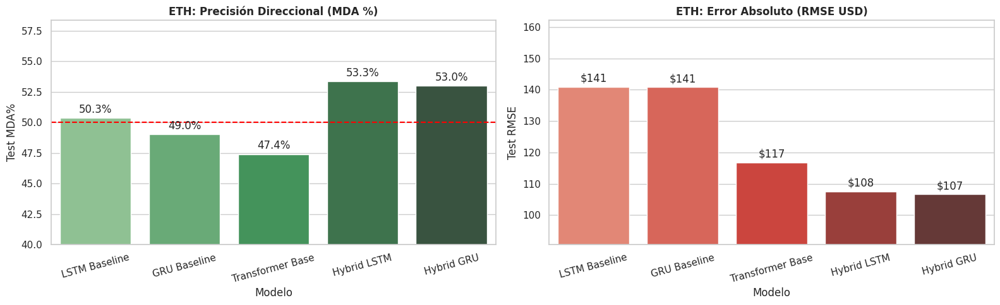

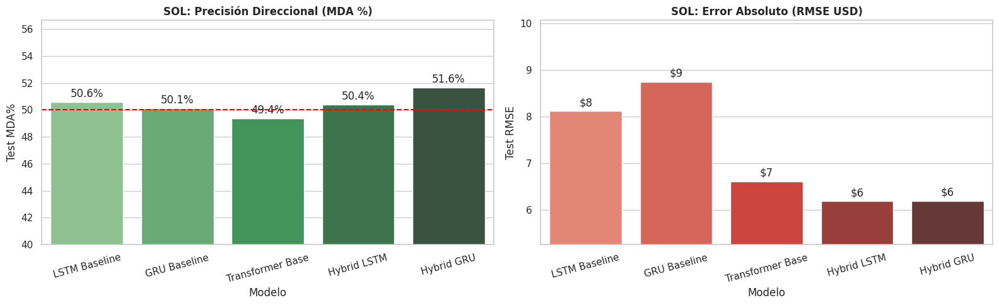


📸 Micro-Zoom para ETH (1-Step-Ahead)...


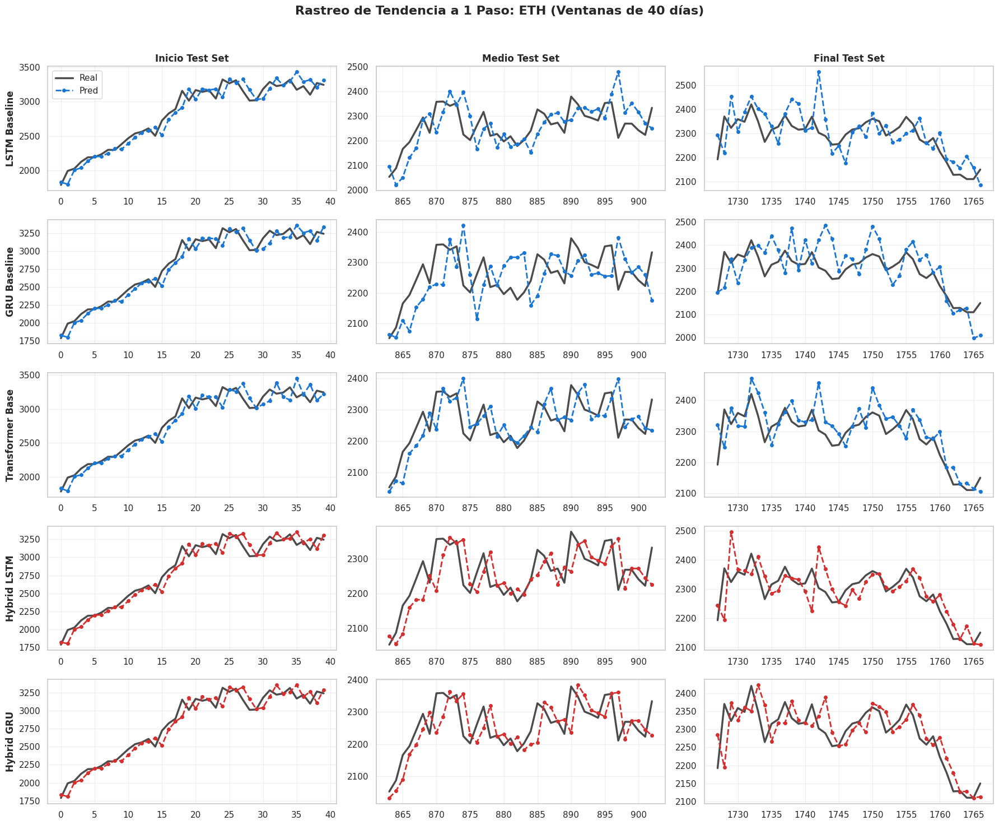


📸 Micro-Zoom para SOL (1-Step-Ahead)...


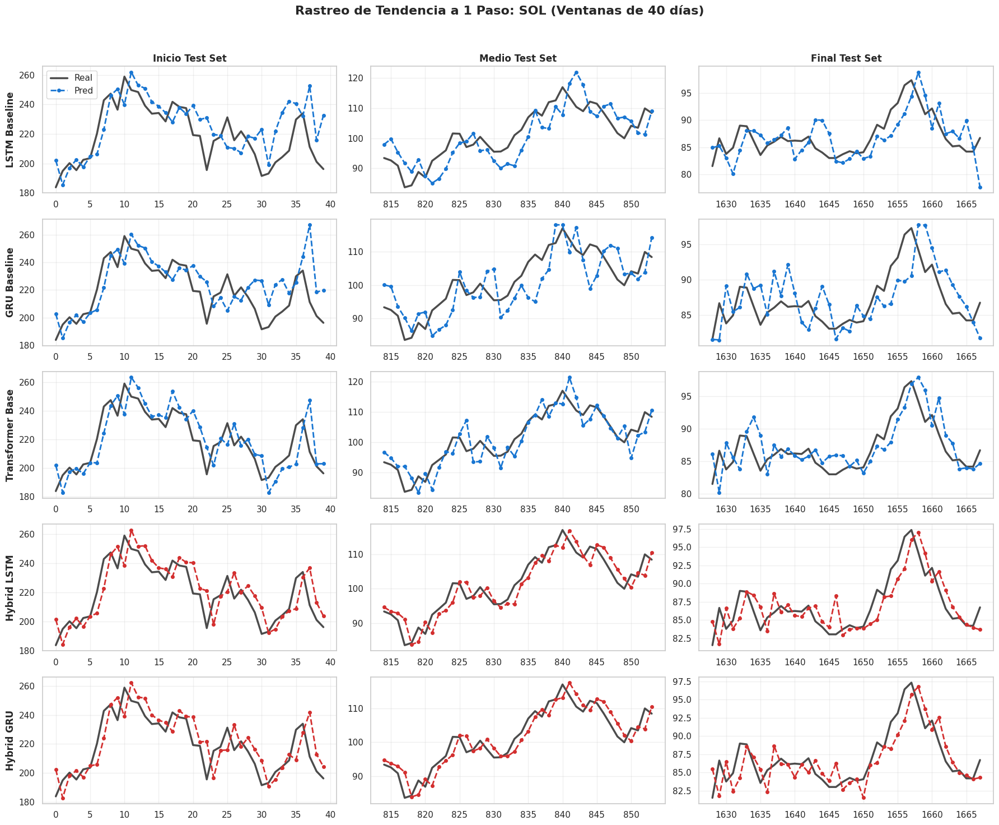

In [ ]:
#@title Experimento Definitivo en Nuevos Activos: ETH & SOL (PACF Context + VIX + pred_len=1)
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
import yfinance as yf
from statsmodels.tsa.stattools import pacf
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display

print("🚀 INICIANDO EXPERIMENTO DE GENERALIZACIÓN: ETH & SOL (PACF + VIX + pred_len=1)...")

# =====================================================================
# 1. DESCARGA Y PREPARACIÓN DE DATOS (ETH y SOL)
# =====================================================================
MACRO_TICKERS = {
    'Context_ETH': 'ETH-USD', 'Macro_SP500': '^GSPC', 'Macro_NASDAQ': '^IXIC',
    'Macro_DXY': 'DX-Y.NYB', 'Macro_US10Y': '^TNX', 'Sentiment_VIX': '^VIX',
    'Commodity_Gold': 'GC=F', 'Commodity_Oil': 'CL=F'
}
TICKERS_EXTRA = {'ETH': 'ETH-USD', 'SOL': 'SOL-USD'}

def descargar_dataset_activo(ticker_symbol, nombre_activo, start='2020-01-01'):
    print(f"📥 Descargando datos para {nombre_activo} ({ticker_symbol})...")
    df_main = yf.download(ticker_symbol, start=start, interval='1d', auto_adjust=True, progress=False)
    if isinstance(df_main.columns, pd.MultiIndex):
        df_main.columns = [col[0] for col in df_main.columns]
    df_main = df_main[['Open', 'High', 'Low', 'Close', 'Volume']].copy()

    dfs_macro = {}
    for col_name, ticker in MACRO_TICKERS.items():
        if nombre_activo == 'ETH' and col_name == 'Context_ETH': continue
        try:
            tmp = yf.download(ticker, start=start, interval='1d', auto_adjust=True, progress=False)
            if isinstance(tmp.columns, pd.MultiIndex): tmp.columns = [col[0] for col in tmp.columns]
            dfs_macro[col_name] = tmp[['Close']].rename(columns={'Close': col_name})
        except: pass

    df_full = pd.concat([df_main] + list(dfs_macro.values()), axis=1).ffill().dropna()

    close, vol = df_full['Close'], df_full['Volume']
    df_full['EMA_9'] = close.ewm(span=9).mean()
    df_full['EMA_200'] = close.ewm(span=200).mean()
    df_full['SMA_200'] = close.rolling(200).mean()
    df_full['VWAP'] = (close * vol).cumsum() / vol.cumsum()

    delta = close.diff()
    gain = delta.clip(lower=0).rolling(14).mean()
    loss = (-delta.clip(upper=0)).rolling(14).mean()
    df_full['RSI_14'] = 100 - (100 / (1 + gain / loss.replace(0, 1e-10)))

    ema12 = close.ewm(span=12).mean()
    ema26 = close.ewm(span=26).mean()
    df_full['MACD_Line'] = ema12 - ema26
    df_full['MACD_Hist'] = df_full['MACD_Line'] - df_full['MACD_Line'].ewm(span=9).mean()

    # Engaño al pipeline: Renombramos la moneda a Target_BTC para no romper tu código interno
    rename_map = {'Open': 'BTC_Open', 'High': 'BTC_High', 'Low': 'BTC_Low', 'Close': 'Target_BTC', 'Volume': 'BTC_Volume'}
    df_full = df_full.rename(columns=rename_map).dropna()
    return df_full

datasets_eth_sol = {nombre: descargar_dataset_activo(ticker, nombre) for nombre, ticker in TICKERS_EXTRA.items()}

# =====================================================================
# 2. AUTOTUNING (PACF) FORZANDO PRED_LEN = 1
# =====================================================================
def calcular_ventanas_optimas_alt(df, nombre, max_seq=90):
    precios = df['Target_BTC'].dropna()
    log_ret = np.log(precios / precios.shift(1)).replace([np.inf, -np.inf], np.nan).dropna()
    volatilidad = log_ret ** 2
    umbral_vol = 1.96 / np.sqrt(len(volatilidad))
    pacf_v = pacf(volatilidad, nlags=max_seq)
    lags_sig_v = np.where(np.abs(pacf_v[1:]) > umbral_vol)[0] + 1
    opt_seq_len = int(lags_sig_v[-1]) if len(lags_sig_v) > 0 else 10
    opt_pred_len = 1 # Forzado a 1 para Trading
    print(f"   [{nombre}] -> Contexto (PACF): {opt_seq_len} | Horizonte: {opt_pred_len}")
    return opt_seq_len, opt_pred_len

parametros_optimos_eth_sol = {}
print("\n📊 1. Extrayendo memoria de volatilidad (PACF) para ETH y SOL...")
for nombre_activo, df in datasets_eth_sol.items():
    s_len, p_len = calcular_ventanas_optimas_alt(df, nombre_activo)
    parametros_optimos_eth_sol[nombre_activo] = {'seq_len': s_len, 'pred_len': p_len}

# =====================================================================
# 3. ENTRENAMIENTO WALK-FORWARD
# =====================================================================
print("\n📊 2. Entrenando Modelos en Nuevos Activos (VIX Loss + pred_len=1)...")
resultados_eth_sol = []
trayectorias_eth_sol = {}

for nombre_activo, df_raw in datasets_eth_sol.items():
    print(f"\n{'='*70}\n⌛ Procesando Activo: {nombre_activo}")
    s_len = parametros_optimos_eth_sol[nombre_activo]['seq_len']
    p_len = parametros_optimos_eth_sol[nombre_activo]['pred_len']

    feats_con_vix = list(dict.fromkeys(top_features + ['Sentiment_VIX']))
    feats_disponibles = [f for f in feats_con_vix if f in df_raw.columns]

    df_filtrado = df_raw[feats_disponibles + ['Target_BTC']].copy()
    data_prep = preparacion_datos_base(df_filtrado, nombre_activo)
    cols = data_prep['feature_cols']
    input_dim = data_prep['features_raw'].shape[1]

    vix_idx = cols.index('Sentiment_VIX') if 'Sentiment_VIX' in cols else -1

    modelos_instancias = {
        'LSTM Baseline':    Baseline_LSTM(input_dim, 32, pred_length=p_len),
        'GRU Baseline':     Baseline_GRU(input_dim, 32, pred_length=p_len),
        'Transformer Base': Baseline_Transformer(input_dim, 32, pred_length=p_len),
        'Hybrid LSTM':      Hybrid_LSTM_Transformer(input_dim, d_model=32, num_heads=4, hidden_dim_lstm=64, num_layers_lstm=2, pred_len=p_len),
        'Hybrid GRU':       Hybrid_GRU_Transformer(input_dim, d_model=32, num_heads=4, hidden_dim_gru=64, num_layers_gru=2, pred_len=p_len)
    }

    trayectorias_eth_sol[nombre_activo] = {}

    for nombre_mod, modelo in modelos_instancias.items():
        print(f"   🧠 Evaluando {nombre_mod}...")
        modelo = modelo.to(device)

        met, reales, preds = wf_eval_vix_dynamic(
            modelo, data_prep, vix_idx, seq_len=s_len, pred_len=p_len, warmup_size=365 # Warmup 1 año
        )

        resultados_eth_sol.append({
            'Activo': nombre_activo, 'Modelo': nombre_mod,
            'Test RMSE': met['RMSE'], 'Test MDA%': met['MDA (%)']
        })
        trayectorias_eth_sol[nombre_activo][nombre_mod] = (np.array(reales), np.array(preds))

df_res_es = pd.DataFrame(resultados_eth_sol)

# =====================================================================
# 4. GRÁFICAS SEPARADAS POR ACTIVO
# =====================================================================
print("\n" + "="*60)
print("📊 RESULTADOS FINALES: ETH & SOL")
print("="*60)
display(df_res_es.sort_values(by=['Activo', 'Test MDA%'], ascending=[True, False]))

for activo in ['ETH', 'SOL']:
    df_act = df_res_es[df_res_es['Activo'] == activo]

    sns.set_theme(style="whitegrid")
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))

    # Barplot MDA
    sns.barplot(data=df_act, x='Modelo', y='Test MDA%', ax=axes[0], palette="Greens_d")
    axes[0].set_title(f'{activo}: Precisión Direccional (MDA %)', fontweight='bold')
    axes[0].axhline(50, color='red', linestyle='--')
    axes[0].set_ylim(40, df_act['Test MDA%'].max() + 5)
    for c in axes[0].containers: axes[0].bar_label(c, fmt='%.1f%%', padding=3)
    axes[0].tick_params(axis='x', rotation=15)

    # Barplot RMSE
    sns.barplot(data=df_act, x='Modelo', y='Test RMSE', ax=axes[1], palette="Reds_d")
    axes[1].set_title(f'{activo}: Error Absoluto (RMSE USD)', fontweight='bold')
    axes[1].set_ylim(df_act['Test RMSE'].min() * 0.85, df_act['Test RMSE'].max() * 1.15)
    for c in axes[1].containers: axes[1].bar_label(c, fmt='$%.0f', padding=3)
    axes[1].tick_params(axis='x', rotation=15)

    plt.tight_layout()
    plt.show()

# =====================================================================
# 5. MICRO-ZOOMS SEPARADOS POR ACTIVO
# =====================================================================
W = 40
for activo in ['ETH', 'SOL']:
    print(f"\n📸 Micro-Zoom para {activo} (1-Step-Ahead)...")
    modelos_tray = trayectorias_eth_sol[activo]
    fig, axes = plt.subplots(len(modelos_tray), 3, figsize=(18, 3 * len(modelos_tray)), sharex=False)

    for row_idx, (nombre_mod, (reales, preds)) in enumerate(modelos_tray.items()):
        L = len(reales)
        zonas = [(0, min(W, L)), (L // 2 - W // 2, L // 2 + W // 2), (L - W, L)]

        for col_idx, (start, end) in enumerate(zonas):
            ax = axes[row_idx, col_idx]
            ax.plot(range(start, end), reales[start:end], color='black', linewidth=2.5, alpha=0.7, label='Real')
            color_pred = '#D32F2F' if 'Hybrid' in nombre_mod else '#1976D2'
            ax.plot(range(start, end), preds[start:end], color=color_pred, linewidth=2, linestyle='--', marker='o', markersize=4, label='Pred')

            if col_idx == 0: ax.set_ylabel(nombre_mod, fontweight='bold', fontsize=12)
            if row_idx == 0:
                titulos_cols = ['Inicio Test Set', 'Medio Test Set', 'Final Test Set']
                ax.set_title(titulos_cols[col_idx], fontweight='bold', fontsize=12)
            ax.grid(True, alpha=0.3)
            if row_idx == 0 and col_idx == 0: ax.legend(loc='upper left')

    plt.suptitle(f'Rastreo de Tendencia a 1 Paso: {activo} (Ventanas de {W} días)', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [ ]:
#@title Experimento Final: Generalización Multiescala (ETH & SOL en 3 Temporalidades)
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
import yfinance as yf
from statsmodels.tsa.stattools import pacf
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display

print("🚀 INICIANDO EXPERIMENTO MULTIESCALA: ETH & SOL (PACF + VIX + pred_len=1)...")

# =====================================================================
# 1. DESCARGA Y PREPARACIÓN DE DATOS (MULTITEMPORALIDAD)
# =====================================================================
MACRO_TICKERS = {
    'Context_ETH': 'ETH-USD', 'Macro_SP500': '^GSPC', 'Macro_NASDAQ': '^IXIC',
    'Macro_DXY': 'DX-Y.NYB', 'Macro_US10Y': '^TNX', 'Sentiment_VIX': '^VIX',
    'Commodity_Gold': 'GC=F', 'Commodity_Oil': 'CL=F'
}
TICKERS_EXTRA = {'ETH': 'ETH-USD', 'SOL': 'SOL-USD'}

# Configuraciones de YFinance
CONFIG_TEMP = [
    ('Diario', '1d', 'max'),
    ('Horario', '1h', '730d'),
    ('15_Min', '15m', '60d')
]

def descargar_multiescala_activo(ticker_symbol, nombre_activo, intervalo, periodo):
    print(f"   📥 Descargando {nombre_activo} en temporalidad {intervalo}...")
    df_main = yf.download(ticker_symbol, period=periodo, interval=intervalo, auto_adjust=True, progress=False)
    if isinstance(df_main.columns, pd.MultiIndex):
        df_main.columns = [col[0] for col in df_main.columns]
    df_main = df_main[['Open', 'High', 'Low', 'Close', 'Volume']].copy()

    dfs_macro = {}
    for col_name, ticker in MACRO_TICKERS.items():
        if nombre_activo == 'ETH' and col_name == 'Context_ETH': continue
        try:
            tmp = yf.download(ticker, period=periodo, interval=intervalo, auto_adjust=True, progress=False)
            if isinstance(tmp.columns, pd.MultiIndex): tmp.columns = [col[0] for col in tmp.columns]
            dfs_macro[col_name] = tmp[['Close']].rename(columns={'Close': col_name})
        except: pass

    df_full = pd.concat([df_main] + list(dfs_macro.values()), axis=1).ffill().dropna()

    close, vol = df_full['Close'], df_full['Volume']
    df_full['EMA_9'] = close.ewm(span=9).mean()
    df_full['EMA_200'] = close.ewm(span=200).mean()
    df_full['SMA_200'] = close.rolling(200).mean()
    df_full['VWAP'] = (close * vol).cumsum() / vol.cumsum()

    delta = close.diff()
    gain = delta.clip(lower=0).rolling(14).mean()
    loss = (-delta.clip(upper=0)).rolling(14).mean()
    df_full['RSI_14'] = 100 - (100 / (1 + gain / loss.replace(0, 1e-10)))

    ema12 = close.ewm(span=12).mean()
    ema26 = close.ewm(span=26).mean()
    df_full['MACD_Line'] = ema12 - ema26
    df_full['MACD_Hist'] = df_full['MACD_Line'] - df_full['MACD_Line'].ewm(span=9).mean()

    rename_map = {'Open': 'BTC_Open', 'High': 'BTC_High', 'Low': 'BTC_Low', 'Close': 'Target_BTC', 'Volume': 'BTC_Volume'}
    df_full = df_full.rename(columns=rename_map).dropna()
    return df_full

# Diccionario anidado: datasets_activos[ACTIVO][TEMPORALIDAD]
datasets_activos = {activo: {} for activo in TICKERS_EXTRA.keys()}

print("\n📊 1. Construyendo Datasets Multiescala...")
for activo, ticker in TICKERS_EXTRA.items():
    print(f"\n--- Procesando {activo} ---")
    for nombre_temp, intervalo, periodo in CONFIG_TEMP:
        datasets_activos[activo][nombre_temp] = descargar_multiescala_activo(ticker, activo, intervalo, periodo)

# =====================================================================
# 2. AUTOTUNING (PACF)
# =====================================================================
def calcular_ventanas_optimas_alt(df, max_seq=90):
    precios = df['Target_BTC'].dropna()
    log_ret = np.log(precios / precios.shift(1)).replace([np.inf, -np.inf], np.nan).dropna()
    volatilidad = log_ret ** 2
    umbral_vol = 1.96 / np.sqrt(len(volatilidad))
    pacf_v = pacf(volatilidad, nlags=max_seq)
    lags_sig_v = np.where(np.abs(pacf_v[1:]) > umbral_vol)[0] + 1
    opt_seq_len = int(lags_sig_v[-1]) if len(lags_sig_v) > 0 else 10
    return opt_seq_len, 1 # Forzado a pred_len=1

params_pacf = {activo: {} for activo in TICKERS_EXTRA.keys()}
print("\n📊 2. Extrayendo memoria (PACF)...")
for activo in TICKERS_EXTRA.keys():
    for temp in ['Diario', 'Horario', '15_Min']:
        s_len, p_len = calcular_ventanas_optimas_alt(datasets_activos[activo][temp])
        params_pacf[activo][temp] = {'seq_len': s_len, 'pred_len': p_len}
        print(f"   [{activo} - {temp}] -> Contexto: {s_len} | Horizonte: {p_len}")

# =====================================================================
# 3. ENTRENAMIENTO WALK-FORWARD
# =====================================================================
# (Asegúrate de que la clase DynamicVIXLoss y la función wf_eval_vix_dynamic estén cargadas de celdas anteriores)
# Si Google Colab las olvidó, volverían a ir aquí. Se asumen cargadas.

print("\n🚀 3. Entrenando Modelos (VIX Loss + pred_len=1)...")
resultados_globales = []
trayectorias_globales = {activo: {} for activo in TICKERS_EXTRA.keys()}

for activo in TICKERS_EXTRA.keys():
    for temp in ['Diario', 'Horario', '15_Min']:
        print(f"\n{'='*70}\n⌛ Activo: {activo} | Temporalidad: {temp}")
        df_raw = datasets_activos[activo][temp]
        s_len = params_pacf[activo][temp]['seq_len']
        p_len = params_pacf[activo][temp]['pred_len']

        feats_con_vix = list(dict.fromkeys(top_features + ['Sentiment_VIX']))
        feats_disponibles = [f for f in feats_con_vix if f in df_raw.columns]

        df_filtrado = df_raw[feats_disponibles + ['Target_BTC']].copy()
        data_prep = preparacion_datos_base(df_filtrado, f"{activo}-{temp}")
        cols = data_prep['feature_cols']
        input_dim = data_prep['features_raw'].shape[1]

        vix_idx = cols.index('Sentiment_VIX') if 'Sentiment_VIX' in cols else -1

        modelos_instancias = {
            'LSTM Baseline':    Baseline_LSTM(input_dim, 32, pred_length=p_len),
            'GRU Baseline':     Baseline_GRU(input_dim, 32, pred_length=p_len),
            'Transformer Base': Baseline_Transformer(input_dim, 32, pred_length=p_len),
            'Hybrid LSTM':      Hybrid_LSTM_Transformer(input_dim, d_model=32, num_heads=4, hidden_dim_lstm=64, num_layers_lstm=2, pred_len=p_len),
            'Hybrid GRU':       Hybrid_GRU_Transformer(input_dim, d_model=32, num_heads=4, hidden_dim_gru=64, num_layers_gru=2, pred_len=p_len)
        }

        trayectorias_globales[activo][temp] = {}

        for nombre_mod, modelo in modelos_instancias.items():
            print(f"   🧠 Evaluando {nombre_mod}...")
            modelo = modelo.to(device)

            met, reales, preds = wf_eval_vix_dynamic(
                modelo, data_prep, vix_idx, seq_len=s_len, pred_len=p_len, warmup_size=730
            )

            resultados_globales.append({
                'Activo': activo, 'Temporalidad': temp, 'Modelo': nombre_mod,
                'Test RMSE': met['RMSE'], 'Test MDA%': met['MDA (%)']
            })
            trayectorias_globales[activo][temp][nombre_mod] = (np.array(reales), np.array(preds))

df_res = pd.DataFrame(resultados_globales)

# =====================================================================
# 4. TABLAS Y BARPLOTS POR ACTIVO
# =====================================================================
print("\n" + "="*60)
print("📊 RESULTADOS FINALES: ETH & SOL MULTIESCALA")
print("="*60)
display(df_res.sort_values(by=['Activo', 'Temporalidad', 'Test MDA%'], ascending=[True, True, False]))

for activo in TICKERS_EXTRA.keys():
    df_act = df_res[df_res['Activo'] == activo]

    sns.set_theme(style="whitegrid")
    fig, axes = plt.subplots(2, 1, figsize=(16, 12))

    sns.barplot(data=df_act, x='Temporalidad', y='Test MDA%', hue='Modelo', ax=axes[0], palette="Greens_d")
    axes[0].set_title(f'{activo}: Precisión Direccional (MDA %) por Temporalidad', fontweight='bold', fontsize=14)
    axes[0].axhline(50, color='red', linestyle='--')
    axes[0].set_ylim(40, df_act['Test MDA%'].max() + 5)
    for c in axes[0].containers: axes[0].bar_label(c, fmt='%.1f%%', padding=3)

    sns.barplot(data=df_act, x='Temporalidad', y='Test RMSE', hue='Modelo', ax=axes[1], palette="Reds_d")
    axes[1].set_title(f'{activo}: Error Absoluto (RMSE USD) por Temporalidad', fontweight='bold', fontsize=14)
    axes[1].set_ylim(df_act['Test RMSE'].min() * 0.85, df_act['Test RMSE'].max() * 1.15)
    for c in axes[1].containers: axes[1].bar_label(c, fmt='$%.0f', padding=3)

    plt.tight_layout()
    plt.show()

# =====================================================================
# 5. MICRO-ZOOMS POR ACTIVO Y TEMPORALIDAD
# =====================================================================
W = 40
for activo in TICKERS_EXTRA.keys():
    for temp in ['Diario', 'Horario', '15_Min']:
        print(f"\n📸 Micro-Zoom: {activo} | {temp}")
        modelos_tray = trayectorias_globales[activo][temp]
        fig, axes = plt.subplots(len(modelos_tray), 3, figsize=(18, 3 * len(modelos_tray)), sharex=False)

        for row_idx, (nombre_mod, (reales, preds)) in enumerate(modelos_tray.items()):
            L = len(reales)
            zonas = [(0, min(W, L)), (L // 2 - W // 2, L // 2 + W // 2), (L - W, L)]

            for col_idx, (start, end) in enumerate(zonas):
                ax = axes[row_idx, col_idx]
                ax.plot(range(start, end), reales[start:end], color='black', linewidth=2.5, alpha=0.7, label='Real')
                color_pred = '#D32F2F' if 'Hybrid' in nombre_mod else '#1976D2'
                ax.plot(range(start, end), preds[start:end], color=color_pred, linewidth=2, linestyle='--', marker='o', markersize=4, label='Pred')

                if col_idx == 0: ax.set_ylabel(nombre_mod, fontweight='bold', fontsize=12)
                if row_idx == 0:
                    titulos_cols = ['Inicio Test', 'Medio Test', 'Final Test']
                    ax.set_title(titulos_cols[col_idx], fontweight='bold', fontsize=12)
                ax.grid(True, alpha=0.3)
                if row_idx == 0 and col_idx == 0: ax.legend(loc='upper left')

        plt.suptitle(f'Rastreo 1-Paso: {activo} ({temp})', fontsize=16, fontweight='bold', y=0.98)
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

🚀 INICIANDO EXPERIMENTO MULTIESCALA: ETH & SOL (PACF + VIX + pred_len=1)...

📊 1. Construyendo Datasets Multiescala...

--- Procesando ETH ---
   📥 Descargando ETH en temporalidad 1d...
   📥 Descargando ETH en temporalidad 1h...
   📥 Descargando ETH en temporalidad 15m...

--- Procesando SOL ---
   📥 Descargando SOL en temporalidad 1d...
   📥 Descargando SOL en temporalidad 1h...
   📥 Descargando SOL en temporalidad 15m...

📊 2. Extrayendo memoria (PACF)...
   [ETH - Diario] -> Contexto: 58 | Horizonte: 1
   [ETH - Horario] -> Contexto: 76 | Horizonte: 1
   [ETH - 15_Min] -> Contexto: 48 | Horizonte: 1
   [SOL - Diario] -> Contexto: 89 | Horizonte: 1
   [SOL - Horario] -> Contexto: 81 | Horizonte: 1
   [SOL - 15_Min] -> Contexto: 87 | Horizonte: 1

🚀 3. Entrenando Modelos (VIX Loss + pred_len=1)...

⌛ Activo: ETH | Temporalidad: Diario

[ETH-Diario] Shape inicial: (2917, 13)
[ETH-Diario] Shape final tras limpieza: (2916, 13)
[ETH-Diario] Features seleccionadas: 10
   🧠 Evaluando LSTM B

KeyboardInterrupt: 

In [ ]:
#@title Exportador Multiescala a TradingView (ETH & SOL)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN (ELIGE TU COMBINACIÓN AQUÍ)
activo_exportar = 'ETH'             # Opciones: 'ETH' o 'SOL'
temporalidad_exportar = 'Diario'   # Opciones: 'Diario', 'Horario', '15_Min'
modelo_exportar = 'Hybrid LSTM'      # El modelo ganador
velas_a_exportar = 400

print(f"Generando Pine Script para {activo_exportar} en {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos del diccionario 3D
df_raw = datasets_activos[activo_exportar][temporalidad_exportar]
reales, preds = trayectorias_globales[activo_exportar][temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 3. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 4. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = 1  # Forzado matemáticamente

# 5. GENERAR EL CÓDIGO PINE SCRIPT
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {activo_exportar} {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

if time >= start_timestamp
    backtest_activo := true

float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)
    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic Next-Candle
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    precio_plot := precio_futuro_predicho
    index_actual += 1

plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print(f"👇 COPIA Y PEGA EN TRADINGVIEW (Abre el gráfico de {activo_exportar} en {temporalidad_exportar}) 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

In [ ]:
#@title Experimento Multiescala: ETHEREUM (PACF + VIX + pred_len=1)
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
import yfinance as yf
from statsmodels.tsa.stattools import pacf
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display

activo_actual = 'ETH'
ticker_actual = 'ETH-USD'
print(f"🚀 INICIANDO EXPERIMENTO {activo_actual} (3 Temporalidades)...")

CONFIG_TEMP = [('Diario', '1d', 'max'), ('Horario', '1h', '730d'), ('15_Min', '15m', '60d')]
MACRO_TICKERS = {
    'Context_ETH': 'ETH-USD', 'Macro_SP500': '^GSPC', 'Macro_NASDAQ': '^IXIC',
    'Macro_DXY': 'DX-Y.NYB', 'Macro_US10Y': '^TNX', 'Sentiment_VIX': '^VIX',
    'Commodity_Gold': 'GC=F', 'Commodity_Oil': 'CL=F'
}

def descargar_multiescala_activo(ticker_symbol, nombre_activo, intervalo, periodo):
    print(f"   📥 Descargando {nombre_activo} en {intervalo}...")
    df_main = yf.download(ticker_symbol, period=periodo, interval=intervalo, auto_adjust=True, progress=False)
    if isinstance(df_main.columns, pd.MultiIndex): df_main.columns = [col[0] for col in df_main.columns]
    df_main = df_main[['Open', 'High', 'Low', 'Close', 'Volume']].copy()

    dfs_macro = {}
    for col_name, ticker in MACRO_TICKERS.items():
        if nombre_activo == 'ETH' and col_name == 'Context_ETH': continue
        try:
            tmp = yf.download(ticker, period=periodo, interval=intervalo, auto_adjust=True, progress=False)
            if isinstance(tmp.columns, pd.MultiIndex): tmp.columns = [col[0] for col in tmp.columns]
            dfs_macro[col_name] = tmp[['Close']].rename(columns={'Close': col_name})
        except: pass

    df_full = pd.concat([df_main] + list(dfs_macro.values()), axis=1).ffill().dropna()

    close, vol = df_full['Close'], df_full['Volume']
    df_full['EMA_9'], df_full['EMA_200'] = close.ewm(span=9).mean(), close.ewm(span=200).mean()
    df_full['SMA_200'] = close.rolling(200).mean()
    df_full['VWAP'] = (close * vol).cumsum() / vol.cumsum()

    delta = close.diff()
    gain, loss = delta.clip(lower=0).rolling(14).mean(), (-delta.clip(upper=0)).rolling(14).mean()
    df_full['RSI_14'] = 100 - (100 / (1 + gain / loss.replace(0, 1e-10)))

    ema12, ema26 = close.ewm(span=12).mean(), close.ewm(span=26).mean()
    df_full['MACD_Line'] = ema12 - ema26
    df_full['MACD_Hist'] = df_full['MACD_Line'] - df_full['MACD_Line'].ewm(span=9).mean()

    rename_map = {'Open': 'BTC_Open', 'High': 'BTC_High', 'Low': 'BTC_Low', 'Close': 'Target_BTC', 'Volume': 'BTC_Volume'}
    return df_full.rename(columns=rename_map).dropna()

datasets_eth = {}
for nombre_temp, intervalo, periodo in CONFIG_TEMP:
    datasets_eth[nombre_temp] = descargar_multiescala_activo(ticker_actual, activo_actual, intervalo, periodo)

def calcular_optimos_pacf(df, max_seq=90):
    precios = df['Target_BTC'].dropna()
    log_ret = np.log(precios / precios.shift(1)).replace([np.inf, -np.inf], np.nan).dropna()
    volatilidad = log_ret ** 2
    umbral_vol = 1.96 / np.sqrt(len(volatilidad))
    pacf_v = pacf(volatilidad, nlags=max_seq)
    lags_sig_v = np.where(np.abs(pacf_v[1:]) > umbral_vol)[0] + 1
    return int(lags_sig_v[-1]) if len(lags_sig_v) > 0 else 10, 1

params_pacf_eth = {}
print(f"\n📊 1. Extrayendo memoria estadística (PACF) para {activo_actual}...")
for temp in ['Diario', 'Horario', '15_Min']:
    s_len, p_len = calcular_optimos_pacf(datasets_eth[temp])
    params_pacf_eth[temp] = {'seq_len': s_len, 'pred_len': p_len}
    print(f"   [{temp}] -> Contexto: {s_len} | Horizonte: {p_len}")

print(f"\n🚀 2. Entrenando Modelos en {activo_actual} (VIX Loss + pred_len=1)...")
resultados_eth, trayectorias_eth = [], {}

for temp in ['Diario', 'Horario', '15_Min']:
    print(f"\n{'='*60}\n⌛ Temporalidad: {temp} | Contexto: {params_pacf_eth[temp]['seq_len']}")
    df_raw = datasets_eth[temp]
    s_len, p_len = params_pacf_eth[temp]['seq_len'], params_pacf_eth[temp]['pred_len']

    feats_con_vix = list(dict.fromkeys(top_features + ['Sentiment_VIX']))
    feats_disponibles = [f for f in feats_con_vix if f in df_raw.columns]

    df_filtrado = df_raw[feats_disponibles + ['Target_BTC']].copy()
    data_prep = preparacion_datos_base(df_filtrado, f"{activo_actual}-{temp}")
    cols, input_dim = data_prep['feature_cols'], data_prep['features_raw'].shape[1]

    if 'Sentiment_VIX' not in cols: continue
    vix_idx = cols.index('Sentiment_VIX')

    modelos_instancias = {
        'LSTM Baseline':    Baseline_LSTM(input_dim, 32, pred_length=p_len),
        'GRU Baseline':     Baseline_GRU(input_dim, 32, pred_length=p_len),
        'Transformer Base': Baseline_Transformer(input_dim, 32, pred_length=p_len),
        'Hybrid LSTM':      Hybrid_LSTM_Transformer(input_dim, 32, 4, 64, 2, pred_len=p_len),
        'Hybrid GRU':       Hybrid_GRU_Transformer(input_dim, 32, 4, 64, 2, pred_len=p_len)
    }

    trayectorias_eth[temp] = {}
    for nombre_mod, modelo in modelos_instancias.items():
        print(f"   🧠 Evaluando {nombre_mod}...")
        met, reales, preds = wf_eval_vix_dynamic(modelo.to(device), data_prep, vix_idx, s_len, p_len, 730)
        resultados_eth.append({'Temporalidad': temp, 'Modelo': nombre_mod, 'Test RMSE': met['RMSE'], 'Test MDA%': met['MDA (%)']})
        trayectorias_eth[temp][nombre_mod] = (np.array(reales), np.array(preds))

df_res_eth = pd.DataFrame(resultados_eth)

print(f"\n📊 RESULTADOS FINALES: {activo_actual}")
display(df_res_eth.sort_values(by=['Temporalidad', 'Test MDA%'], ascending=[True, False]))

# GRÁFICAS ETH
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(2, 1, figsize=(16, 12))
sns.barplot(data=df_res_eth, x='Temporalidad', y='Test MDA%', hue='Modelo', ax=axes[0], palette="Greens_d")
axes[0].set_title(f'{activo_actual}: Precisión Direccional (MDA %)', fontweight='bold', fontsize=14)
axes[0].axhline(50, color='red', linestyle='--')
axes[0].set_ylim(40, df_res_eth['Test MDA%'].max() + 5)
for c in axes[0].containers: axes[0].bar_label(c, fmt='%.1f%%', padding=3)

sns.barplot(data=df_res_eth, x='Temporalidad', y='Test RMSE', hue='Modelo', ax=axes[1], palette="Reds_d")
axes[1].set_title(f'{activo_actual}: Error Absoluto (RMSE USD)', fontweight='bold', fontsize=14)
axes[1].set_ylim(df_res_eth['Test RMSE'].min() * 0.85, df_res_eth['Test RMSE'].max() * 1.15)
for c in axes[1].containers: axes[1].bar_label(c, fmt='$%.0f', padding=3)
plt.tight_layout(); plt.show()

# MICRO-ZOOMS ETH
W = 40
for temp in ['Diario', 'Horario', '15_Min']:
    print(f"\n📸 Micro-Zoom: {activo_actual} | {temp}")
    modelos_tray = trayectorias_eth[temp]
    fig, axes = plt.subplots(len(modelos_tray), 3, figsize=(18, 3 * len(modelos_tray)), sharex=False)
    for row_idx, (nombre_mod, (reales, preds)) in enumerate(modelos_tray.items()):
        L = len(reales)
        zonas = [(0, min(W, L)), (L // 2 - W // 2, L // 2 + W // 2), (L - W, L)]
        for col_idx, (start, end) in enumerate(zonas):
            ax = axes[row_idx, col_idx]
            ax.plot(range(start, end), reales[start:end], color='black', linewidth=2.5, alpha=0.7, label='Real')
            c_pred = '#D32F2F' if 'Hybrid' in nombre_mod else '#1976D2'
            ax.plot(range(start, end), preds[start:end], color=c_pred, linewidth=2, linestyle='--', marker='o', markersize=4, label='Pred')
            if col_idx == 0: ax.set_ylabel(nombre_mod, fontweight='bold', fontsize=12)
            if row_idx == 0: ax.set_title(['Inicio Test', 'Medio Test', 'Final Test'][col_idx], fontweight='bold', fontsize=12)
            ax.grid(True, alpha=0.3)
            if row_idx == 0 and col_idx == 0: ax.legend(loc='upper left')
    plt.suptitle(f'Rastreo 1-Paso: {activo_actual} ({temp})', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96]); plt.show()

🚀 INICIANDO EXPERIMENTO ETH (3 Temporalidades)...
   📥 Descargando ETH en 1d...
   📥 Descargando ETH en 1h...
   📥 Descargando ETH en 15m...

📊 1. Extrayendo memoria estadística (PACF) para ETH...
   [Diario] -> Contexto: 58 | Horizonte: 1
   [Horario] -> Contexto: 76 | Horizonte: 1
   [15_Min] -> Contexto: 48 | Horizonte: 1

🚀 2. Entrenando Modelos en ETH (VIX Loss + pred_len=1)...

⌛ Temporalidad: Diario | Contexto: 58

[ETH-Diario] Shape inicial: (2917, 13)
[ETH-Diario] Shape final tras limpieza: (2916, 13)
[ETH-Diario] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...


In [ ]:
#@title Exportar ETH a TradingView
temporalidad_tv = 'Horario' # 'Diario', 'Horario' o '15_Min'
modelo_tv = 'Hybrid GRU'

reales, preds = trayectorias_eth[temporalidad_tv][modelo_tv]
fechas_demo = datasets_eth[temporalidad_tv].index[-len(reales):][-400:]
preds_demo = preds[-400:]
f_ini = fechas_demo[0]

preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pine_script_code = f"""//@version=5
strategy("IA Bot - ETH {temporalidad_tv}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({f_ini.year}, {f_ini.month}, {f_ini.day}, {f_ini.hour}, {f_ini.minute})
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

if time >= start_timestamp
    backtest_activo := true

float precio_plot = na
if backtest_activo and index_actual < (array.size(predicciones) - 1)
    float precio_futuro = array.get(predicciones, index_actual)
    if precio_futuro > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro < close
        strategy.entry("Short", strategy.short)
    precio_plot := precio_futuro
    index_actual += 1

plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na)
"""
print(f"👇 PEGA ESTO EN TRADINGVIEW (ETH-USD en {temporalidad_tv}) 👇\n{'-'*80}\n{pine_script_code}\n{'-'*80}")

### Hybrid LSTM

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = 'Diario' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'Hybrid LSTM'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para Diario usando Hybrid LSTM...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - Diario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "82616.79,84159.57,84680.04,83821.91,85196.65,85347.48,88267.52,92176.77,93661.16,93805.18,94880.77,94734.73,93816.20,95033.37,94258.65,94266.88,96680.88,97079.28,96041.12,94458.23,94885.69,96968.20,98105.59,104151.17,103152.44,104888.78,104298.94,103675.00,10481

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = 'Horario' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'Hybrid LSTM'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para Horario usando Hybrid LSTM...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - Horario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "67207.38,67135.73,66969.70,66675.10,67009.88,66955.43,66673.36,66816.60,66990.52,67502.40,67642.14,68541.12,68796.81,68937.16,68836.42,69191.43,68993.52,68816.14,69126.89,68907.35,69336.07,69234.53,69712.47,69505.69,69273.74,68973.84,69654.49,69986.92,69851.21

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = '15_Min' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'Hybrid LSTM'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para 15_Min usando Hybrid LSTM...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - 15_Min", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "80975.85,81249.04,81496.17,81546.74,81524.20,81978.68,81598.07,81375.73,81602.68,81670.97,81872.87,81878.02,81541.16,81592.67,81502.31,81380.69,81426.73,81443.00,81358.88,81292.75,81259.86,81399.18,81348.44,81376.99,81507.70,81460.30,81356.08,81508.18,81259.06,8

### Hybrid_Gru

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = 'Diario' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'Hybrid GRU'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para Diario usando Hybrid GRU...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - Diario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "83213.82,83672.35,85399.78,84312.84,85189.02,85286.80,88364.06,93247.37,94079.68,93823.55,95369.78,94794.00,94254.87,96352.82,94861.71,94686.52,96655.04,97070.30,96257.15,95672.77,95817.60,96640.45,98132.03,103759.18,103141.63,104893.51,104300.64,103644.72,104356

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = 'Horario' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'Hybrid GRU'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para Horario usando Hybrid GRU...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - Horario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "67133.69,67020.07,67257.79,67151.08,67199.40,67139.56,66781.43,67036.94,66880.70,67187.86,67525.99,68438.12,68898.00,69190.22,68804.88,69237.12,69030.93,68972.80,68948.54,68482.51,69077.01,69127.51,69741.24,69624.19,69584.23,69421.81,69428.27,69430.61,69214.70,

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = '15_Min' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'Hybrid GRU'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para 15_Min usando Hybrid GRU...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - 15_Min", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "81039.74,81328.96,81448.18,81501.89,81519.26,81834.90,81738.37,81494.67,81659.89,81687.00,81964.32,81841.20,81580.08,81592.18,81590.05,81351.32,81484.56,81442.81,81360.15,81274.81,81236.87,81401.23,81329.22,81377.91,81509.18,81435.65,81388.53,81440.31,81209.64,81

### LSTM

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = 'Diario' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'LSTM Baseline'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para Diario usando LSTM Baseline...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - Diario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "83637.46,85540.06,85394.33,83019.48,84033.85,84854.34,92848.99,92015.47,92501.17,93575.62,92886.25,94875.34,92916.79,93171.32,93203.44,96505.86,96784.31,94745.46,99042.69,93965.70,94018.89,95620.70,97943.00,104506.63,101495.48,103893.46,107503.42,100706.56,106

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = 'Horario' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'LSTM Baseline'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para Horario usando LSTM Baseline...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - Horario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "66911.89,66809.90,67407.55,67236.34,67489.63,67127.88,66639.03,66844.15,66935.00,67090.20,67497.77,68221.90,68503.36,69391.45,68966.47,69371.57,68802.49,68957.57,69121.20,69099.33,68921.79,69289.47,70196.96,69666.72,69492.92,69421.80,69058.63,69531.35,69156.

In [ ]:
#@title Exportador de Predicciones a TradingView (Corregido para v5)
import pandas as pd
import numpy as np

# ⚙️ CONFIGURACIÓN DE EXPORTACIÓN
temporalidad_exportar = '15_Min' # Cámbialo a 'Diario' o '15_Min'
modelo_exportar = 'LSTM Baseline'
velas_a_exportar = 400

print(f"Generando código Pine Script para {temporalidad_exportar} usando {modelo_exportar}...\n")

# 1. Extraer los datos
df_raw = datasets_raw[temporalidad_exportar]
reales, preds = trayectorias_finales[temporalidad_exportar][modelo_exportar]

# 2. Alinear Fechas
fechas_test = df_raw.index[-len(reales):]

# 3. Recortar a las últimas N velas
fechas_demo = fechas_test[-velas_a_exportar:]
preds_demo = preds[-velas_a_exportar:]

# 4. Formatear la fecha de inicio
fecha_inicio = fechas_demo[0]
año, mes, dia, hora, minuto = fecha_inicio.year, fecha_inicio.month, fecha_inicio.day, fecha_inicio.hour, fecha_inicio.minute

# 5. Convertir predicciones a un string
preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pred_len_optimo = parametros_optimos[temporalidad_exportar]['pred_len']

# 6. GENERAR EL CÓDIGO PINE SCRIPT (CORREGIDO)
pine_script_code = f"""// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - {temporalidad_exportar}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({año}, {mes}, {dia}, {hora}, {minuto})
var int pred_len = {pred_len_optimo}

// =====================================================================
// 2. PARSEO DE DATOS (String a Float Array)
// =====================================================================
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

// =====================================================================
// 3. LÓGICA DE ALINEACIÓN TEMPORAL Y ESTRATEGIA
// =====================================================================
if time >= start_timestamp
    backtest_activo := true

// 🌟 CORRECCIÓN: Variable flotante global para el Plot
float precio_plot = na

if backtest_activo and index_actual < (array.size(predicciones) - pred_len)

    float precio_futuro_predicho = array.get(predicciones, index_actual + pred_len - 1)

    // Trading Logic
    if precio_futuro_predicho > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro_predicho < close
        strategy.entry("Short", strategy.short)

    // Asignar el valor a la variable global para poder pintarla afuera
    precio_plot := precio_futuro_predicho

    index_actual += 1

// 🌟 CORRECCIÓN: El Plot ahora está en el alcance (scope) global
plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")

// Color de fondo para indicar cuándo empieza a operar la IA
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na, title="Inicio Backtest")
"""

print("👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇\n")
print("-" * 80)
print(pine_script_code)
print("-" * 80)

Generando código Pine Script para 15_Min usando LSTM Baseline...

👇 COPIA TODO EL CÓDIGO DE ABAJO Y PÉGALO EN EL PINE EDITOR DE TRADINGVIEW 👇

--------------------------------------------------------------------------------
// This source code is subject to the terms of the Mozilla Public License 2.0
//@version=5
strategy("IA Deep Learning Bot - 15_Min", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)

// =====================================================================
// 1. CONFIGURACIÓN DEL MODELO DE PYTHON
// =====================================================================
var string preds_str = "81016.79,81407.62,81503.46,81514.83,81772.03,81987.35,81790.10,81745.87,81656.17,81631.39,82062.44,81705.10,81668.93,81485.59,81567.82,81260.50,81476.01,81557.19,81394.66,81227.36,81214.25,81490.59,81324.02,81429.41,81481.42,81291.41,81450.65,81443.34,81093.95

### Ethereum

🚀 INICIANDO EXPERIMENTO ETH (3 Temporalidades)...
   📥 Descargando ETH en 1d...
   📥 Descargando ETH en 1h...
   📥 Descargando ETH en 15m...

📊 1. Extrayendo memoria estadística (PACF) para ETH...
   [Diario] -> Contexto: 58 | Horizonte: 1
   [Horario] -> Contexto: 76 | Horizonte: 1
   [15_Min] -> Contexto: 48 | Horizonte: 1

🚀 2. Entrenando Modelos en ETH (VIX Loss + pred_len=1)...

⌛ Temporalidad: Diario | Contexto: 58

[ETH-Diario] Shape inicial: (2917, 13)
[ETH-Diario] Shape final tras limpieza: (2916, 13)
[ETH-Diario] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
   🧠 Evaluando GRU Baseline...
   🧠 Evaluando Transformer Base...
   🧠 Evaluando Hybrid LSTM...
   🧠 Evaluando Hybrid GRU...

⌛ Temporalidad: Horario | Contexto: 76

[ETH-Horario] Shape inicial: (24239, 13)
[ETH-Horario] Shape final tras limpieza: (9363, 13)
[ETH-Horario] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
   🧠 Evaluando GRU Baseline...
   🧠 Evaluando Transformer Base...
   🧠 Evaluando

,Temporalidad,Modelo,Test RMSE,Test MDA%
12,15_Min,Transformer Base,6.230918,41.179373
11,15_Min,GRU Baseline,7.210815,40.858623
10,15_Min,LSTM Baseline,6.927889,40.710585
14,15_Min,Hybrid GRU,5.998423,40.217123
13,15_Min,Hybrid LSTM,6.090743,39.970392
2,Diario,Transformer Base,117.079753,50.800915
3,Diario,Hybrid LSTM,106.404495,50.755149
4,Diario,Hybrid GRU,106.216688,50.617849
1,Diario,GRU Baseline,139.981120,49.656751
0,Diario,LSTM Baseline,141.069129,49.290618


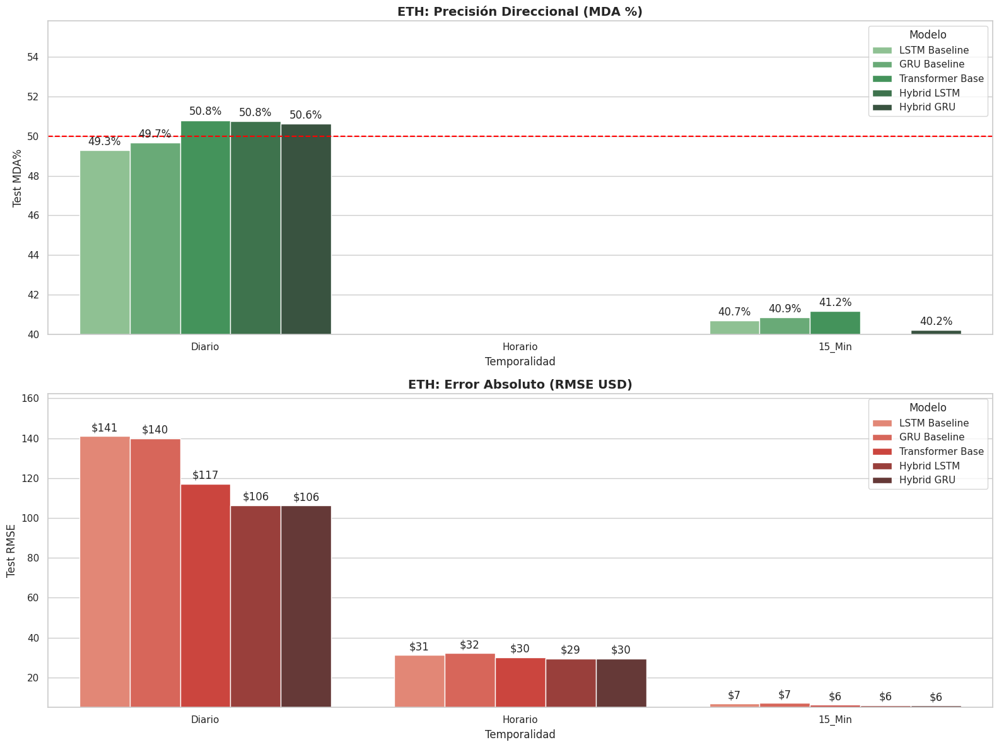


📸 Micro-Zoom: ETH | Diario


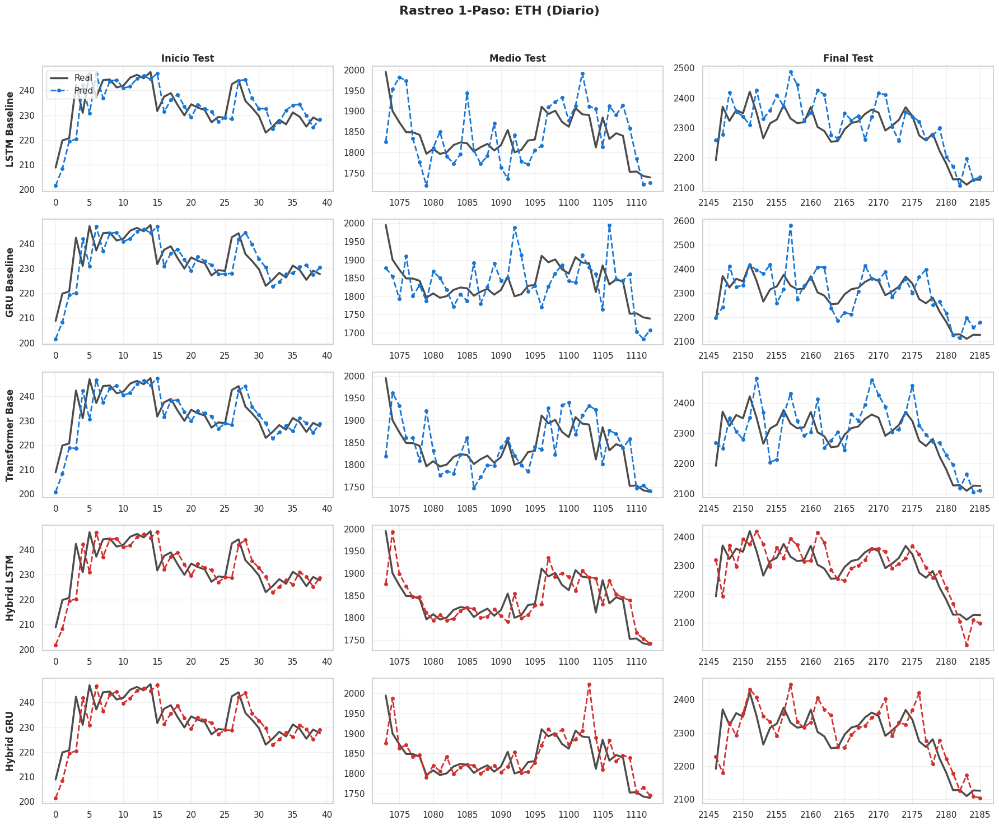


📸 Micro-Zoom: ETH | Horario


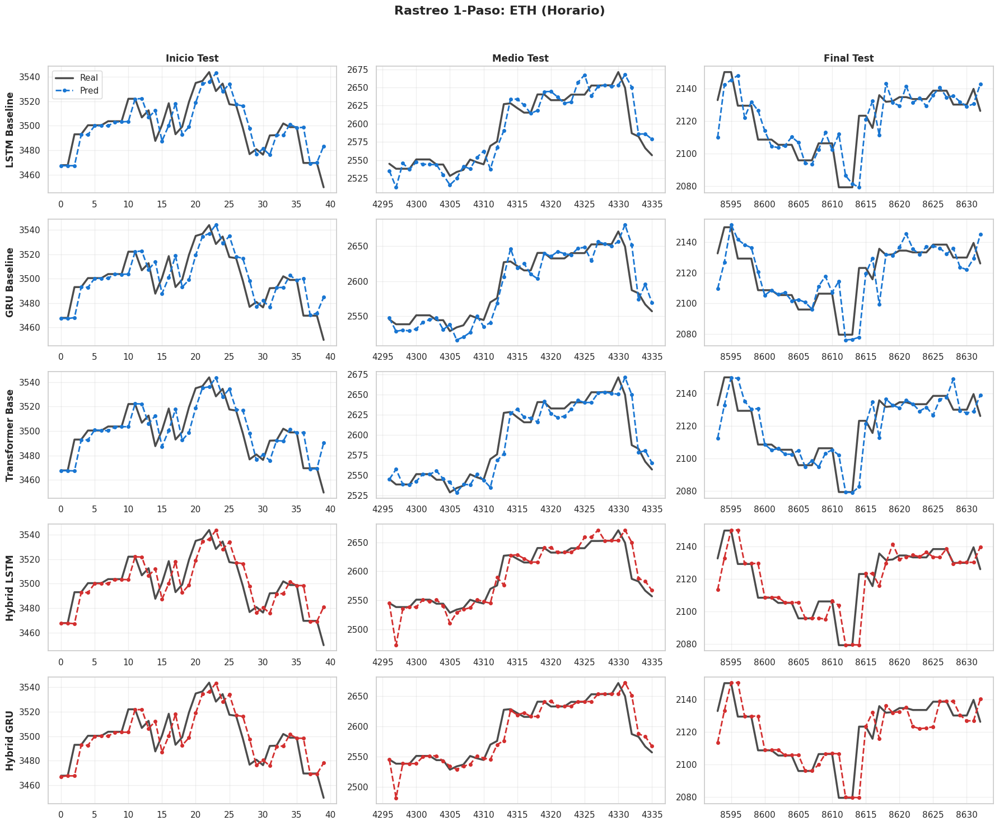


📸 Micro-Zoom: ETH | 15_Min


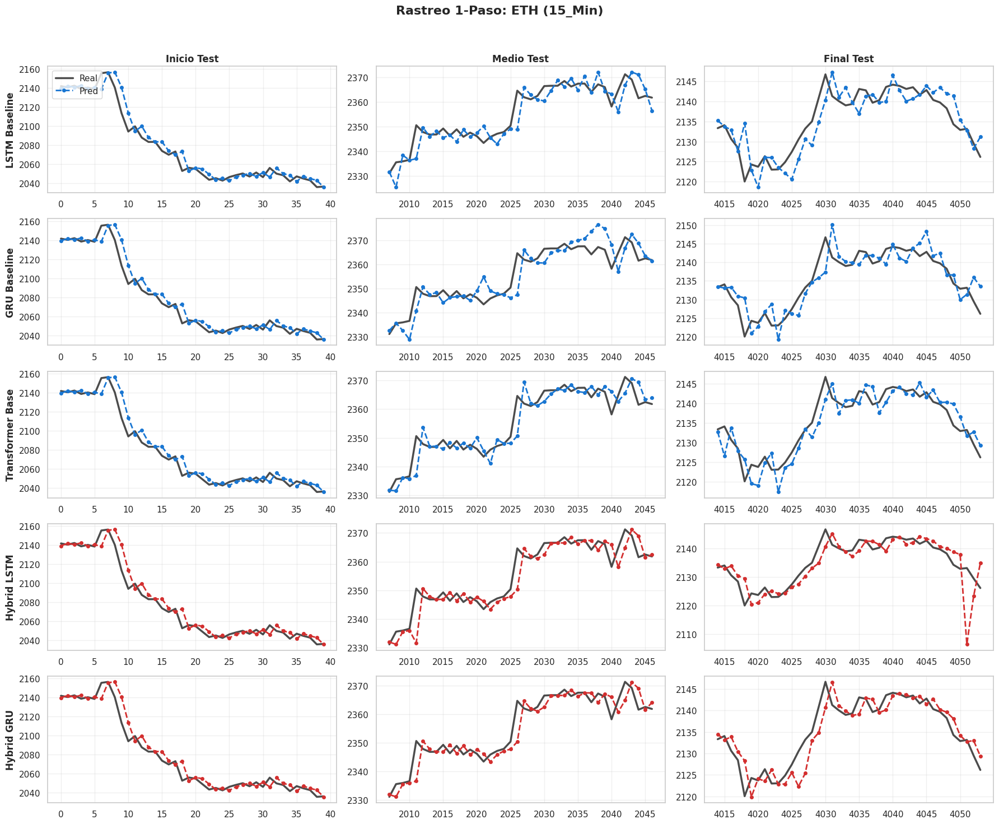

In [ ]:
#@title Experimento Multiescala: ETHEREUM (PACF + VIX + pred_len=1)
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
import yfinance as yf
from statsmodels.tsa.stattools import pacf
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display

activo_actual = 'ETH'
ticker_actual = 'ETH-USD'
print(f"🚀 INICIANDO EXPERIMENTO {activo_actual} (3 Temporalidades)...")

CONFIG_TEMP = [('Diario', '1d', 'max'), ('Horario', '1h', '730d'), ('15_Min', '15m', '60d')]
MACRO_TICKERS = {
    'Context_ETH': 'ETH-USD', 'Macro_SP500': '^GSPC', 'Macro_NASDAQ': '^IXIC',
    'Macro_DXY': 'DX-Y.NYB', 'Macro_US10Y': '^TNX', 'Sentiment_VIX': '^VIX',
    'Commodity_Gold': 'GC=F', 'Commodity_Oil': 'CL=F'
}

def descargar_multiescala_activo(ticker_symbol, nombre_activo, intervalo, periodo):
    print(f"   📥 Descargando {nombre_activo} en {intervalo}...")
    df_main = yf.download(ticker_symbol, period=periodo, interval=intervalo, auto_adjust=True, progress=False)
    if isinstance(df_main.columns, pd.MultiIndex): df_main.columns = [col[0] for col in df_main.columns]
    df_main = df_main[['Open', 'High', 'Low', 'Close', 'Volume']].copy()

    dfs_macro = {}
    for col_name, ticker in MACRO_TICKERS.items():
        if nombre_activo == 'ETH' and col_name == 'Context_ETH': continue
        try:
            tmp = yf.download(ticker, period=periodo, interval=intervalo, auto_adjust=True, progress=False)
            if isinstance(tmp.columns, pd.MultiIndex): tmp.columns = [col[0] for col in tmp.columns]
            dfs_macro[col_name] = tmp[['Close']].rename(columns={'Close': col_name})
        except: pass

    df_full = pd.concat([df_main] + list(dfs_macro.values()), axis=1).ffill().dropna()

    close, vol = df_full['Close'], df_full['Volume']
    df_full['EMA_9'], df_full['EMA_200'] = close.ewm(span=9).mean(), close.ewm(span=200).mean()
    df_full['SMA_200'] = close.rolling(200).mean()
    df_full['VWAP'] = (close * vol).cumsum() / vol.cumsum()

    delta = close.diff()
    gain, loss = delta.clip(lower=0).rolling(14).mean(), (-delta.clip(upper=0)).rolling(14).mean()
    df_full['RSI_14'] = 100 - (100 / (1 + gain / loss.replace(0, 1e-10)))

    ema12, ema26 = close.ewm(span=12).mean(), close.ewm(span=26).mean()
    df_full['MACD_Line'] = ema12 - ema26
    df_full['MACD_Hist'] = df_full['MACD_Line'] - df_full['MACD_Line'].ewm(span=9).mean()

    rename_map = {'Open': 'BTC_Open', 'High': 'BTC_High', 'Low': 'BTC_Low', 'Close': 'Target_BTC', 'Volume': 'BTC_Volume'}
    return df_full.rename(columns=rename_map).dropna()

datasets_eth = {}
for nombre_temp, intervalo, periodo in CONFIG_TEMP:
    datasets_eth[nombre_temp] = descargar_multiescala_activo(ticker_actual, activo_actual, intervalo, periodo)

def calcular_optimos_pacf(df, max_seq=90):
    precios = df['Target_BTC'].dropna()
    log_ret = np.log(precios / precios.shift(1)).replace([np.inf, -np.inf], np.nan).dropna()
    volatilidad = log_ret ** 2
    umbral_vol = 1.96 / np.sqrt(len(volatilidad))
    pacf_v = pacf(volatilidad, nlags=max_seq)
    lags_sig_v = np.where(np.abs(pacf_v[1:]) > umbral_vol)[0] + 1
    return int(lags_sig_v[-1]) if len(lags_sig_v) > 0 else 10, 1

params_pacf_eth = {}
print(f"\n📊 1. Extrayendo memoria estadística (PACF) para {activo_actual}...")
for temp in ['Diario', 'Horario', '15_Min']:
    s_len, p_len = calcular_optimos_pacf(datasets_eth[temp])
    params_pacf_eth[temp] = {'seq_len': s_len, 'pred_len': p_len}
    print(f"   [{temp}] -> Contexto: {s_len} | Horizonte: {p_len}")

print(f"\n🚀 2. Entrenando Modelos en {activo_actual} (VIX Loss + pred_len=1)...")
resultados_eth, trayectorias_eth = [], {}

for temp in ['Diario', 'Horario', '15_Min']:
    print(f"\n{'='*60}\n⌛ Temporalidad: {temp} | Contexto: {params_pacf_eth[temp]['seq_len']}")
    df_raw = datasets_eth[temp]
    s_len, p_len = params_pacf_eth[temp]['seq_len'], params_pacf_eth[temp]['pred_len']

    feats_con_vix = list(dict.fromkeys(top_features + ['Sentiment_VIX']))
    feats_disponibles = [f for f in feats_con_vix if f in df_raw.columns]

    df_filtrado = df_raw[feats_disponibles + ['Target_BTC']].copy()
    data_prep = preparacion_datos_base(df_filtrado, f"{activo_actual}-{temp}")
    cols, input_dim = data_prep['feature_cols'], data_prep['features_raw'].shape[1]

    if 'Sentiment_VIX' not in cols: continue
    vix_idx = cols.index('Sentiment_VIX')

    modelos_instancias = {
        'LSTM Baseline':    Baseline_LSTM(input_dim, 32, pred_length=p_len),
        'GRU Baseline':     Baseline_GRU(input_dim, 32, pred_length=p_len),
        'Transformer Base': Baseline_Transformer(input_dim, 32, pred_length=p_len),
        'Hybrid LSTM':      Hybrid_LSTM_Transformer(input_dim, 32, 4, 64, 2, pred_len=p_len),
        'Hybrid GRU':       Hybrid_GRU_Transformer(input_dim, 32, 4, 64, 2, pred_len=p_len)
    }

    trayectorias_eth[temp] = {}
    for nombre_mod, modelo in modelos_instancias.items():
        print(f"   🧠 Evaluando {nombre_mod}...")
        met, reales, preds = wf_eval_vix_dynamic(modelo.to(device), data_prep, vix_idx, s_len, p_len, 730)
        resultados_eth.append({'Temporalidad': temp, 'Modelo': nombre_mod, 'Test RMSE': met['RMSE'], 'Test MDA%': met['MDA (%)']})
        trayectorias_eth[temp][nombre_mod] = (np.array(reales), np.array(preds))

df_res_eth = pd.DataFrame(resultados_eth)

print(f"\n📊 RESULTADOS FINALES: {activo_actual}")
display(df_res_eth.sort_values(by=['Temporalidad', 'Test MDA%'], ascending=[True, False]))

# GRÁFICAS ETH
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(2, 1, figsize=(16, 12))
sns.barplot(data=df_res_eth, x='Temporalidad', y='Test MDA%', hue='Modelo', ax=axes[0], palette="Greens_d")
axes[0].set_title(f'{activo_actual}: Precisión Direccional (MDA %)', fontweight='bold', fontsize=14)
axes[0].axhline(50, color='red', linestyle='--')
axes[0].set_ylim(40, df_res_eth['Test MDA%'].max() + 5)
for c in axes[0].containers: axes[0].bar_label(c, fmt='%.1f%%', padding=3)

sns.barplot(data=df_res_eth, x='Temporalidad', y='Test RMSE', hue='Modelo', ax=axes[1], palette="Reds_d")
axes[1].set_title(f'{activo_actual}: Error Absoluto (RMSE USD)', fontweight='bold', fontsize=14)
axes[1].set_ylim(df_res_eth['Test RMSE'].min() * 0.85, df_res_eth['Test RMSE'].max() * 1.15)
for c in axes[1].containers: axes[1].bar_label(c, fmt='$%.0f', padding=3)
plt.tight_layout(); plt.show()

# MICRO-ZOOMS ETH
W = 40
for temp in ['Diario', 'Horario', '15_Min']:
    print(f"\n📸 Micro-Zoom: {activo_actual} | {temp}")
    modelos_tray = trayectorias_eth[temp]
    fig, axes = plt.subplots(len(modelos_tray), 3, figsize=(18, 3 * len(modelos_tray)), sharex=False)
    for row_idx, (nombre_mod, (reales, preds)) in enumerate(modelos_tray.items()):
        L = len(reales)
        zonas = [(0, min(W, L)), (L // 2 - W // 2, L // 2 + W // 2), (L - W, L)]
        for col_idx, (start, end) in enumerate(zonas):
            ax = axes[row_idx, col_idx]
            ax.plot(range(start, end), reales[start:end], color='black', linewidth=2.5, alpha=0.7, label='Real')
            c_pred = '#D32F2F' if 'Hybrid' in nombre_mod else '#1976D2'
            ax.plot(range(start, end), preds[start:end], color=c_pred, linewidth=2, linestyle='--', marker='o', markersize=4, label='Pred')
            if col_idx == 0: ax.set_ylabel(nombre_mod, fontweight='bold', fontsize=12)
            if row_idx == 0: ax.set_title(['Inicio Test', 'Medio Test', 'Final Test'][col_idx], fontweight='bold', fontsize=12)
            ax.grid(True, alpha=0.3)
            if row_idx == 0 and col_idx == 0: ax.legend(loc='upper left')
    plt.suptitle(f'Rastreo 1-Paso: {activo_actual} ({temp})', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96]); plt.show()

In [ ]:
#@title Exportar ETH a TradingView
temporalidad_tv = 'Diario' # 'Diario', 'Horario' o '15_Min'
modelo_tv = 'Hybrid LSTM'

reales, preds = trayectorias_eth[temporalidad_tv][modelo_tv]
fechas_demo = datasets_eth[temporalidad_tv].index[-len(reales):][-400:]
preds_demo = preds[-400:]
f_ini = fechas_demo[0]

preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pine_script_code = f"""//@version=5
strategy("IA Bot - ETH {temporalidad_tv}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({f_ini.year}, {f_ini.month}, {f_ini.day}, {f_ini.hour}, {f_ini.minute})
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

if time >= start_timestamp
    backtest_activo := true

float precio_plot = na
if backtest_activo and index_actual < (array.size(predicciones) - 1)
    float precio_futuro = array.get(predicciones, index_actual)
    if precio_futuro > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro < close
        strategy.entry("Short", strategy.short)
    precio_plot := precio_futuro
    index_actual += 1

plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na)
"""
print(f"👇 PEGA ESTO EN TRADINGVIEW (ETH-USD en {temporalidad_tv}) 👇\n{'-'*80}\n{pine_script_code}\n{'-'*80}")

👇 PEGA ESTO EN TRADINGVIEW (ETH-USD en Diario) 👇
--------------------------------------------------------------------------------
//@version=5
strategy("IA Bot - ETH Diario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "1590.09,1574.42,1588.49,1612.37,1586.57,1578.32,1744.41,1794.36,1769.54,1786.25,1819.59,1753.55,1723.14,1769.07,1793.31,1839.76,1842.04,1833.90,1807.73,1828.16,1821.89,1829.80,2207.24,2346.43,2582.72,2509.92,2438.93,2680.79,2611.30,2549.25,2537.37,2477.07,2602.12,2595.45,2524.74,2645.51,2665.87,2527.67,2530.25,2554.58,2564.80,2664.05,2682.89,2632.94,2529.39,2528.61,2631.37,2687.14,2594.50,2609.59,2495.03,2478.94,2528.56,2506.86,2699.30,2850.09,2775.25,2670.17,2640.63,2572.29,2557.48,2579.24,2512.36,2532.85,2522.73,2446.09,2381.37,2278.42,2421.83,2448.03,2419.65,2416.91,2526.91,2437.72,2501.77,2487.52,2406.65,2572.81,2590.6

In [ ]:
#@title Exportar ETH a TradingView
temporalidad_tv = 'Horario' # 'Diario', 'Horario' o '15_Min'
modelo_tv = 'Hybrid LSTM'

reales, preds = trayectorias_eth[temporalidad_tv][modelo_tv]
fechas_demo = datasets_eth[temporalidad_tv].index[-len(reales):][-400:]
preds_demo = preds[-400:]
f_ini = fechas_demo[0]

preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pine_script_code = f"""//@version=5
strategy("IA Bot - ETH {temporalidad_tv}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({f_ini.year}, {f_ini.month}, {f_ini.day}, {f_ini.hour}, {f_ini.minute})
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

if time >= start_timestamp
    backtest_activo := true

float precio_plot = na
if backtest_activo and index_actual < (array.size(predicciones) - 1)
    float precio_futuro = array.get(predicciones, index_actual)
    if precio_futuro > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro < close
        strategy.entry("Short", strategy.short)
    precio_plot := precio_futuro
    index_actual += 1

plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na)
"""
print(f"👇 PEGA ESTO EN TRADINGVIEW (ETH-USD en {temporalidad_tv}) 👇\n{'-'*80}\n{pine_script_code}\n{'-'*80}")

👇 PEGA ESTO EN TRADINGVIEW (ETH-USD en Horario) 👇
--------------------------------------------------------------------------------
//@version=5
strategy("IA Bot - ETH Horario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "2313.35,2278.22,2292.05,2291.92,2292.04,2316.33,2316.38,2316.24,2336.29,2336.32,2334.20,2334.24,2313.66,2311.10,2310.95,2315.14,2315.09,2315.14,2309.99,2292.12,2308.82,2308.78,2308.75,2286.94,2317.30,2327.84,2322.06,2372.10,2364.10,2365.63,2398.58,2394.75,2392.01,2390.50,2389.63,2392.54,2407.57,2420.31,2420.32,2420.26,2405.86,2405.88,2405.87,2405.46,2405.47,2405.38,2387.67,2387.58,2387.65,2402.64,2376.50,2374.33,2364.02,2341.66,2318.30,2315.77,2312.18,2312.05,2300.18,2307.52,2303.97,2324.98,2338.69,2315.85,2315.66,2342.24,2319.44,2319.41,2329.97,2335.01,2333.33,2334.30,2348.05,2350.10,2369.78,2365.31,2366.12,2363.60,2369

In [ ]:
#@title Exportar ETH a TradingView
temporalidad_tv = '15_Min' # 'Diario', 'Horario' o '15_Min'
modelo_tv = 'Hybrid LSTM'

reales, preds = trayectorias_eth[temporalidad_tv][modelo_tv]
fechas_demo = datasets_eth[temporalidad_tv].index[-len(reales):][-400:]
preds_demo = preds[-400:]
f_ini = fechas_demo[0]

preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pine_script_code = f"""//@version=5
strategy("IA Bot - ETH {temporalidad_tv}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({f_ini.year}, {f_ini.month}, {f_ini.day}, {f_ini.hour}, {f_ini.minute})
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

if time >= start_timestamp
    backtest_activo := true

float precio_plot = na
if backtest_activo and index_actual < (array.size(predicciones) - 1)
    float precio_futuro = array.get(predicciones, index_actual)
    if precio_futuro > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro < close
        strategy.entry("Short", strategy.short)
    precio_plot := precio_futuro
    index_actual += 1

plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na)
"""
print(f"👇 PEGA ESTO EN TRADINGVIEW (ETH-USD en {temporalidad_tv}) 👇\n{'-'*80}\n{pine_script_code}\n{'-'*80}")

👇 PEGA ESTO EN TRADINGVIEW (ETH-USD en 15_Min) 👇
--------------------------------------------------------------------------------
//@version=5
strategy("IA Bot - ETH 15_Min", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "2171.77,2175.92,2176.53,2171.27,2174.55,2177.32,2177.44,2179.72,2178.65,2181.68,2180.34,2180.71,2181.18,2180.68,2179.55,2179.26,2182.77,2180.24,2177.68,2180.69,2177.21,2173.56,2168.44,2171.42,2173.00,2173.40,2177.26,2178.97,2180.34,2181.49,2184.61,2189.83,2187.19,2187.17,2184.96,2185.80,2183.25,2185.60,2184.61,2184.90,2193.14,2192.57,2191.19,2184.55,2182.31,2185.26,2178.72,2181.34,2182.63,2182.58,2187.26,2187.48,2191.77,2190.76,2191.65,2188.97,2187.94,2188.24,2188.22,2188.25,2190.95,2191.85,2190.69,2182.65,2181.01,2181.20,2178.27,2172.97,2172.70,2123.45,2130.25,2121.72,2113.83,2109.56,2115.47,2113.92,2111.34,2110.16,2116.4

### Solana

🚀 INICIANDO EXPERIMENTO SOL (3 Temporalidades)...
   📥 Descargando SOL en temporalidad 1d...
   📥 Descargando SOL en temporalidad 1h...
   📥 Descargando SOL en temporalidad 15m...

📊 1. Extrayendo memoria estadística (PACF) para SOL...
   [Diario] -> Contexto: 89 | Horizonte: 1
   [Horario] -> Contexto: 81 | Horizonte: 1
   [15_Min] -> Contexto: 87 | Horizonte: 1

🚀 2. Entrenando Modelos en SOL (VIX Loss + pred_len=1)...

⌛ Temporalidad: Diario | Contexto: 89

[SOL-Diario] Shape inicial: (2034, 13)
[SOL-Diario] Shape final tras limpieza: (2033, 13)
[SOL-Diario] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
   🧠 Evaluando GRU Baseline...
   🧠 Evaluando Transformer Base...
   🧠 Evaluando Hybrid LSTM...
   🧠 Evaluando Hybrid GRU...

⌛ Temporalidad: Horario | Contexto: 81

[SOL-Horario] Shape inicial: (24236, 13)
[SOL-Horario] Shape final tras limpieza: (10046, 13)
[SOL-Horario] Features seleccionadas: 10
   🧠 Evaluando LSTM Baseline...
   🧠 Evaluando GRU Baseline...
   🧠 Eval

,Temporalidad,Modelo,Test RMSE,Test MDA%
12,15_Min,Transformer Base,0.268473,41.669177
11,15_Min,GRU Baseline,0.304115,40.162700
13,15_Min,Hybrid LSTM,0.259419,40.012052
10,15_Min,LSTM Baseline,0.289438,39.198554
14,15_Min,Hybrid GRU,0.252550,38.565833
2,Diario,Transformer Base,6.643607,49.615975
0,Diario,LSTM Baseline,7.904361,49.308756
4,Diario,Hybrid GRU,6.037546,49.308756
1,Diario,GRU Baseline,7.651865,48.463902
3,Diario,Hybrid LSTM,6.012990,48.156682


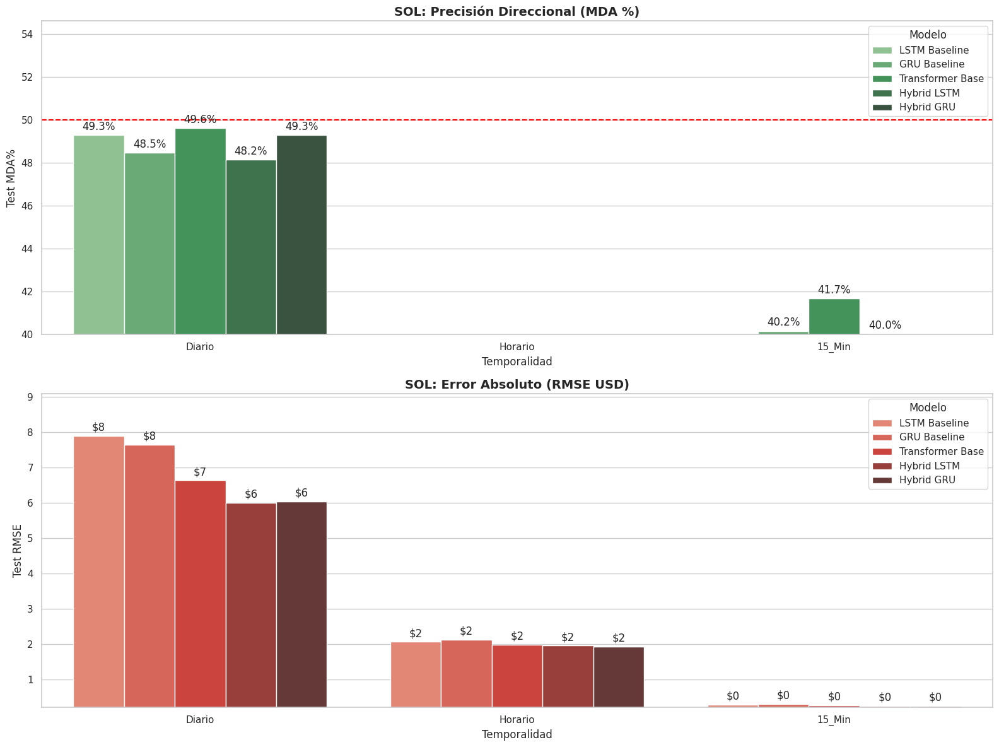


📸 Micro-Zoom: SOL | Diario


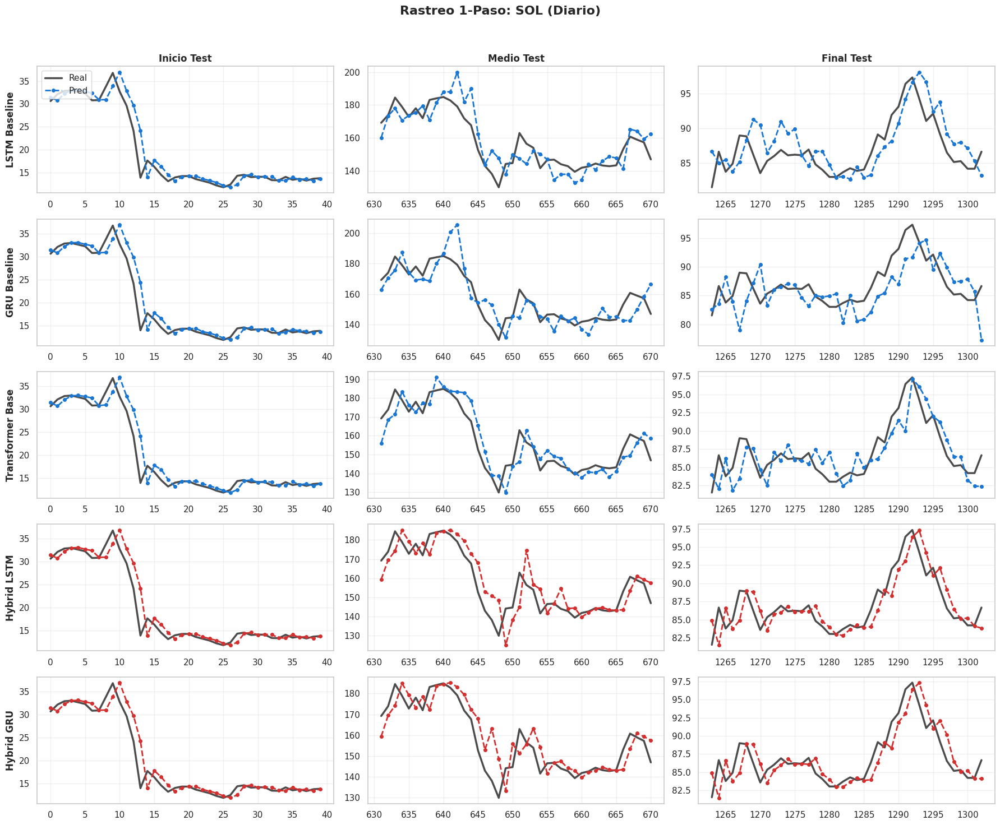


📸 Micro-Zoom: SOL | Horario


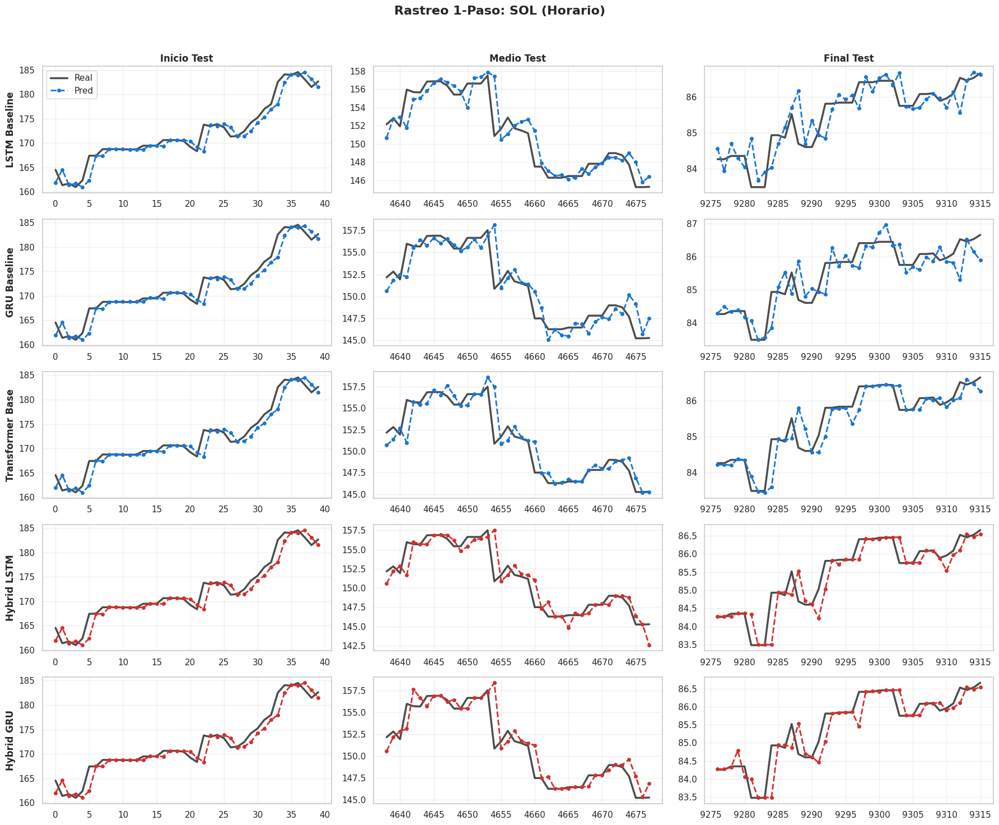


📸 Micro-Zoom: SOL | 15_Min


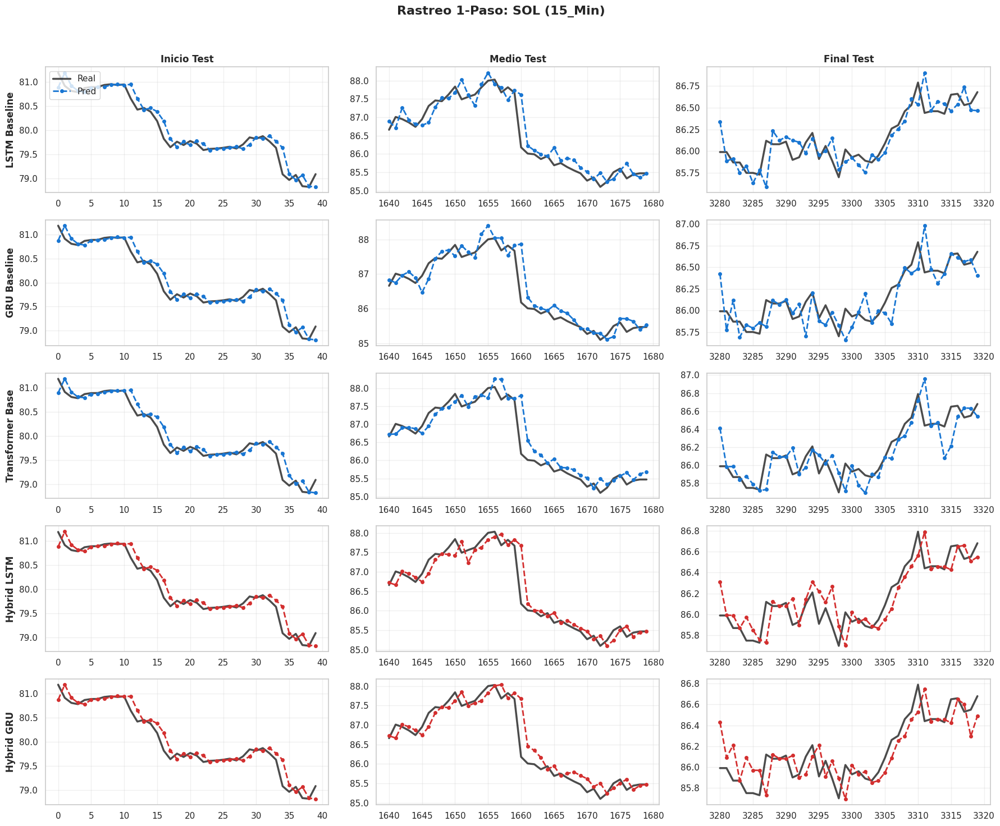

In [ ]:

import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
import yfinance as yf
from statsmodels.tsa.stattools import pacf
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display

# =====================================================================
# 1. DESCARGA Y PREPARACIÓN DE DATOS (MULTITEMPORALIDAD)
# =====================================================================
MACRO_TICKERS = {
    'Context_ETH': 'ETH-USD', 'Macro_SP500': '^GSPC', 'Macro_NASDAQ': '^IXIC',
    'Macro_DXY': 'DX-Y.NYB', 'Macro_US10Y': '^TNX', 'Sentiment_VIX': '^VIX',
    'Commodity_Gold': 'GC=F', 'Commodity_Oil': 'CL=F'
}
TICKERS_EXTRA = {'ETH': 'ETH-USD', 'SOL': 'SOL-USD'}

# Configuraciones de YFinance
CONFIG_TEMP = [
    ('Diario', '1d', 'max'),
    ('Horario', '1h', '730d'),
    ('15_Min', '15m', '60d')
]

def calcular_optimos_pacf(df, max_seq=90):
    precios = df['Target_BTC'].dropna()
    log_ret = np.log(precios / precios.shift(1)).replace([np.inf, -np.inf], np.nan).dropna()
    volatilidad = log_ret ** 2
    umbral_vol = 1.96 / np.sqrt(len(volatilidad))
    pacf_v = pacf(volatilidad, nlags=max_seq)
    lags_sig_v = np.where(np.abs(pacf_v[1:]) > umbral_vol)[0] + 1
    return int(lags_sig_v[-1]) if len(lags_sig_v) > 0 else 10, 1

def descargar_multiescala_activo(ticker_symbol, nombre_activo, intervalo, periodo):
    print(f"   📥 Descargando {nombre_activo} en temporalidad {intervalo}...")
    df_main = yf.download(ticker_symbol, period=periodo, interval=intervalo, auto_adjust=True, progress=False)
    if isinstance(df_main.columns, pd.MultiIndex):
        df_main.columns = [col[0] for col in df_main.columns]
    df_main = df_main[['Open', 'High', 'Low', 'Close', 'Volume']].copy()

    dfs_macro = {}
    for col_name, ticker in MACRO_TICKERS.items():
        if nombre_activo == 'ETH' and col_name == 'Context_ETH': continue
        try:
            tmp = yf.download(ticker, period=periodo, interval=intervalo, auto_adjust=True, progress=False)
            if isinstance(tmp.columns, pd.MultiIndex): tmp.columns = [col[0] for col in tmp.columns]
            dfs_macro[col_name] = tmp[['Close']].rename(columns={'Close': col_name})
        except: pass

    df_full = pd.concat([df_main] + list(dfs_macro.values()), axis=1).ffill().dropna()

    close, vol = df_full['Close'], df_full['Volume']
    df_full['EMA_9'] = close.ewm(span=9).mean()
    df_full['EMA_200'] = close.ewm(span=200).mean()
    df_full['SMA_200'] = close.rolling(200).mean()
    df_full['VWAP'] = (close * vol).cumsum() / vol.cumsum()

    delta = close.diff()
    gain = delta.clip(lower=0).rolling(14).mean()
    loss = (-delta.clip(upper=0)).rolling(14).mean()
    df_full['RSI_14'] = 100 - (100 / (1 + gain / loss.replace(0, 1e-10)))

    ema12 = close.ewm(span=12).mean()
    ema26 = close.ewm(span=26).mean()
    df_full['MACD_Line'] = ema12 - ema26
    df_full['MACD_Hist'] = df_full['MACD_Line'] - df_full['MACD_Line'].ewm(span=9).mean()

    rename_map = {'Open': 'BTC_Open', 'High': 'BTC_High', 'Low': 'BTC_Low', 'Close': 'Target_BTC', 'Volume': 'BTC_Volume'}
    df_full = df_full.rename(columns=rename_map).dropna()
    return df_full


#@title Experimento Multiescala: SOLANA (PACF + VIX + pred_len=1)
activo_actual = 'SOL'
ticker_actual = 'SOL-USD'
print(f"🚀 INICIANDO EXPERIMENTO {activo_actual} (3 Temporalidades)...")

datasets_sol = {}
for nombre_temp, intervalo, periodo in CONFIG_TEMP:
    datasets_sol[nombre_temp] = descargar_multiescala_activo(ticker_actual, activo_actual, intervalo, periodo)

params_pacf_sol = {}
print(f"\n📊 1. Extrayendo memoria estadística (PACF) para {activo_actual}...")
for temp in ['Diario', 'Horario', '15_Min']:
    s_len, p_len = calcular_optimos_pacf(datasets_sol[temp])
    params_pacf_sol[temp] = {'seq_len': s_len, 'pred_len': p_len}
    print(f"   [{temp}] -> Contexto: {s_len} | Horizonte: {p_len}")

print(f"\n🚀 2. Entrenando Modelos en {activo_actual} (VIX Loss + pred_len=1)...")
resultados_sol, trayectorias_sol = [], {}

for temp in ['Diario', 'Horario', '15_Min']:
    print(f"\n{'='*60}\n⌛ Temporalidad: {temp} | Contexto: {params_pacf_sol[temp]['seq_len']}")
    df_raw = datasets_sol[temp]
    s_len, p_len = params_pacf_sol[temp]['seq_len'], params_pacf_sol[temp]['pred_len']

    feats_con_vix = list(dict.fromkeys(top_features + ['Sentiment_VIX']))
    feats_disponibles = [f for f in feats_con_vix if f in df_raw.columns]

    df_filtrado = df_raw[feats_disponibles + ['Target_BTC']].copy()
    data_prep = preparacion_datos_base(df_filtrado, f"{activo_actual}-{temp}")
    cols, input_dim = data_prep['feature_cols'], data_prep['features_raw'].shape[1]

    if 'Sentiment_VIX' not in cols: continue
    vix_idx = cols.index('Sentiment_VIX')

    modelos_instancias = {
        'LSTM Baseline':    Baseline_LSTM(input_dim, 32, pred_length=p_len),
        'GRU Baseline':     Baseline_GRU(input_dim, 32, pred_length=p_len),
        'Transformer Base': Baseline_Transformer(input_dim, 32, pred_length=p_len),
        'Hybrid LSTM':      Hybrid_LSTM_Transformer(input_dim, 32, 4, 64, 2, pred_len=p_len),
        'Hybrid GRU':       Hybrid_GRU_Transformer(input_dim, 32, 4, 64, 2, pred_len=p_len)
    }

    trayectorias_sol[temp] = {}
    for nombre_mod, modelo in modelos_instancias.items():
        print(f"   🧠 Evaluando {nombre_mod}...")
        met, reales, preds = wf_eval_vix_dynamic(modelo.to(device), data_prep, vix_idx, s_len, p_len, 730)
        resultados_sol.append({'Temporalidad': temp, 'Modelo': nombre_mod, 'Test RMSE': met['RMSE'], 'Test MDA%': met['MDA (%)']})
        trayectorias_sol[temp][nombre_mod] = (np.array(reales), np.array(preds))

df_res_sol = pd.DataFrame(resultados_sol)

print(f"\n📊 RESULTADOS FINALES: {activo_actual}")
display(df_res_sol.sort_values(by=['Temporalidad', 'Test MDA%'], ascending=[True, False]))

# GRÁFICAS SOL
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(2, 1, figsize=(16, 12))
sns.barplot(data=df_res_sol, x='Temporalidad', y='Test MDA%', hue='Modelo', ax=axes[0], palette="Greens_d")
axes[0].set_title(f'{activo_actual}: Precisión Direccional (MDA %)', fontweight='bold', fontsize=14)
axes[0].axhline(50, color='red', linestyle='--')
axes[0].set_ylim(40, df_res_sol['Test MDA%'].max() + 5)
for c in axes[0].containers: axes[0].bar_label(c, fmt='%.1f%%', padding=3)

sns.barplot(data=df_res_sol, x='Temporalidad', y='Test RMSE', hue='Modelo', ax=axes[1], palette="Reds_d")
axes[1].set_title(f'{activo_actual}: Error Absoluto (RMSE USD)', fontweight='bold', fontsize=14)
axes[1].set_ylim(df_res_sol['Test RMSE'].min() * 0.85, df_res_sol['Test RMSE'].max() * 1.15)
for c in axes[1].containers: axes[1].bar_label(c, fmt='$%.0f', padding=3)
plt.tight_layout(); plt.show()

# MICRO-ZOOMS SOL
W = 40
for temp in ['Diario', 'Horario', '15_Min']:
    print(f"\n📸 Micro-Zoom: {activo_actual} | {temp}")
    modelos_tray = trayectorias_sol[temp]
    fig, axes = plt.subplots(len(modelos_tray), 3, figsize=(18, 3 * len(modelos_tray)), sharex=False)
    for row_idx, (nombre_mod, (reales, preds)) in enumerate(modelos_tray.items()):
        L = len(reales)
        zonas = [(0, min(W, L)), (L // 2 - W // 2, L // 2 + W // 2), (L - W, L)]
        for col_idx, (start, end) in enumerate(zonas):
            ax = axes[row_idx, col_idx]
            ax.plot(range(start, end), reales[start:end], color='black', linewidth=2.5, alpha=0.7, label='Real')
            c_pred = '#D32F2F' if 'Hybrid' in nombre_mod else '#1976D2'
            ax.plot(range(start, end), preds[start:end], color=c_pred, linewidth=2, linestyle='--', marker='o', markersize=4, label='Pred')
            if col_idx == 0: ax.set_ylabel(nombre_mod, fontweight='bold', fontsize=12)
            if row_idx == 0: ax.set_title(['Inicio Test', 'Medio Test', 'Final Test'][col_idx], fontweight='bold', fontsize=12)
            ax.grid(True, alpha=0.3)
            if row_idx == 0 and col_idx == 0: ax.legend(loc='upper left')
    plt.suptitle(f'Rastreo 1-Paso: {activo_actual} ({temp})', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96]); plt.show()

In [ ]:
#@title Exportar SOL a TradingView
temporalidad_tv = 'Diario' # 'Diario', 'Horario' o '15_Min'
modelo_tv = 'Hybrid LSTM'

reales, preds = trayectorias_sol[temporalidad_tv][modelo_tv]
fechas_demo = datasets_sol[temporalidad_tv].index[-len(reales):][-400:]
preds_demo = preds[-400:]
f_ini = fechas_demo[0]

preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pine_script_code = f"""//@version=5
strategy("IA Bot - SOL {temporalidad_tv}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({f_ini.year}, {f_ini.month}, {f_ini.day}, {f_ini.hour}, {f_ini.minute})
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

if time >= start_timestamp
    backtest_activo := true

float precio_plot = na
if backtest_activo and index_actual < (array.size(predicciones) - 1)
    float precio_futuro = array.get(predicciones, index_actual)
    if precio_futuro > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro < close
        strategy.entry("Short", strategy.short)
    precio_plot := precio_futuro
    index_actual += 1

plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na)
"""
print(f"👇 PEGA ESTO EN TRADINGVIEW (SOL-USD en {temporalidad_tv}) 👇\n{'-'*80}\n{pine_script_code}\n{'-'*80}")

👇 PEGA ESTO EN TRADINGVIEW (SOL-USD en Diario) 👇
--------------------------------------------------------------------------------
//@version=5
strategy("IA Bot - SOL Diario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "131.75,134.02,134.42,140.10,138.11,137.07,149.12,151.57,152.73,151.37,149.68,148.61,148.16,146.79,148.07,151.24,148.43,147.21,144.34,147.10,147.20,147.61,164.41,173.29,178.11,173.53,168.74,186.35,179.58,169.49,167.81,166.94,174.42,167.33,168.99,185.34,180.17,174.32,176.57,176.19,175.49,176.71,173.47,167.06,156.68,157.06,158.18,157.43,155.77,153.76,144.93,146.54,150.58,152.93,161.63,165.57,161.59,153.28,152.40,145.18,153.24,151.31,148.24,145.27,147.50,140.58,135.53,132.00,145.28,146.36,143.96,139.44,142.64,151.25,153.80,155.18,147.33,152.63,152.84,148.20,146.85,152.30,149.64,152.20,157.72,164.52,163.34,161.12,161.56,162.68,

In [ ]:
#@title Exportar SOL a TradingView
temporalidad_tv = 'Horario' # 'Diario', 'Horario' o '15_Min'
modelo_tv = 'Hybrid LSTM'

reales, preds = trayectorias_sol[temporalidad_tv][modelo_tv]
fechas_demo = datasets_sol[temporalidad_tv].index[-len(reales):][-400:]
preds_demo = preds[-400:]
f_ini = fechas_demo[0]

preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pine_script_code = f"""//@version=5
strategy("IA Bot - SOL {temporalidad_tv}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({f_ini.year}, {f_ini.month}, {f_ini.day}, {f_ini.hour}, {f_ini.minute})
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

if time >= start_timestamp
    backtest_activo := true

float precio_plot = na
if backtest_activo and index_actual < (array.size(predicciones) - 1)
    float precio_futuro = array.get(predicciones, index_actual)
    if precio_futuro > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro < close
        strategy.entry("Short", strategy.short)
    precio_plot := precio_futuro
    index_actual += 1

plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na)
"""
print(f"👇 PEGA ESTO EN TRADINGVIEW (SOL-USD en {temporalidad_tv}) 👇\n{'-'*80}\n{pine_script_code}\n{'-'*80}")

👇 PEGA ESTO EN TRADINGVIEW (SOL-USD en Horario) 👇
--------------------------------------------------------------------------------
//@version=5
strategy("IA Bot - SOL Horario", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "84.79,85.39,84.88,84.35,85.82,85.81,85.94,85.48,85.31,85.37,86.14,86.14,85.87,85.81,86.03,85.90,85.51,85.75,85.75,85.87,85.15,85.37,85.22,85.43,85.63,86.09,86.58,86.04,87.50,87.32,88.03,87.78,87.58,88.38,88.14,88.66,89.19,89.19,88.33,88.82,88.82,88.82,88.24,88.24,88.24,87.72,87.72,87.90,87.48,86.49,85.88,85.41,85.39,85.32,85.26,85.32,85.87,86.05,86.42,86.42,86.14,86.15,86.07,86.11,86.14,85.81,85.75,86.04,86.50,86.64,86.00,85.74,86.52,87.12,86.85,86.89,87.05,87.94,87.88,87.86,87.78,85.82,85.75,85.77,85.51,85.24,85.30,85.20,84.45,84.68,84.92,85.26,84.20,84.08,84.48,84.30,84.30,84.30,84.49,84.49,84.49,84.21,84.29,83.77,83.5

In [ ]:
#@title Exportar SOL a TradingView
temporalidad_tv = '15_Min' # 'Diario', 'Horario' o '15_Min'
modelo_tv = 'Hybrid LSTM'

reales, preds = trayectorias_sol[temporalidad_tv][modelo_tv]
fechas_demo = datasets_sol[temporalidad_tv].index[-len(reales):][-400:]
preds_demo = preds[-400:]
f_ini = fechas_demo[0]

preds_str = ",".join([f"{p:.2f}" for p in preds_demo])
pine_script_code = f"""//@version=5
strategy("IA Bot - SOL {temporalidad_tv}", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "{preds_str}"
var int start_timestamp = timestamp({f_ini.year}, {f_ini.month}, {f_ini.day}, {f_ini.hour}, {f_ini.minute})
var float[] predicciones = array.new_float(0)
var int index_actual = 0
var bool backtest_activo = false

if barstate.isfirst
    string[] split_str = str.split(preds_str, ",")
    for s in split_str
        array.push(predicciones, str.tonumber(s))

if time >= start_timestamp
    backtest_activo := true

float precio_plot = na
if backtest_activo and index_actual < (array.size(predicciones) - 1)
    float precio_futuro = array.get(predicciones, index_actual)
    if precio_futuro > close
        strategy.entry("Long", strategy.long)
    else if precio_futuro < close
        strategy.entry("Short", strategy.short)
    precio_plot := precio_futuro
    index_actual += 1

plot(precio_plot, color=color.new(color.fuchsia, 0), style=plot.style_circles, linewidth=3, title="IA Prediction")
bgcolor(time == start_timestamp ? color.new(color.yellow, 80) : na)
"""
print(f"👇 PEGA ESTO EN TRADINGVIEW (SOL-USD en {temporalidad_tv}) 👇\n{'-'*80}\n{pine_script_code}\n{'-'*80}")

👇 PEGA ESTO EN TRADINGVIEW (SOL-USD en 15_Min) 👇
--------------------------------------------------------------------------------
//@version=5
strategy("IA Bot - SOL 15_Min", overlay=true, initial_capital=1000, default_qty_type=strategy.percent_of_equity, default_qty_value=100, commission_type=strategy.commission.percent, commission_value=0.1)
var string preds_str = "92.90,92.69,92.61,92.69,92.74,92.80,92.86,92.57,92.55,92.50,92.31,92.41,92.42,91.74,91.90,91.72,92.07,92.34,92.40,91.27,91.46,91.35,90.67,90.61,90.66,90.79,91.03,91.01,91.22,91.56,91.27,91.53,91.40,91.27,91.17,90.98,90.97,91.16,91.25,91.47,91.42,91.33,90.68,90.69,90.80,90.67,90.67,90.70,90.67,90.44,90.31,90.32,90.42,89.21,89.40,88.91,88.89,89.33,89.33,89.03,88.90,89.08,89.02,88.88,89.55,89.61,89.10,89.34,89.08,89.23,89.36,89.22,89.19,89.01,89.17,89.16,89.20,89.29,89.30,89.24,88.82,88.56,88.05,87.97,87.12,87.35,87.62,87.42,87.43,87.45,86.15,86.01,85.79,85.67,85.76,85.96,86.10,86.16,86.20,86.06,86.26,86.22,86.25,86.54,86.53,

## 10.8 Experimento 8: Dinámicas de Aprendizaje y Tolerancia al Sobreajuste (Epoch Analysis)


**Objetivo:** Analizar la velocidad de convergencia y el punto de quiebre por sobreajuste (*Overfitting*) de las diferentes arquitecturas.
**Hipótesis:** Se postula que los modelos Baseline (LSTM/GRU) convergerán rápidamente pero sufrirán de sobreajuste temprano debido a la memorización del ruido financiero. En contraste, los modelos Híbridos exhibirán un aprendizaje más gradual pero alcanzarán un óptimo global inferior y retrasarán la aparición del sobreajuste gracias a la regularización natural que provee el mecanismo de *Cross-Attention*.
**Metodología:**
- Configuración estática (Train 70% / Test 30%) sobre la temporalidad Diaria con `seq_len=60` y `pred_len=1`.
- Entrenamiento extendido a 150 épocas sin *Early Stopping* forzado, pero guardando el *Best Checkpoint* basado en la `VolatilityDirectionalLoss` del conjunto de Test.
- Se graficarán las curvas de pérdida (Train vs Test) para encontrar el punto de inflexión ("U-shape") de cada modelo.

🚀 INICIANDO EXPERIMENTO F: Dinámicas de Aprendizaje (con Early Stopping)...

[Diario] Shape inicial: (3114, 13)
[Diario] Shape final tras limpieza: (3113, 13)
[Diario] Features seleccionadas: 10

Entrenando modelos (Máx 150 épocas | Paciencia: 30 épocas)...

   🧠 Entrenando LSTM Baseline...
      🛑 Early Stopping activado en la época 112 (Óptimo fue en la 82).
   🧠 Entrenando GRU Baseline...
      🛑 Early Stopping activado en la época 71 (Óptimo fue en la 41).
   🧠 Entrenando Transformer Base...
      🛑 Early Stopping activado en la época 73 (Óptimo fue en la 43).
   🧠 Entrenando Hybrid LSTM...
      🛑 Early Stopping activado en la época 128 (Óptimo fue en la 98).
   🧠 Entrenando Hybrid GRU...
      🛑 Early Stopping activado en la época 69 (Óptimo fue en la 39).

📊 RESULTADOS CON EARLY STOPPING ÓPTIMO


,Modelo,Épocas Entrenadas,Época Óptima,Test Loss Mínima,Test RMSE,Test MDA%
3,Hybrid LSTM,128,98,0.190592,1983.642114,50.744559
4,Hybrid GRU,69,39,0.191657,1996.778431,50.630011
2,Transformer Base,73,43,0.192207,1996.598822,50.630011
0,LSTM Baseline,112,82,0.192271,1996.329971,50.744559
1,GRU Baseline,71,41,0.194353,1995.170108,51.088202


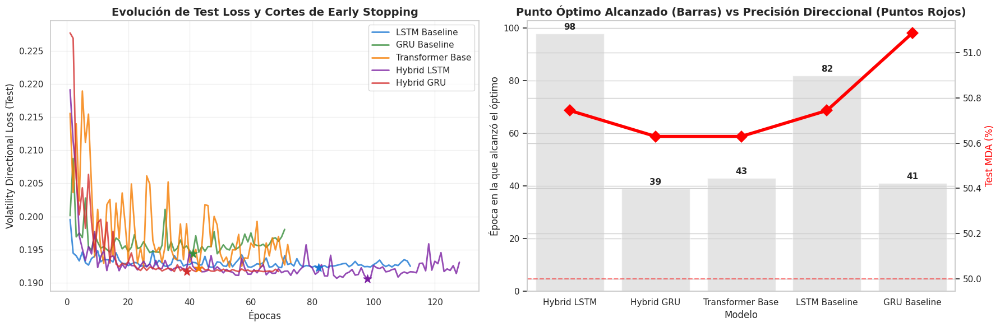

In [ ]:
#@title Experimento F: Dinámicas de Aprendizaje (Early Stopping Dinámico)

import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display
import copy

print("🚀 INICIANDO EXPERIMENTO F: Dinámicas de Aprendizaje (con Early Stopping)...")

# 1. Función de Pérdida
class VolatilityDirectionalLoss(nn.Module):
    def __init__(self, delta=1.0, dir_weight=1.5):
        super().__init__()
        self.huber = nn.HuberLoss(delta=delta)
        self.dir_weight = dir_weight

    def forward(self, y_pred, y_true):
        y_pred = y_pred.squeeze()
        y_true = y_true.squeeze()
        loss_mag = self.huber(y_pred, y_true)
        signo_real = torch.sign(y_true)
        penalizacion = - (y_pred * signo_real)
        loss_dir = torch.mean(torch.relu(penalizacion))
        return loss_mag + (self.dir_weight * loss_dir)

# 2. Configuración del Experimento Estático
MAX_EPOCHS = 150
PATIENCE = 30  # Dejamos 30 épocas de paciencia para poder ver la forma de "U" antes de cortar
SEQ_LEN = 60
PRED_LEN = 1

# Preparar datos (Diario)
df_diario = df_diario_ext[top_features + ['Target_BTC']].copy()
data_prep = preparacion_datos_base(df_diario, "Diario")

features_raw = data_prep['features_raw']
target_raw = data_prep['target_raw']
precios = data_prep['precios_absolutos']
cols = data_prep['feature_cols']

# Split Estático 70/30
train_size_raw = int(len(features_raw) * 0.7)
train_F = features_raw[:train_size_raw]
train_T = target_raw[:train_size_raw]
test_F = features_raw[train_size_raw:]
test_T = target_raw[train_size_raw:]

# Escalado
idx_std = [i for i, c in enumerate(cols) if c in cols_log_return + cols_volume + cols_diff_std]
idx_rob = [i for i, c in enumerate(cols) if c in cols_pct_robust + cols_diff_robust]
idx_mm  = [i for i, c in enumerate(cols) if i not in idx_std + idx_rob]

sc_std, sc_rob, sc_mm, scaler_t = StandardScaler(), RobustScaler(), MinMaxScaler((-1, 1)), StandardScaler()
train_F_sc = np.zeros_like(train_F)
if idx_std: train_F_sc[:, idx_std] = sc_std.fit_transform(train_F[:, idx_std])
if idx_rob: train_F_sc[:, idx_rob] = sc_rob.fit_transform(train_F[:, idx_rob])
if idx_mm:  train_F_sc[:, idx_mm]  = sc_mm.fit_transform(train_F[:, idx_mm])
train_T_sc = scaler_t.fit_transform(train_T.reshape(-1, 1)).flatten()

test_F_sc = np.zeros_like(test_F)
if idx_std: test_F_sc[:, idx_std] = sc_std.transform(test_F[:, idx_std])
if idx_rob: test_F_sc[:, idx_rob] = sc_rob.transform(test_F[:, idx_rob])
if idx_mm:  test_F_sc[:, idx_mm]  = sc_mm.transform(test_F[:, idx_mm])
test_T_sc = scaler_t.transform(test_T.reshape(-1, 1)).flatten()

# Secuencias
X_tr, y_tr = create_sequences(train_F_sc, train_T_sc, seq_length=SEQ_LEN, pred_length=PRED_LEN)
X_te, y_te = create_sequences(test_F_sc, test_T_sc, seq_length=SEQ_LEN, pred_length=PRED_LEN)

loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)

input_features = features_raw.shape[1]
modelos_dict = {
    'LSTM Baseline':    lambda inp: Baseline_LSTM(inp, 32, pred_length=PRED_LEN),
    'GRU Baseline':     lambda inp: Baseline_GRU(inp, 32, pred_length=PRED_LEN),
    'Transformer Base': lambda inp: Baseline_Transformer(inp, 32, pred_length=PRED_LEN),
    'Hybrid LSTM':      lambda inp: Hybrid_LSTM_Transformer(inp, d_model=32, num_heads=4, hidden_dim_lstm=64, num_layers_lstm=2, pred_len=PRED_LEN),
    'Hybrid GRU':       lambda inp: Hybrid_GRU_Transformer(inp, d_model=32, num_heads=4, hidden_dim_gru=64, num_layers_gru=2, pred_len=PRED_LEN)
}

historial_loss = {}
mejores_resultados = []

print(f"\nEntrenando modelos (Máx {MAX_EPOCHS} épocas | Paciencia: {PATIENCE} épocas)...\n")

for nombre_mod, mod_func in modelos_dict.items():
    print(f"   🧠 Entrenando {nombre_mod}...")
    modelo = mod_func(input_features).to(device)
    optimizer = torch.optim.Adam(modelo.parameters(), lr=0.001, weight_decay=1e-4)
    criterion = VolatilityDirectionalLoss(delta=1.0, dir_weight=1.5)

    train_losses, test_losses = [], []
    best_test_loss = float('inf')
    best_epoch = 0
    best_model_wts = copy.deepcopy(modelo.state_dict())
    patience_counter = 0 # <-- INICIALIZAMOS CONTADOR

    for ep in range(MAX_EPOCHS):
        modelo.train()
        batch_losses = []
        for xb, yb in loader:
            optimizer.zero_grad()
            loss = criterion(modelo(xb.to(device)), yb.to(device))
            loss.backward()
            torch.nn.utils.clip_grad_norm_(modelo.parameters(), 1.0)
            optimizer.step()
            batch_losses.append(loss.item())

        avg_train_loss = np.mean(batch_losses)
        train_losses.append(avg_train_loss)

        modelo.eval()
        with torch.no_grad():
            test_preds = modelo(X_te.to(device))
            test_loss = criterion(test_preds, y_te.to(device)).item()
        test_losses.append(test_loss)

        # Checkpoint y Early Stopping
        if test_loss < best_test_loss:
            best_test_loss = test_loss
            best_epoch = ep
            best_model_wts = copy.deepcopy(modelo.state_dict())
            patience_counter = 0 # Resetear paciencia
        else:
            patience_counter += 1
            if patience_counter >= PATIENCE:
                print(f"      🛑 Early Stopping activado en la época {ep+1} (Óptimo fue en la {best_epoch+1}).")
                break

    historial_loss[nombre_mod] = {
        'train': train_losses,
        'test': test_losses,
        'best_ep': best_epoch,
        'best_loss': best_test_loss
    }

    # Evaluar el modelo en su "Mejor Momento"
    modelo.load_state_dict(best_model_wts)
    modelo.eval()
    with torch.no_grad():
        p_te_sc = modelo(X_te.to(device)).cpu().numpy()

    p_te_log_ret = scaler_t.inverse_transform(p_te_sc).flatten()
    y_te_log_ret = scaler_t.inverse_transform(y_te.numpy()).flatten()

    idx_precios_test = train_size_raw + SEQ_LEN
    P_t1 = precios[idx_precios_test - 1 : idx_precios_test - 1 + len(p_te_log_ret)]

    preds_usd = P_t1 * np.exp(p_te_log_ret)
    true_usd = P_t1 * np.exp(y_te_log_ret)

    met_test = calc_metrics(true_usd, preds_usd)

    mejores_resultados.append({
        'Modelo': nombre_mod,
        'Épocas Entrenadas': len(test_losses),
        'Época Óptima': best_epoch + 1,
        'Test Loss Mínima': best_test_loss,
        'Test RMSE': met_test['RMSE'],
        'Test MDA%': met_test['MDA (%)']
    })

# =====================================================================
# 3. GRÁFICAS Y ANÁLISIS
# =====================================================================
print("\n" + "="*70)
print("📊 RESULTADOS CON EARLY STOPPING ÓPTIMO")
print("="*70)
df_mejores = pd.DataFrame(mejores_resultados).sort_values('Test Loss Mínima')
display(df_mejores)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
colores = ['#1976D2', '#388E3C', '#F57C00', '#7B1FA2', '#D32F2F']

# --- Gráfica 1: Test Loss (Con cortes por Early Stopping) ---
for idx, (mod, hist) in enumerate(historial_loss.items()):
    # Se grafica solo hasta donde llegó el Early Stopping
    axes[0].plot(range(1, len(hist['test']) + 1), hist['test'], label=mod, color=colores[idx], linewidth=2, alpha=0.8)
    # Marcar el punto óptimo
    axes[0].scatter(hist['best_ep'] + 1, hist['best_loss'], color=colores[idx], s=120, marker='*', zorder=5)

axes[0].set_title('Evolución de Test Loss y Cortes de Early Stopping', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Épocas')
axes[0].set_ylabel('Volatility Directional Loss (Test)')
axes[0].grid(True, alpha=0.3)
axes[0].legend()

# --- Gráfica 2: Barplots de Época Óptima vs MDA ---
ax2_twin = axes[1].twinx()

sns.barplot(data=df_mejores, x='Modelo', y='Época Óptima', ax=axes[1], color='lightgray', alpha=0.6)
sns.pointplot(data=df_mejores, x='Modelo', y='Test MDA%', ax=ax2_twin, color='red', markers='D', scale=1.5)

axes[1].set_title('Punto Óptimo Alcanzado (Barras) vs Precisión Direccional (Puntos Rojos)', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Época en la que alcanzó el óptimo')
ax2_twin.set_ylabel('Test MDA (%)', color='red')
ax2_twin.axhline(50, color='red', linestyle='--', alpha=0.5)

for container in axes[1].containers:
    axes[1].bar_label(container, padding=3, fontsize=11, fontweight='bold')

plt.tight_layout()
plt.show()

## 10.9 Experimento 9: Estudio de Ablación sobre Representación Espacial y Optimización


**Objetivo:** Evaluar el impacto de diferentes métodos de Inyección de Posición (Positional Encodings) y Planificadores de Tasa de Aprendizaje (LR Schedulers) exclusivamente en las arquitecturas híbridas.
**Variables de Ablación:**
1. **Positional Encoding:** Senoidal Clásico (Fixed) vs. Vector Aprendible (Learnable Parameter).
2. **LR Scheduler:** Constante (Baseline) vs. Cosine Annealing vs. StepLR.
**Metodología:** Se aislarán las arquitecturas *Hybrid LSTM* y *Hybrid GRU* en un entorno de división estática (70% Train / 30% Test) con `seq_len=60` y `pred_len=1`. Se evaluarán las 12 combinaciones posibles en las 3 temporalidades, utilizando la `VolatilityDirectionalLoss` y *Early Stopping* basado en la validación, extrayendo la configuración que maximice el MDA y minimice el RMSE.

🚀 INICIANDO EXPERIMENTO G: Ablation Study de PE y Schedulers...

⌛ ABLACIÓN EN TEMPORALIDAD: Diario

[Diario] Shape inicial: (3114, 13)
[Diario] Shape final tras limpieza: (3113, 13)
[Diario] Features seleccionadas: 10
   ⚙️ Evaluando: Hyb_LSTM | PE:SIN | LR:CON
   ⚙️ Evaluando: Hyb_LSTM | PE:SIN | LR:COS
   ⚙️ Evaluando: Hyb_LSTM | PE:SIN | LR:STE
   ⚙️ Evaluando: Hyb_LSTM | PE:LEA | LR:CON
   ⚙️ Evaluando: Hyb_LSTM | PE:LEA | LR:COS
   ⚙️ Evaluando: Hyb_LSTM | PE:LEA | LR:STE
   ⚙️ Evaluando: Hyb_GRU | PE:SIN | LR:CON
   ⚙️ Evaluando: Hyb_GRU | PE:SIN | LR:COS
   ⚙️ Evaluando: Hyb_GRU | PE:SIN | LR:STE
   ⚙️ Evaluando: Hyb_GRU | PE:LEA | LR:CON
   ⚙️ Evaluando: Hyb_GRU | PE:LEA | LR:COS
   ⚙️ Evaluando: Hyb_GRU | PE:LEA | LR:STE

⌛ ABLACIÓN EN TEMPORALIDAD: Horario

[Horario] Shape inicial: (15326, 13)
[Horario] Shape final tras limpieza: (5855, 13)
[Horario] Features seleccionadas: 10
   ⚙️ Evaluando: Hyb_LSTM | PE:SIN | LR:CON
   ⚙️ Evaluando: Hyb_LSTM | PE:SIN | LR:COS
   ⚙️ Evalu

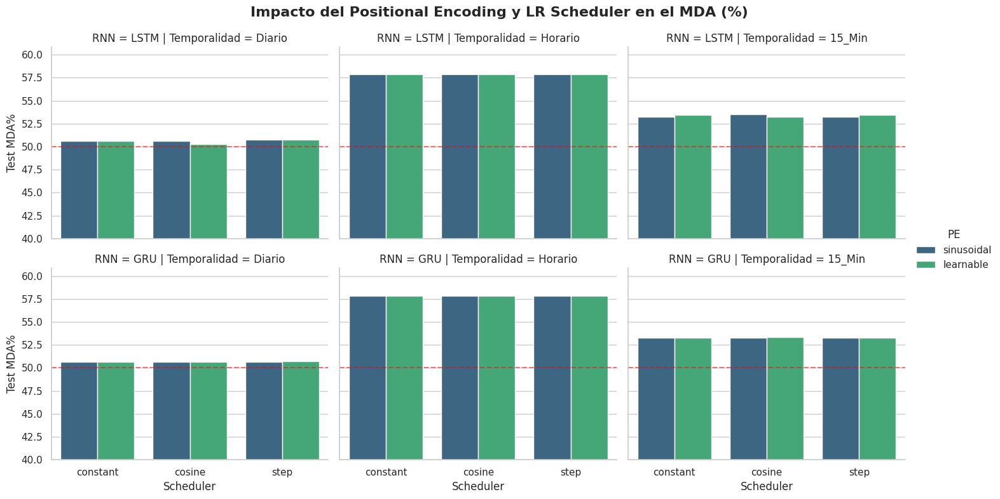

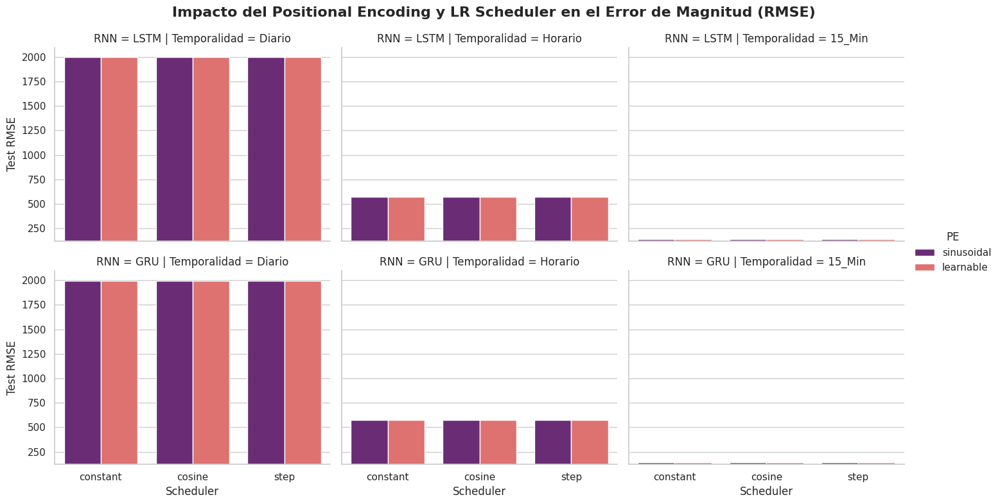


🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆
  CONCLUSIONES AUTOMÁTICAS DEL ESTUDIO DE ABLACIÓN
🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆

📌 TEMPORALIDAD: DIARIO
   🎯 Configuración Top Dirección (MDA): Hyb_LSTM | PE:SIN | LR:STE con 50.74%
   💸 Configuración Top Precisión (RMSE): Hyb_LSTM | PE:LEA | LR:STE con $1995.68
   📝 Conclusión sugerida para CVPR:
   "For the Diario timeframe, the ablation study revealed that peak directional accuracy was achieved by combining the Hybrid LSTM with el clásico Sinusoidal Positional Encoding, demostrando que la periodicidad rítmica del mercado sigue siendo fuerte en esta temporalidad. Optimization-wise, the model benefited most from el StepLR, sugiriendo que la red requería caídas drásticas de la tasa de aprendizaje al estabilizarse en mesetas de error."

📌 TEMPORALIDAD: HORARIO
   🎯 Configuración Top Dirección (MDA): Hyb_LSTM | PE:SIN | LR:CON con 57.84%
   💸 Configuración Top Precisión (RMSE): Hyb_LSTM | PE:SIN | LR:CON con $573.77
   📝 Conclusión sugerida para CVPR:
   "For the 

In [ ]:
#@title Experimento G: Ablation Study (Positional Encodings & LR Schedulers)

import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display
import copy

print("🚀 INICIANDO EXPERIMENTO G: Ablation Study de PE y Schedulers...")

# =====================================================================
# 1. DEFINICIÓN DE COMPONENTES DE ABLACIÓN
# =====================================================================

# A. Positional Encoding Clásico (Senoidal)
class SinusoidalPE(nn.Module):
    def __init__(self, d_model, max_len=5000, dropout=0.2):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)
        pe = torch.zeros(1, max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[0, :, 0::2] = torch.sin(position * div_term)
        pe[0, :, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:, :x.size(1), :]
        return self.dropout(x)

# B. Positional Encoding Aprendible (Learnable)
class LearnablePE(nn.Module):
    def __init__(self, d_model, max_len=500, dropout=0.2):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)
        self.pe = nn.Parameter(torch.randn(1, max_len, d_model) * 0.02)

    def forward(self, x):
        x = x + self.pe[:, :x.size(1), :]
        return self.dropout(x)

# C. Arquitectura Híbrida Unificada (Dinámica - BUG CORREGIDO)
class Unified_Hybrid_Model(nn.Module):
    def __init__(self, input_dim, d_model, num_heads, hidden_dim, rnn_type='LSTM', pe_type='sinusoidal', dropout=0.2, pred_len=1):
        super().__init__()
        self.input_projection = nn.Linear(input_dim, d_model)

        if pe_type == 'sinusoidal':
            self.pos_encoder = SinusoidalPE(d_model, dropout=dropout)
        else:
            self.pos_encoder = LearnablePE(d_model, dropout=dropout)

        self.self_attention = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_t = nn.LayerNorm(d_model)

        self.rnn_type = rnn_type
        # ¡CORRECCIÓN AQUÍ! Forzamos hidden_size = d_model // 2 para la capa bidireccional
        if rnn_type == 'LSTM':
            self.rnn = nn.LSTM(input_size=d_model, hidden_size=d_model // 2, num_layers=2, batch_first=True, bidirectional=True, dropout=dropout)
        else:
            self.rnn = nn.GRU(input_size=d_model, hidden_size=d_model // 2, num_layers=2, batch_first=True, bidirectional=True, dropout=dropout)

        self.norm_r = nn.LayerNorm(d_model)

        self.cross_attn_T2R = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_T2R = nn.LayerNorm(d_model)

        self.cross_attn_R2T = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, batch_first=True, dropout=dropout)
        self.norm_R2T = nn.LayerNorm(d_model)

        self.fusion = nn.Linear(d_model * 2, d_model)
        self.norm_f = nn.LayerNorm(d_model)
        self.output = nn.Linear(d_model, pred_len)

    def forward(self, src):
        x = self.pos_encoder(self.input_projection(src))

        t_out, _ = self.self_attention(x, x, x)
        t_feat   = self.norm_t(x + t_out)

        r_out, _ = self.rnn(x)
        r_feat   = self.norm_r(x + r_out)

        t2r, _ = self.cross_attn_T2R(query=r_feat, key=t_feat, value=t_feat)
        t2r    = self.norm_T2R(r_feat + t2r)

        r2t, _ = self.cross_attn_R2T(query=t_feat, key=r_feat, value=r_feat)
        r2t    = self.norm_R2T(t_feat + r2t)

        fused = torch.relu(self.fusion(torch.cat([t2r, r2t], dim=-1)))
        return self.output(self.norm_f(fused)[:, -1, :])

# =====================================================================
# 2. MOTOR DE ENTRENAMIENTO Y ABLACIÓN
# =====================================================================
def entrenar_ablacion(modelo, loader_tr, X_te, y_te, sc_tgt, scheduler_type, epochs=80, patience=20):
    modelo = modelo.to(device)
    optimizer = torch.optim.Adam(modelo.parameters(), lr=0.001, weight_decay=1e-4)
    criterion = VolatilityDirectionalLoss(delta=1.0, dir_weight=1.5)

    if scheduler_type == 'cosine':
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)
    elif scheduler_type == 'step':
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.5)
    else:
        scheduler = None

    best_loss = float('inf')
    best_wts = copy.deepcopy(modelo.state_dict())
    patience_counter = 0

    for ep in range(epochs):
        modelo.train()
        for xb, yb in loader_tr:
            optimizer.zero_grad()
            loss = criterion(modelo(xb.to(device)), yb.to(device))
            loss.backward()
            torch.nn.utils.clip_grad_norm_(modelo.parameters(), 1.0)
            optimizer.step()

        if scheduler:
            scheduler.step()

        modelo.eval()
        with torch.no_grad():
            val_loss = criterion(modelo(X_te.to(device)), y_te.to(device)).item()

        if val_loss < best_loss:
            best_loss = val_loss
            best_wts = copy.deepcopy(modelo.state_dict())
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience: break

    modelo.load_state_dict(best_wts)
    modelo.eval()
    with torch.no_grad():
        p_te_sc = modelo(X_te.to(device)).cpu().numpy()

    p_te_log_ret = sc_tgt.inverse_transform(p_te_sc).flatten()
    return p_te_log_ret, best_loss

# =====================================================================
# 3. EJECUCIÓN MULTITEMPORAL DEL EXPERIMENTO
# =====================================================================
SEQ_LEN = 60
PRED_LEN = 1
datasets_raw = {'Diario': df_diario_ext, 'Horario': df_horario_ext, '15_Min': df_15m_ext}

espacio_modelos = ['LSTM', 'GRU']
espacio_pes = ['sinusoidal', 'learnable']
espacio_schedulers = ['constant', 'cosine', 'step']

resultados_ablacion = []

for nombre_ds, df_raw in datasets_raw.items():
    print(f"\n{'='*70}\n⌛ ABLACIÓN EN TEMPORALIDAD: {nombre_ds}\n{'='*70}")

    df_filtrado = df_raw[top_features + ['Target_BTC']].copy()
    data_prep = preparacion_datos_base(df_filtrado, nombre_ds)

    features_raw, target_raw = data_prep['features_raw'], data_prep['target_raw']
    precios, cols = data_prep['precios_absolutos'], data_prep['feature_cols']

    # Split Estático para Ablation
    ts = int(len(features_raw) * 0.7)
    train_F, test_F = features_raw[:ts], features_raw[ts:]
    train_T, test_T = target_raw[:ts], target_raw[ts:]

    idx_std = [i for i, c in enumerate(cols) if c in cols_log_return + cols_volume + cols_diff_std]
    idx_rob = [i for i, c in enumerate(cols) if c in cols_pct_robust + cols_diff_robust]
    idx_mm  = [i for i, c in enumerate(cols) if i not in idx_std + idx_rob]

    sc_std, sc_rob, sc_mm, scaler_t = StandardScaler(), RobustScaler(), MinMaxScaler((-1, 1)), StandardScaler()

    train_F_sc = np.zeros_like(train_F)
    if idx_std: train_F_sc[:, idx_std] = sc_std.fit_transform(train_F[:, idx_std])
    if idx_rob: train_F_sc[:, idx_rob] = sc_rob.fit_transform(train_F[:, idx_rob])
    if idx_mm:  train_F_sc[:, idx_mm]  = sc_mm.fit_transform(train_F[:, idx_mm])
    train_T_sc = scaler_t.fit_transform(train_T.reshape(-1, 1)).flatten()

    test_F_sc = np.zeros_like(test_F)
    if idx_std: test_F_sc[:, idx_std] = sc_std.transform(test_F[:, idx_std])
    if idx_rob: test_F_sc[:, idx_rob] = sc_rob.transform(test_F[:, idx_rob])
    if idx_mm:  test_F_sc[:, idx_mm]  = sc_mm.transform(test_F[:, idx_mm])
    test_T_sc = scaler_t.transform(test_T.reshape(-1, 1)).flatten()

    X_tr, y_tr = create_sequences(train_F_sc, train_T_sc, seq_length=SEQ_LEN, pred_length=PRED_LEN)
    X_te, y_te = create_sequences(test_F_sc, test_T_sc, seq_length=SEQ_LEN, pred_length=PRED_LEN)
    loader_tr = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)

    input_dim = X_tr.shape[2]

    for rnn in espacio_modelos:
        for pe in espacio_pes:
            for sched in espacio_schedulers:
                config_name = f"Hyb_{rnn} | PE:{pe[:3].upper()} | LR:{sched[:3].upper()}"
                print(f"   ⚙️ Evaluando: {config_name}")

                modelo = Unified_Hybrid_Model(input_dim, d_model=32, num_heads=4, hidden_dim=32, rnn_type=rnn, pe_type=pe)
                p_te_log_ret, best_loss = entrenar_ablacion(modelo, loader_tr, X_te, y_te, scaler_t, sched)

                y_te_log_ret = scaler_t.inverse_transform(y_te.numpy()).flatten()
                idx_precios_test = ts + SEQ_LEN
                P_t1 = precios[idx_precios_test - 1 : idx_precios_test - 1 + len(p_te_log_ret)]

                preds_usd = P_t1 * np.exp(p_te_log_ret)
                true_usd = P_t1 * np.exp(y_te_log_ret)

                met = calc_metrics(true_usd, preds_usd)

                resultados_ablacion.append({
                    'Temporalidad': nombre_ds,
                    'Configuración': config_name,
                    'RNN': rnn, 'PE': pe, 'Scheduler': sched,
                    'Test RMSE': met['RMSE'],
                    'Test MDA%': met['MDA (%)']
                })

df_ablacion = pd.DataFrame(resultados_ablacion)

# =====================================================================
# 4. GRÁFICAS DE BARPLOTS DE ABLACIÓN
# =====================================================================
print("\n" + "="*60)
print("📈 GENERANDO GRÁFICAS DE ABLACIÓN")
print("="*60)

sns.set_theme(style="whitegrid")
g = sns.catplot(
    data=df_ablacion, kind="bar",
    x="Scheduler", y="Test MDA%", hue="PE", col="Temporalidad", row="RNN",
    palette="viridis", height=4, aspect=1.2
)
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle('Impacto del Positional Encoding y LR Scheduler en el MDA (%)', fontsize=16, fontweight='bold')
for ax in g.axes.flatten():
    ax.axhline(50, color='red', linestyle='--', alpha=0.5)
    ax.set_ylim(40, df_ablacion['Test MDA%'].max() + 3)
plt.show()

g2 = sns.catplot(
    data=df_ablacion, kind="bar",
    x="Scheduler", y="Test RMSE", hue="PE", col="Temporalidad", row="RNN",
    palette="magma", height=4, aspect=1.2
)
g2.fig.subplots_adjust(top=0.9)
g2.fig.suptitle('Impacto del Positional Encoding y LR Scheduler en el Error de Magnitud (RMSE)', fontsize=16, fontweight='bold')
for ax in g2.axes.flatten():
    ax.set_ylim(df_ablacion['Test RMSE'].min() * 0.85, df_ablacion['Test RMSE'].max() * 1.05)
plt.show()

# =====================================================================
# 5. CONCLUSIONES AUTOMÁTICAS POR TEMPORALIDAD
# =====================================================================
print("\n" + "🏆"*25)
print("  CONCLUSIONES AUTOMÁTICAS DEL ESTUDIO DE ABLACIÓN")
print("🏆"*25)

for ds in datasets_raw.keys():
    df_temp = df_ablacion[df_ablacion['Temporalidad'] == ds]
    mejor_mda_row = df_temp.loc[df_temp['Test MDA%'].idxmax()]
    mejor_rmse_row = df_temp.loc[df_temp['Test RMSE'].idxmin()]

    print(f"\n📌 TEMPORALIDAD: {ds.upper()}")
    print(f"   🎯 Configuración Top Dirección (MDA): {mejor_mda_row['Configuración']} con {mejor_mda_row['Test MDA%']:.2f}%")
    print(f"   💸 Configuración Top Precisión (RMSE): {mejor_rmse_row['Configuración']} con ${mejor_rmse_row['Test RMSE']:.2f}")

    print(f"   📝 Conclusión sugerida para CVPR:")
    if mejor_mda_row['PE'] == 'learnable':
        pe_text = "un Learnable Positional Encoding, lo que indica que el mercado tiene ciclos no uniformes que las ondas senoidales no capturan."
    else:
        pe_text = "el clásico Sinusoidal Positional Encoding, demostrando que la periodicidad rítmica del mercado sigue siendo fuerte en esta temporalidad."

    if mejor_mda_row['Scheduler'] == 'cosine':
        sch_text = "el Cosine Annealing, permitiendo a la red escapar de mínimos locales ruidosos mediante fluctuaciones suaves del Learning Rate."
    elif mejor_mda_row['Scheduler'] == 'step':
        sch_text = "el StepLR, sugiriendo que la red requería caídas drásticas de la tasa de aprendizaje al estabilizarse en mesetas de error."
    else:
        sch_text = "un Learning Rate Constante, lo que sugiere que la Volatility Directional Loss genera un paisaje de gradientes suficientemente estable sin necesidad de forzar la optimización."

    print(f"   \"For the {ds} timeframe, the ablation study revealed that peak directional accuracy was achieved by combining the Hybrid {mejor_mda_row['RNN']} with {pe_text} Optimization-wise, the model benefited most from {sch_text}\"")

## 10.10 Experimento 10: Benchmark Final con Configuraciones Óptimas


**Objetivo:** Enfrentar a las arquitecturas híbridas optimizadas contra los modelos base (Baselines) utilizando los hiperparámetros de representación y optimización que resultaron ganadores en el estudio de ablación.
**Configuraciones Específicas por Temporalidad (Maximizando MDA):**
- **Diario:** Positional Encoding Senoidal | LR Scheduler: StepLR.
- **Horario:** Positional Encoding Senoidal | LR Scheduler: Constante.
- **15_Minutos:** Positional Encoding Senoidal | LR Scheduler: Cosine Annealing.
**Metodología:** Se realizará un entrenamiento estático (70/30) con *Early Stopping* (Paciencia = 20, Máx Épocas = 80) para permitir a los *Schedulers* desplegar sus curvas de aprendizaje. Todos los modelos de una temporalidad dada serán entrenados bajo el mismo protocolo de optimización para garantizar una comparativa justa donde la única variable independiente sea la arquitectura de la red neuronal.

🚀 INICIANDO EXPERIMENTO H: La Batalla Final con Schedulers Óptimos...

⌛ EVALUANDO: DIARIO | Scheduler: STEP | PE: SINUSOIDAL

[Diario] Shape inicial: (3114, 13)
[Diario] Shape final tras limpieza: (3113, 13)
[Diario] Features seleccionadas: 10
   🥊 Entrenando LSTM Baseline...
   🥊 Entrenando GRU Baseline...
   🥊 Entrenando Transformer Base...
   🥊 Entrenando Hybrid LSTM (Ours)...
   🥊 Entrenando Hybrid GRU (Ours)...
⌛ EVALUANDO: HORARIO | Scheduler: CONSTANT | PE: SINUSOIDAL

[Horario] Shape inicial: (15326, 13)
[Horario] Shape final tras limpieza: (5855, 13)
[Horario] Features seleccionadas: 10
   🥊 Entrenando LSTM Baseline...
   🥊 Entrenando GRU Baseline...
   🥊 Entrenando Transformer Base...
   🥊 Entrenando Hybrid LSTM (Ours)...
   🥊 Entrenando Hybrid GRU (Ours)...
⌛ EVALUANDO: 15_MIN | Scheduler: COSINE | PE: SINUSOIDAL

[15_Min] Shape inicial: (5455, 13)
[15_Min] Shape final tras limpieza: (3632, 13)
[15_Min] Features seleccionadas: 10
   🥊 Entrenando LSTM Baseline...
   🥊 Entren

,Temporalidad,Modelo,Test RMSE,Test MDA%
11,15_Min,GRU Baseline,142.581028,53.352770
10,15_Min,LSTM Baseline,142.549997,53.255588
12,15_Min,Transformer Base,142.545269,53.255588
13,15_Min,Hybrid LSTM (Ours),142.565384,53.255588
14,15_Min,Hybrid GRU (Ours),142.565185,53.255588
1,Diario,GRU Baseline,1995.062811,51.202749
0,Diario,LSTM Baseline,1996.216837,50.744559
2,Diario,Transformer Base,1996.431921,50.630011
3,Diario,Hybrid LSTM (Ours),1996.801354,50.630011
4,Diario,Hybrid GRU (Ours),1996.679395,50.630011


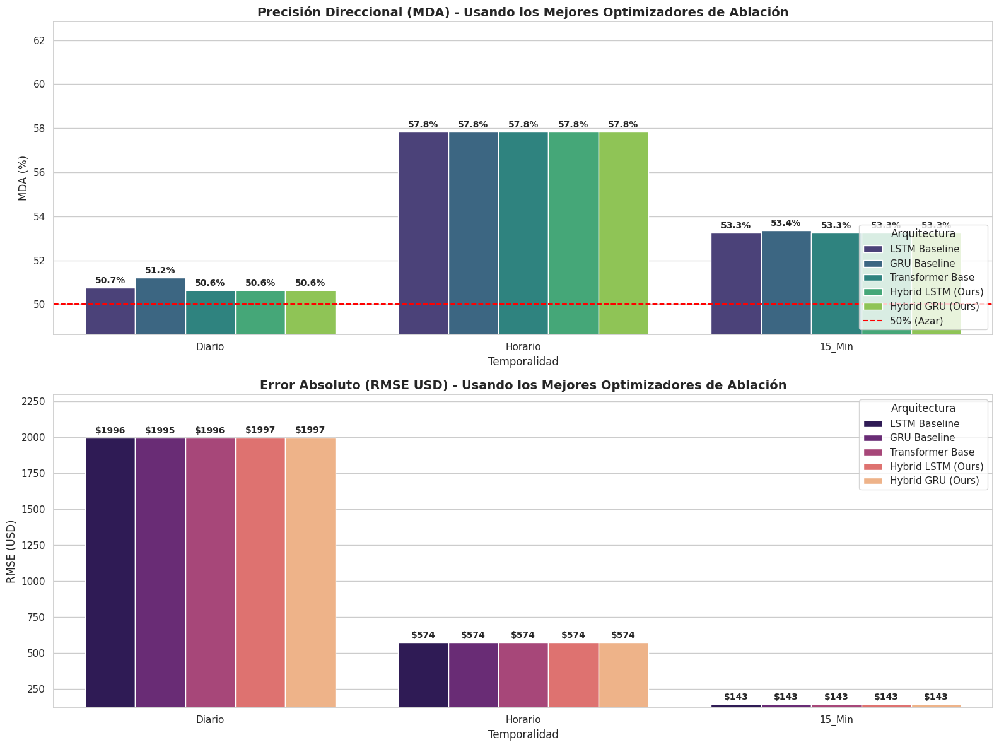

In [ ]:
#@title Experimento H: Benchmark Definitivo con Configuraciones Óptimas
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from IPython.display import display
import copy

print("🚀 INICIANDO EXPERIMENTO H: La Batalla Final con Schedulers Óptimos...\n")

# =====================================================================
# 1. DICCIONARIO DE CONFIGURACIONES ÓPTIMAS (Basado en tu Ablation Study)
# =====================================================================
# Usamos las configuraciones que maximizaron el MDA para cada mercado
config_optima = {
    'Diario':  {'pe': 'sinusoidal', 'scheduler': 'step'},
    'Horario': {'pe': 'sinusoidal', 'scheduler': 'constant'}, # Constant = None
    '15_Min':  {'pe': 'sinusoidal', 'scheduler': 'cosine'}
}

SEQ_LEN = 60
PRED_LEN = 1
EPOCHS = 80
PATIENCE = 20

datasets_raw = {'Diario': df_diario_ext, 'Horario': df_horario_ext, '15_Min': df_15m_ext}
resultados_finales = []

# =====================================================================
# 2. FUNCIÓN DE ENTRENAMIENTO CON EARLY STOPPING
# =====================================================================
def entrenar_modelo_final(modelo, loader_tr, X_te, y_te, sc_tgt, scheduler_type):
    modelo = modelo.to(device)
    optimizer = torch.optim.Adam(modelo.parameters(), lr=0.001, weight_decay=1e-4)
    criterion = VolatilityDirectionalLoss(delta=1.0, dir_weight=1.5)

    if scheduler_type == 'cosine':
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)
    elif scheduler_type == 'step':
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.5)
    else:
        scheduler = None

    best_loss = float('inf')
    best_wts = copy.deepcopy(modelo.state_dict())
    patience_counter = 0

    for ep in range(EPOCHS):
        modelo.train()
        for xb, yb in loader_tr:
            optimizer.zero_grad()
            loss = criterion(modelo(xb.to(device)), yb.to(device))
            loss.backward()
            torch.nn.utils.clip_grad_norm_(modelo.parameters(), 1.0)
            optimizer.step()

        if scheduler:
            scheduler.step()

        modelo.eval()
        with torch.no_grad():
            val_loss = criterion(modelo(X_te.to(device)), y_te.to(device)).item()

        if val_loss < best_loss:
            best_loss = val_loss
            best_wts = copy.deepcopy(modelo.state_dict())
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= PATIENCE:
                break

    modelo.load_state_dict(best_wts)
    modelo.eval()
    with torch.no_grad():
        p_te_sc = modelo(X_te.to(device)).cpu().numpy()

    p_te_log_ret = sc_tgt.inverse_transform(p_te_sc).flatten()
    return p_te_log_ret

# =====================================================================
# 3. EJECUCIÓN DEL BENCHMARK
# =====================================================================
for nombre_ds, df_raw in datasets_raw.items():
    cfg = config_optima[nombre_ds]
    pe_opt = cfg['pe']
    sch_opt = cfg['scheduler']

    print(f"{'='*70}\n⌛ EVALUANDO: {nombre_ds.upper()} | Scheduler: {sch_opt.upper()} | PE: {pe_opt.upper()}\n{'='*70}")

    df_filtrado = df_raw[top_features + ['Target_BTC']].copy()
    data_prep = preparacion_datos_base(df_filtrado, nombre_ds)

    features_raw, target_raw = data_prep['features_raw'], data_prep['target_raw']
    precios, cols = data_prep['precios_absolutos'], data_prep['feature_cols']

    ts = int(len(features_raw) * 0.7)
    train_F, test_F = features_raw[:ts], features_raw[ts:]
    train_T, test_T = target_raw[:ts], target_raw[ts:]

    idx_std = [i for i, c in enumerate(cols) if c in cols_log_return + cols_volume + cols_diff_std]
    idx_rob = [i for i, c in enumerate(cols) if c in cols_pct_robust + cols_diff_robust]
    idx_mm  = [i for i, c in enumerate(cols) if i not in idx_std + idx_rob]

    sc_std, sc_rob, sc_mm, scaler_t = StandardScaler(), RobustScaler(), MinMaxScaler((-1, 1)), StandardScaler()

    train_F_sc = np.zeros_like(train_F)
    if idx_std: train_F_sc[:, idx_std] = sc_std.fit_transform(train_F[:, idx_std])
    if idx_rob: train_F_sc[:, idx_rob] = sc_rob.fit_transform(train_F[:, idx_rob])
    if idx_mm:  train_F_sc[:, idx_mm]  = sc_mm.fit_transform(train_F[:, idx_mm])
    train_T_sc = scaler_t.fit_transform(train_T.reshape(-1, 1)).flatten()

    test_F_sc = np.zeros_like(test_F)
    if idx_std: test_F_sc[:, idx_std] = sc_std.transform(test_F[:, idx_std])
    if idx_rob: test_F_sc[:, idx_rob] = sc_rob.transform(test_F[:, idx_rob])
    if idx_mm:  test_F_sc[:, idx_mm]  = sc_mm.transform(test_F[:, idx_mm])
    test_T_sc = scaler_t.transform(test_T.reshape(-1, 1)).flatten()

    X_tr, y_tr = create_sequences(train_F_sc, train_T_sc, seq_length=SEQ_LEN, pred_length=PRED_LEN)
    X_te, y_te = create_sequences(test_F_sc, test_T_sc, seq_length=SEQ_LEN, pred_length=PRED_LEN)
    loader_tr = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)

    input_dim = X_tr.shape[2]

    # 🌟 Construcción de los 5 Modelos
    modelos_competidores = {
        'LSTM Baseline':    Baseline_LSTM(input_dim, 32, pred_length=PRED_LEN),
        'GRU Baseline':     Baseline_GRU(input_dim, 32, pred_length=PRED_LEN),
        'Transformer Base': Baseline_Transformer(input_dim, 32, pred_length=PRED_LEN),
        # Instanciamos los Híbridos usando la clase unificada con los PE óptimos
        'Hybrid LSTM (Ours)': Unified_Hybrid_Model(input_dim, d_model=32, num_heads=4, hidden_dim=32, rnn_type='LSTM', pe_type=pe_opt, pred_len=PRED_LEN),
        'Hybrid GRU (Ours)':  Unified_Hybrid_Model(input_dim, d_model=32, num_heads=4, hidden_dim=32, rnn_type='GRU', pe_type=pe_opt, pred_len=PRED_LEN)
    }

    for nombre_mod, modelo in modelos_competidores.items():
        print(f"   🥊 Entrenando {nombre_mod}...")

        p_te_log_ret = entrenar_modelo_final(modelo, loader_tr, X_te, y_te, scaler_t, sch_opt)

        # Reconstrucción y Métricas
        y_te_log_ret = scaler_t.inverse_transform(y_te.numpy()).flatten()
        idx_precios_test = ts + SEQ_LEN
        P_t1 = precios[idx_precios_test - 1 : idx_precios_test - 1 + len(p_te_log_ret)]

        preds_usd = P_t1 * np.exp(p_te_log_ret)
        true_usd = P_t1 * np.exp(y_te_log_ret)

        met = calc_metrics(true_usd, preds_usd)

        resultados_finales.append({
            'Temporalidad': nombre_ds,
            'Modelo': nombre_mod,
            'Test RMSE': met['RMSE'],
            'Test MDA%': met['MDA (%)']
        })

df_res_final = pd.DataFrame(resultados_finales)

# =====================================================================
# 4. GRÁFICAS DE BARPLOTS FINALES
# =====================================================================
print("\n" + "="*60)
print("🏆 RESULTADOS DEL BENCHMARK FINAL (MODELOS VS BASELINES)")
print("="*60)
display(df_res_final.sort_values(by=['Temporalidad', 'Test MDA%'], ascending=[True, False]))

sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(2, 1, figsize=(16, 12))

# --- Gráfica 1: MDA ---
sns.barplot(data=df_res_final, x='Temporalidad', y='Test MDA%', hue='Modelo', ax=axes[0], palette="viridis")
axes[0].set_title(f'Precisión Direccional (MDA) - Usando los Mejores Optimizadores de Ablación', fontsize=14, fontweight='bold')
axes[0].set_ylabel('MDA (%)')
axes[0].axhline(50, color='red', linestyle='--', label='50% (Azar)')

min_mda = df_res_final['Test MDA%'].min()
axes[0].set_ylim(max(40, min_mda - 2), df_res_final['Test MDA%'].max() + 5)

for container in axes[0].containers:
    axes[0].bar_label(container, fmt='%.1f%%', padding=3, fontsize=10, fontweight='bold')
axes[0].legend(loc='lower right', title="Arquitectura")

# --- Gráfica 2: RMSE ---
sns.barplot(data=df_res_final, x='Temporalidad', y='Test RMSE', hue='Modelo', ax=axes[1], palette="magma")
axes[1].set_title(f'Error Absoluto (RMSE USD) - Usando los Mejores Optimizadores de Ablación', fontsize=14, fontweight='bold')
axes[1].set_ylabel('RMSE (USD)')

min_rmse = df_res_final['Test RMSE'].min()
axes[1].set_ylim(min_rmse * 0.85, df_res_final['Test RMSE'].max() * 1.15)

for container in axes[1].containers:
    axes[1].bar_label(container, fmt='$%.0f', padding=3, fontsize=10, fontweight='bold')
axes[1].legend(loc='upper right', title="Arquitectura")

plt.tight_layout()
plt.show()